In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
import seaborn as sns
from sklearn.preprocessing import StandardScaler, OneHotEncoder, RobustScaler, MinMaxScaler, MaxAbsScaler, OrdinalEncoder, LabelEncoder
from category_encoders import TargetEncoder
from sklearn.linear_model import LinearRegression, LogisticRegression, Ridge
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import GradientBoostingRegressor, VotingRegressor, RandomForestRegressor
from sklearn.model_selection import  train_test_split, cross_val_score, GridSearchCV
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.pipeline import Pipeline
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.compose import ColumnTransformer
from sklearn.metrics import roc_auc_score, r2_score, mean_absolute_error, mean_squared_error
from sklearn.exceptions import ConvergenceWarning
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import logging
import warnings

warnings.filterwarnings("ignore", category=RuntimeWarning) # To hide warnings as unwanted warnings are shown due to encountering Nan / infinite values while comparing

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/engage-2-value-from-clicks-to-conversions/sample_submission.csv
/kaggle/input/engage-2-value-from-clicks-to-conversions/train_data.csv
/kaggle/input/engage-2-value-from-clicks-to-conversions/test_data.csv


<br>
<h1 style="font-family: Courier New; font-size: 3.5rem; text-align: center; margin-left: auto; margin-right: auto; font-weight: bold;">Introduction</h1>

In [2]:
print("\nName : Shahzada Moon")
print("\nRoll No. : 23f2002668")
print("\nNotebook Name : 23f2002668-notebook-t22025")
print("\nCourse : Machine Learning Practice - Project")
print("\nCourse Faculty : Ashish Tendulkar Machine Learning Specialist, Google Research, India")
print(f"\nCourse Instructors :-  \n\n    1. Jimmi Kr. Bharti (M-Tech, IIT Madras) \n    2. Manoj Kumar Khara (M-Tech, IIT Madras)")


Name : Shahzada Moon

Roll No. : 23f2002668

Notebook Name : 23f2002668-notebook-t22025

Course : Machine Learning Practice - Project

Course Faculty : Ashish Tendulkar Machine Learning Specialist, Google Research, India

Course Instructors :-  

    1. Jimmi Kr. Bharti (M-Tech, IIT Madras) 
    2. Manoj Kumar Khara (M-Tech, IIT Madras)


In [3]:

# Access Train & Test Datasets

warnings.filterwarnings("ignore", category=RuntimeWarning) # To hide warnings as unwanted warnings are shown due to encountering Nan / infinite values while comparing
warnings.filterwarnings("ignore", category=ConvergenceWarning)


# Load data
train_data = pd.read_csv('/kaggle/input/engage-2-value-from-clicks-to-conversions/train_data.csv')
test_data = pd.read_csv('/kaggle/input/engage-2-value-from-clicks-to-conversions/test_data.csv')


<br><br>

## **Copy The Datasets**

In [4]:
train_df = train_data.copy()
test_df = test_data.copy()

**Important :-**

* Here I am copying datasets because copying origional dataset is necessary during data analysis and preprocessing, which makes the origional datasets safe from being alter or modify, thus it is requirement for dataset integrity.

<br><br>

<br><br><br>

# **Elimentary Data Analysis (E.D.A.)**
---

<br><br><br>

## **Shape of The Train Dataset**

In [5]:
train_df.shape


(116023, 52)

**Interpretation :-**

* 116023 - Rows in Dataset
* 52 - Columns in Dataset

<br><br>

## **Top-10 Rows of Train Dataset**

In [6]:
train_df.head(10)

,trafficSource.isTrueDirect,purchaseValue,browser,device.screenResolution,trafficSource.adContent,trafficSource.keyword,screenSize,geoCluster,trafficSource.adwordsClickInfo.slot,device.mobileDeviceBranding,...,device.language,deviceType,userChannel,device.browserVersion,totalHits,device.screenColors,sessionStart,geoNetwork.continent,device.isMobile,new_visits
0,NaN,0.0,Edge,not available in demo dataset,NaN,NaN,medium,Region_2,NaN,not available in demo dataset,...,not available in demo dataset,desktop,Social,not available in demo dataset,1,not available in demo dataset,1500100799,Americas,False,1.0
1,True,0.0,Chrome,not available in demo dataset,NaN,NaN,medium,Region_3,NaN,not available in demo dataset,...,not available in demo dataset,desktop,Direct,not available in demo dataset,1,not available in demo dataset,1495262065,Americas,False,1.0
2,True,0.0,Chrome,not available in demo dataset,NaN,(not provided),medium,Region_2,NaN,not available in demo dataset,...,not available in demo dataset,desktop,Organic Search,not available in demo dataset,6,not available in demo dataset,1508510328,Europe,False,NaN
3,NaN,0.0,Internet Explorer,not available in demo dataset,NaN,NaN,medium,Region_4,NaN,not available in demo dataset,...,not available in demo dataset,desktop,Social,not available in demo dataset,1,not available in demo dataset,1483431838,Asia,False,1.0
4,True,88950000.0,Chrome,not available in demo dataset,NaN,NaN,medium,Region_3,NaN,not available in demo dataset,...,not available in demo dataset,desktop,Direct,not available in demo dataset,66,not available in demo dataset,1475804633,Americas,False,1.0
5,True,28000000.0,Chrome,not available in demo dataset,NaN,NaN,medium,Region_4,NaN,not available in demo dataset,...,not available in demo dataset,desktop,Referral,not available in demo dataset,48,not available in demo dataset,1505506252,Americas,False,NaN
6,NaN,80510000.0,Chrome,not available in demo dataset,NaN,NaN,medium,Region_2,NaN,not available in demo dataset,...,not available in demo dataset,desktop,Referral,not available in demo dataset,17,not available in demo dataset,1472053897,Americas,False,1.0
7,NaN,0.0,Chrome,not available in demo dataset,NaN,(not provided),medium,Region_5,NaN,not available in demo dataset,...,not available in demo dataset,mobile,Organic Search,not available in demo dataset,1,not available in demo dataset,1490756441,Asia,True,1.0
8,True,0.0,Chrome,not available in demo dataset,NaN,(not provided),medium,Region_2,NaN,not available in demo dataset,...,not available in demo dataset,desktop,Organic Search,not available in demo dataset,4,not available in demo dataset,1495702257,Asia,False,NaN
9,NaN,0.0,Safari,not available in demo dataset,NaN,(not provided),medium,Region_1,NaN,not available in demo dataset,...,not available in demo dataset,mobile,Organic Search,not available in demo dataset,1,not available in demo dataset,1500868868,Asia,True,1.0


<br><br>

## **Columns of The Train Dataset**

In [7]:
columns = list(train_df.columns.sort_values())

for col in columns :
    print(col)

browser
browserMajor
date
device.browserSize
device.browserVersion
device.flashVersion
device.isMobile
device.language
device.mobileDeviceBranding
device.mobileDeviceMarketingName
device.mobileDeviceModel
device.mobileInputSelector
device.operatingSystemVersion
device.screenColors
device.screenResolution
deviceType
gclIdPresent
geoCluster
geoNetwork.city
geoNetwork.continent
geoNetwork.metro
geoNetwork.networkDomain
geoNetwork.networkLocation
geoNetwork.region
geoNetwork.subContinent
locationCountry
locationZone
new_visits
os
pageViews
purchaseValue
screenSize
sessionId
sessionNumber
sessionStart
socialEngagementType
totalHits
totals.bounces
totals.visits
trafficSource
trafficSource.adContent
trafficSource.adwordsClickInfo.adNetworkType
trafficSource.adwordsClickInfo.isVideoAd
trafficSource.adwordsClickInfo.page
trafficSource.adwordsClickInfo.slot
trafficSource.campaign
trafficSource.isTrueDirect
trafficSource.keyword
trafficSource.medium
trafficSource.referralPath
userChannel
userId


<br><br>
## **Datatype of Each Column**

In [8]:
print(f"\n{train_df.dtypes}")


trafficSource.isTrueDirect                       object
purchaseValue                                   float64
browser                                          object
device.screenResolution                          object
trafficSource.adContent                          object
trafficSource.keyword                            object
screenSize                                       object
geoCluster                                       object
trafficSource.adwordsClickInfo.slot              object
device.mobileDeviceBranding                      object
device.mobileInputSelector                       object
userId                                            int64
trafficSource.campaign                           object
device.mobileDeviceMarketingName                 object
geoNetwork.networkDomain                         object
gclIdPresent                                      int64
device.operatingSystemVersion                    object
sessionNumber                                  

<p style="font-size: 1.15rem; font-family: Courier New;"> <b style="font-size: 1.25rem; font-family: Courier New; font-weight: bold;"> Numeric Columns &nbsp; &nbsp; --> &nbsp; &nbsp;</b> [ int64, float64 ] </p>

<p style="font-size: 1.15rem; font-family: Courier New;"> <b style="font-size: 1.25rem; font-family: Courier New; font-weight: bold;"> Category Columns &nbsp; &nbsp;--> &nbsp; &nbsp;</b> [ object, bool ] </p>

<br><br>

## **Train Dataset Columns - Information**

In [9]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116023 entries, 0 to 116022
Data columns (total 52 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   trafficSource.isTrueDirect                    42890 non-null   object 
 1   purchaseValue                                 116023 non-null  float64
 2   browser                                       116023 non-null  object 
 3   device.screenResolution                       116023 non-null  object 
 4   trafficSource.adContent                       2963 non-null    object 
 5   trafficSource.keyword                         44162 non-null   object 
 6   screenSize                                    116023 non-null  object 
 7   geoCluster                                    116023 non-null  object 
 8   trafficSource.adwordsClickInfo.slot           4281 non-null    object 
 9   device.mobileDeviceBranding                   11

<br><br>

## **Description of Numerical Columns in Train Dataset**

In [10]:
train_df.describe()

,purchaseValue,userId,gclIdPresent,sessionNumber,totals.visits,sessionId,trafficSource.adwordsClickInfo.page,pageViews,locationZone,totals.bounces,date,totalHits,sessionStart,new_visits
count,1.160230e+05,116023.000000,116023.000000,116023.000000,116023.0,1.160230e+05,4281.000000,116015.000000,116023.0,47148.0,1.160230e+05,116023.000000,1.160230e+05,80518.0
mean,2.656393e+07,61094.356231,0.037019,2.691311,1.0,1.493429e+09,1.019622,8.412352,8.0,1.0,2.016860e+07,10.607371,1.493429e+09,1.0
std,2.051825e+08,35240.756859,0.188808,10.451613,0.0,1.528798e+07,0.174517,14.344937,0.0,0.0,6.182322e+03,19.629576,1.528798e+07,0.0
min,0.000000e+00,0.000000,0.000000,1.000000,1.0,1.470035e+09,1.000000,1.000000,8.0,1.0,2.016080e+07,1.000000,1.470035e+09,1.0
25%,0.000000e+00,30603.500000,0.000000,1.000000,1.0,1.480066e+09,1.000000,1.000000,8.0,1.0,2.016112e+07,1.000000,1.480066e+09,1.0
50%,0.000000e+00,61014.000000,0.000000,1.000000,1.0,1.491646e+09,1.000000,2.000000,8.0,1.0,2.017041e+07,2.000000,1.491646e+09,1.0
75%,0.000000e+00,91616.500000,0.000000,2.000000,1.0,1.505079e+09,1.000000,10.000000,8.0,1.0,2.017091e+07,12.000000,1.505079e+09,1.0
max,2.312950e+10,122276.000000,1.000000,447.000000,1.0,1.525157e+09,5.000000,469.000000,8.0,1.0,2.018043e+07,500.000000,1.525157e+09,1.0


<br><br>

## **Numeric Columns With Null Values**

In [11]:
num_columns = list(train_df.select_dtypes(include="number"))
num_columns.remove('purchaseValue')

num_null_columns, total_num_null_columns, counts = [], [], {}

print(f"\n|{51 * '-'}|{25 * '-'}|{20 * '-'}|")
print(f"| Columns With Null Values{(50 - len('Columns With Null Values')) * ' '}|{5 * ' '}Total Null Values{(20 - (len('Total Null Values'))) * ' '}|{5 * ' '}Percentage{(15 - len('Percentage')) * ' '}|")
print(f"|{51 * '-'}|{25 * '-'}|{20 * '-'}|")
#print(f"|{51 * ' '}|{25 * ' '}|{20 * ' '}|")

for col in num_columns :
    val = train_df[col].isna().sum()
    if val != 0 :
        per = round(val * 100 / train_df.shape[0], 4)
        if per >= 70.0 :
            num_null_columns.append(col)
        total_num_null_columns.append(col)
        counts[col] = val
        print(f"| {col}{(50-len(col)) * ' '}|{5 * ' '}{val}{(20 - (len(str(val)))) * ' '}|{5 * ' '}{per}{(15 - len(str(per))) * ' '}|")

print(f"|{51 * '_'}|{25 * '_'}|{20 * '_'}|\n\n")

print(f"Total Null Columns With >70% Null / Missing Values : {len(num_null_columns)}")


|---------------------------------------------------|-------------------------|--------------------|
| Columns With Null Values                          |     Total Null Values   |     Percentage     |
|---------------------------------------------------|-------------------------|--------------------|
| trafficSource.adwordsClickInfo.page               |     111742              |     96.3102        |
| pageViews                                         |     8                   |     0.0069         |
| totals.bounces                                    |     68875               |     59.3632        |
| new_visits                                        |     35505               |     30.6017        |
|___________________________________________________|_________________________|____________________|


Total Null Columns With >70% Null / Missing Values : 1


#### **Interpretation :**

<ul style="font-family: Courier New; font-size: 1.05rem;">
    <li>There is only 4 numeric columns with null / missing values.</li>
    <li>There is only 1 numeric column with more than 70% null / missing values, and hence this column lack useful information due to which this column does not represent distribution well.</li>
    <li>Thus, this column can be removed from the dataset.</li>
</ul>

<br><br>

## **Visualization of Null / Missing Values Using Bar Chart**

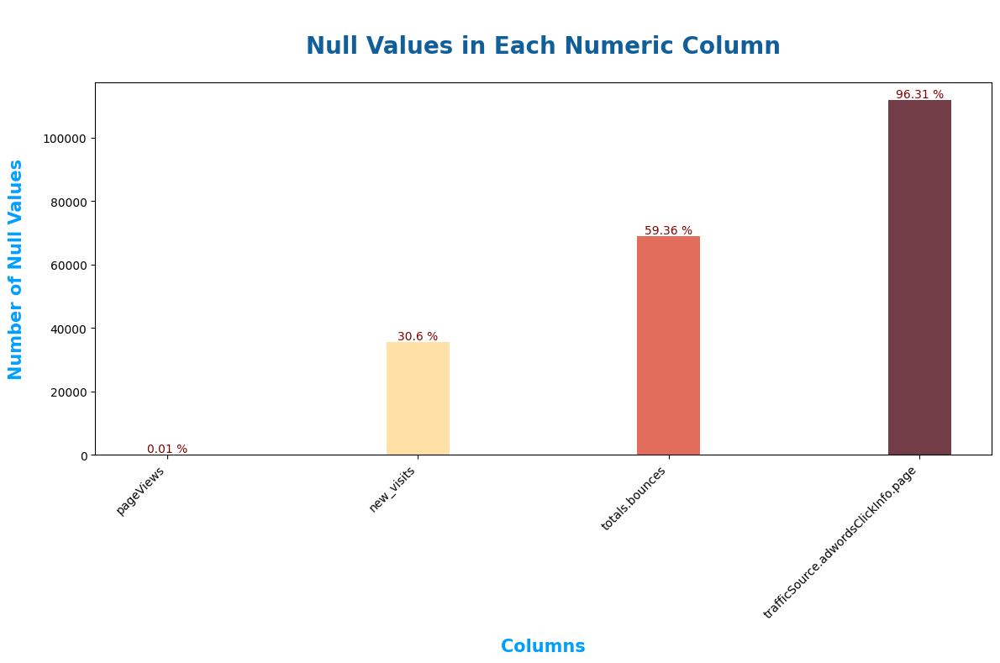

In [12]:
x = []
y = list(counts.values())
y.sort()
sorted_counts = {}
count = 0
for i in y :
    for j in counts :
      if i == counts[j] and j not in x :
        x.append(j)

colors = ["#c9cba3","#ffe1a8","#e26d5c","#723d46","#472d30"]
plt.figure(figsize=(12, 8))
bars = plt.bar(x, y, color=colors, width=0.25, alpha=1)
plt.title('\nNull Values in Each Numeric Column', color="#115f9a", fontsize=20, fontweight='bold', pad=25)
plt.xlabel('Columns', color="#009fff", fontsize=15, fontweight='bold', labelpad=15)
plt.ylabel('Number of Null Values', color="#009fff", fontsize=15, fontweight='bold', labelpad=15)
plt.xticks(rotation=45, ha='right')  # Rotate and align x-labels

for bar in bars:
    height = bar.get_height()
    percent = round((bar.get_height() * 100 / train_df.shape[0]), 2)
    plt.text(bar.get_x() + bar.get_width()/2, height + 1, str(percent) + ' %',
             ha='center', va='bottom', fontsize=10, color="maroon")

plt.tight_layout()
plt.show()

<br><br>

## **Unique Values in Each Numeric Column**

In [13]:
num_unique_columns, total_num_unique_columns = [], {}

print(f"\n|{51 * '-'}|{25 * '-'}|")
print(f"| Columns{(50 - len('Columns')) * ' '}|{5 * ' '}Total Unique Values{(20 - (len('Total Unique Values'))) * ' '}|")
print(f"|{51 * '-'}|{25 * '-'}|")
#print(f"|{51 * ' '}|{25 * ' '}|{20 * ' '}|")

# List of Numeric Columns
num_columns = list(train_df.select_dtypes(include="number"))
num_columns.remove('purchaseValue')

for col in num_columns :
    
    # Count of total unique values in each column
    val = len(list(train_df[col].unique())) 
    if val == 1 :
        num_unique_columns.append(col)
    elif val == 2 :
        if col in total_num_null_columns :
            num_unique_columns.append(col)
            
            # Because there are two unique values in which one is nan.
            val = 1                               
    counts[col] = val
    total_num_unique_columns[col] = val
    print(f"| {col}{(50-len(col)) * ' '}|{5 * ' '}{val}{(20 - (len(str(val)))) * ' '}|")

print(f"|{51 * '_'}|{25 * '_'}|\n\n")


print(f"Columns With Only 1 - Unique Value : \n")
count = 1
for col in num_unique_columns :
    print(f"{count}.{' ' * (3 - len(str(count)))}{col}")
    count += 1



|---------------------------------------------------|-------------------------|
| Columns                                           |     Total Unique Values |
|---------------------------------------------------|-------------------------|
| userId                                            |     100499              |
| gclIdPresent                                      |     2                   |
| sessionNumber                                     |     230                 |
| totals.visits                                     |     1                   |
| sessionId                                         |     107379              |
| trafficSource.adwordsClickInfo.page               |     6                   |
| pageViews                                         |     176                 |
| locationZone                                      |     1                   |
| totals.bounces                                    |     1                   |
| date                                 

#### **Interpretation :**

<ul style="font-family: Courier New; font-size: 1.05rem;">
    <li>There are 4 columns which have just only one unique value.</li>
    <li>Machine Learning Models learn from variation in data.</li>
    <li>These columns have only one unique value due to which these columns add no information in the Machine Learning Models.</li>
    <li>Adding these 4 columns will increase the dimensionality of the dataset very much and hence slow down the Machine Learning Model learning.</li>
    <li>In Data Structures & Algorithms, at first we learn that there is the first key requirement which is '`Less Time Complexity`' & '`Less Space Complexity`', but presence of these columns in dataset will violate this requirement.</li>
    <li>Hence, these columns can be easily ignored and removed from dataset.</li>
</ul>

<br><br>

## **Visualization of Unique Values in Each Column**

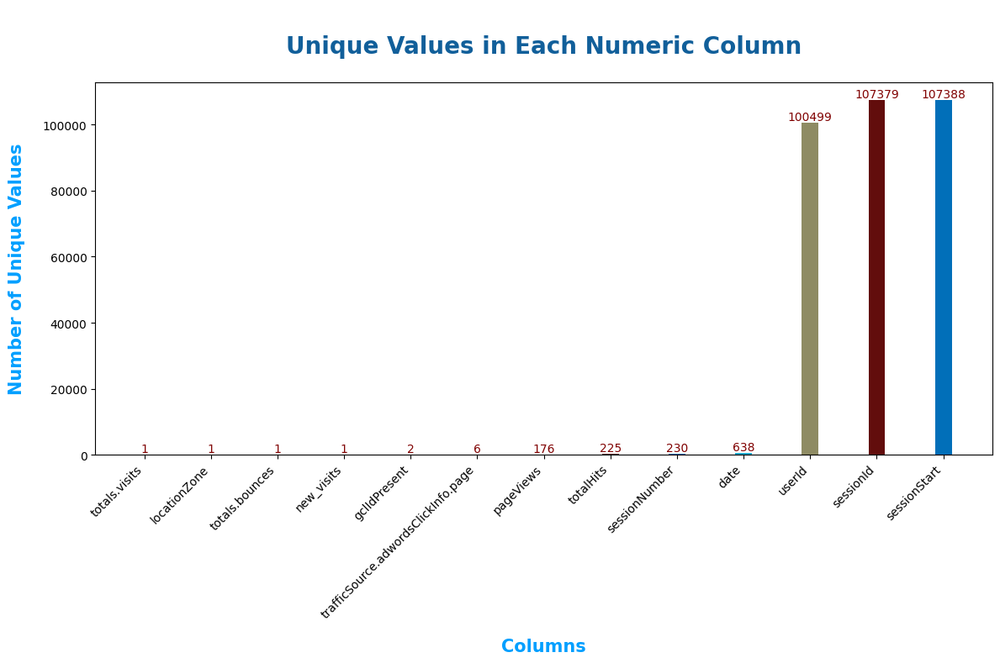

In [14]:
x = []                                       
y = list(total_num_unique_columns.values())
y.sort()
count = 0
for i in y :
    for j in total_num_unique_columns :
      if i == total_num_unique_columns[j] and j not in x :
        x.append(j)

colors = ["#016fb9", "#22aed1", "#8e8b63", "#620d0c"]
plt.figure(figsize=(12, 8))

# Bar chart for Unique values in each column
bars = plt.bar(x, y, color=colors, width=0.25, alpha=1)
plt.title('\nUnique Values in Each Numeric Column', color="#115f9a", fontsize=20, fontweight='bold', pad=25)   # Setting Title
plt.xlabel('Columns', color="#009fff", fontsize=15, fontweight='bold', labelpad=15)                            # Setting Label for X-Axis
plt.ylabel('Number of Unique Values', color="#009fff", fontsize=15, fontweight='bold', labelpad=15)            # Setting Label for Y-Axis
plt.xticks(rotation=45, ha='right')

# Setting height of each bar at top of the bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 1, height,
             ha='center', va='bottom', fontsize=10, color="maroon")

plt.tight_layout()
plt.show()

<br><br>

## **High Cardinality Columns**

In [15]:
num_card_columns, total_num_card_columns = [], {}     # List for columns with high cardinality and dictionary with columns with high cardinality and total unique values

print(f"\n|{51 * '-'}|{25 * '-'}|")
print(f"| High Cardinality Columns{(50 - len('High Cardinality Columns')) * ' '}|{5 * ' '}Total Unique Values{(20 - (len('Total Unique Values'))) * ' '}|")
print(f"|{51 * '-'}|{25 * '-'}|")

cols = num_columns.copy()
for col in cols :
    val = len(list(train_df[col].unique()))
    if val >= 1000 :
        num_card_columns.append(col)           # Append all columns with high cardinality in num_card_columns
        total_num_card_columns[col] = val
        print(f"| {col}{(50-len(col)) * ' '}|{5 * ' '}{val}{(20 - (len(str(val)))) * ' '}|")

print(f"|{51 * '_'}|{25 * '_'}|\n\n")


print(f"Total Columns With High Cardinality : {len(num_card_columns)}")


|---------------------------------------------------|-------------------------|
| High Cardinality Columns                          |     Total Unique Values |
|---------------------------------------------------|-------------------------|
| userId                                            |     100499              |
| sessionId                                         |     107379              |
| sessionStart                                      |     107388              |
|___________________________________________________|_________________________|


Total Columns With High Cardinality : 3


#### **Interpretation :**

<ul style="font-family: Courier New; font-size: 1.05rem;">
    <li>There are 3 columns with very high cardinality.</li>
    <li>High cardinality increases the complexity of th Machine Learning Model.</li>
    <li>High cardinality columns sometimes accidentaly contain the information that uniquely define the row.</li>
    <li>Hence, it increases the risk of data leakage.</li>
    <li>Thus, we should drop these high cardinality columns.</li>
</ul>

<br><br>

## **Visualization of Numeric Columns With High Cardinality**

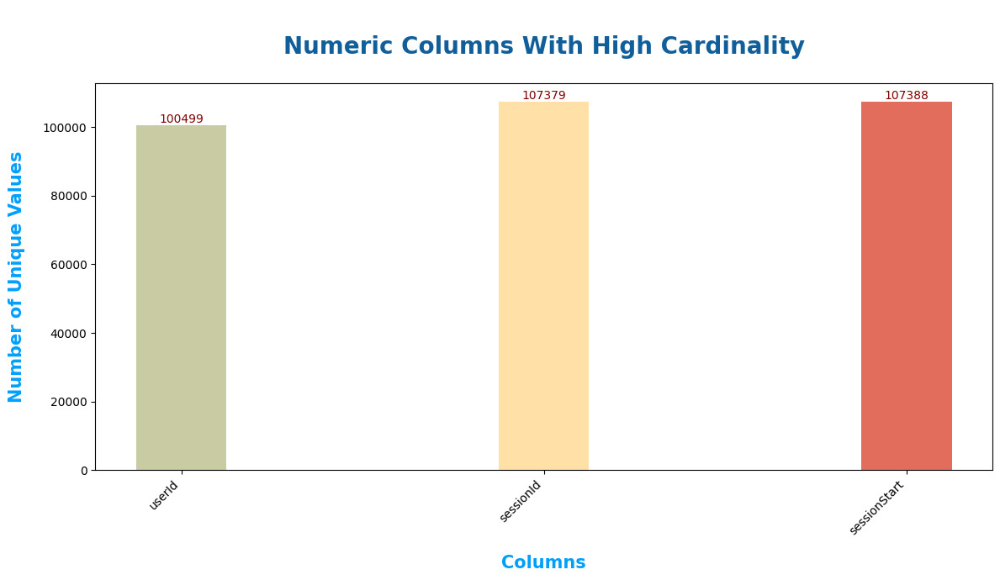

In [16]:
x = []
y = list(total_num_card_columns.values())
y.sort()
count = 0
for i in y :
    for j in total_num_card_columns :
      if i == total_num_card_columns[j] and j not in x :
        x.append(j)

colors = ["#c9cba3","#ffe1a8","#e26d5c","#723d46","#472d30"] #["#016fb9", "#22aed1", "#8e8b63", "#620d0c"]
plt.figure(figsize=(12, 7))

# Bar plot for visualizing columns with high cardinality
bars = plt.bar(x, y, color=colors, width=0.25, alpha=1)
plt.title('\nNumeric Columns With High Cardinality', color="#115f9a", fontsize=20, fontweight='bold', pad=25)  # Setting title
plt.xlabel('Columns', color="#009fff", fontsize=15, fontweight='bold', labelpad=15)                            # Setting X-Label
plt.ylabel('Number of Unique Values', color="#009fff", fontsize=15, fontweight='bold', labelpad=15)            # Setting Y-Label
plt.xticks(rotation=45, ha='right')                                                                            

# Setting bar height
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 1, height,
             ha='center', va='bottom', fontsize=10, color="maroon")

plt.tight_layout()
plt.show()

<br><br>

## **Numeric Columns With Outliers**

In [17]:
Q1, Q3, IQR, out = {}, {}, {}, {}

numeric_columns = list(train_df.select_dtypes(include='number'))
#numeric_columns.remove('purchaseValue')


for col in numeric_columns :
    q1 = train_df[col].quantile(0.25)     # 25th Quantile
    q3 = train_df[col].quantile(0.75)     # 75th Quantile
    iqr = q3 - q1                         # Inter-Quantile Range
    outliers = train_df[(train_df[col] < q1 - 1.5 * iqr) | (train_df[col] > q3 + 1.5 * iqr)].shape[0]
    Q1[col], Q3[col], IQR[col], out[col] = q1, q3, iqr, outliers


print(f"\n|{51 * '-'}|{25 * '-'}|{20 * '-'}|")
print(f"| Numeric Columns With Outliers{(50 - len('Numeric Columns With Outliers')) * ' '}|{5 * ' '}Total Outliers{(20 - (len('Total Outliers'))) * ' '}|{5 * ' '}Percentage{(15 - len('Percentage')) * ' '}|")
print(f"|{51 * '-'}|{25 * '-'}|{20 * '-'}|")
#print(f"|{51 * ' '}|{25 * ' '}|{20 * ' '}|")

for col in out :
    val = out[col]
    if val != 0 :
        per = round(val * 100 / train_df.shape[0], 4)
        print(f"| {col}{(50-len(col)) * ' '}|{5 * ' '}{val}{(20 - (len(str(val)))) * ' '}|{5 * ' '}{per}{(15 - len(str(per))) * ' '}|")

print(f"|{51 * '_'}|{25 * '_'}|{20 * '_'}|\n\n")



|---------------------------------------------------|-------------------------|--------------------|
| Numeric Columns With Outliers                     |     Total Outliers      |     Percentage     |
|---------------------------------------------------|-------------------------|--------------------|
| purchaseValue                                     |     23985               |     20.6726        |
| gclIdPresent                                      |     4295                |     3.7019         |
| sessionNumber                                     |     14116               |     12.1666        |
| trafficSource.adwordsClickInfo.page               |     65                  |     0.056          |
| pageViews                                         |     12419               |     10.7039        |
| totalHits                                         |     13154               |     11.3374        |
|___________________________________________________|_________________________|___________

<br><br>

## **Visualization of Outliers in Numeric Columns**

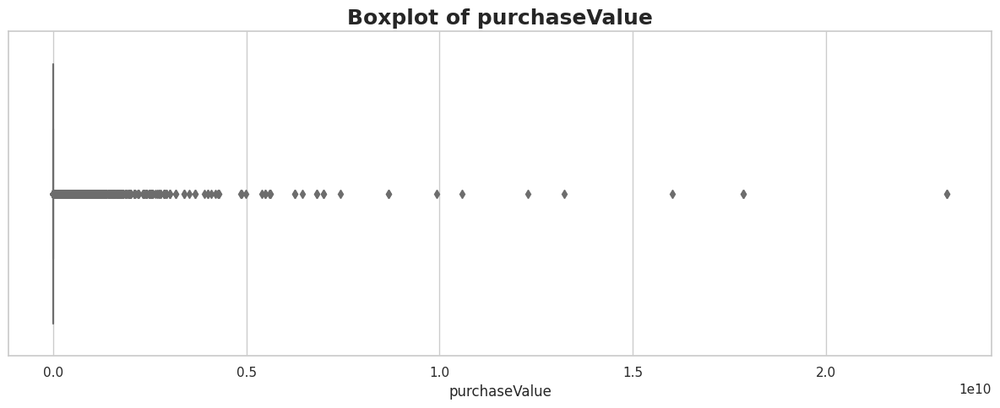

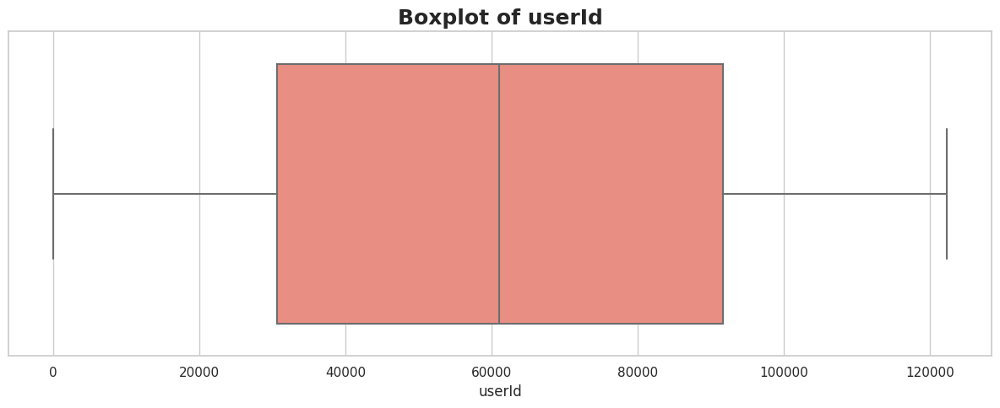

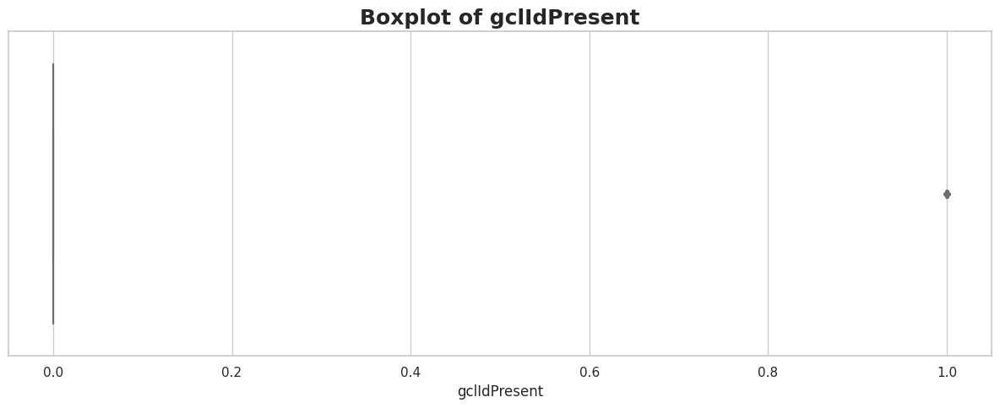

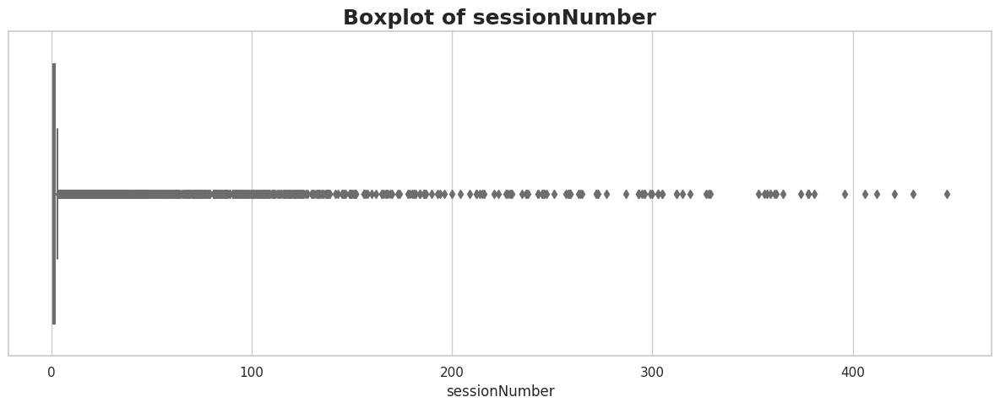

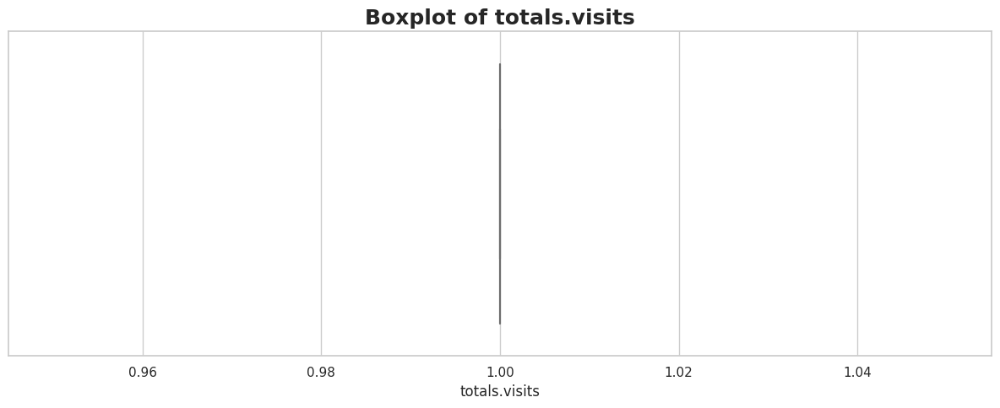

...

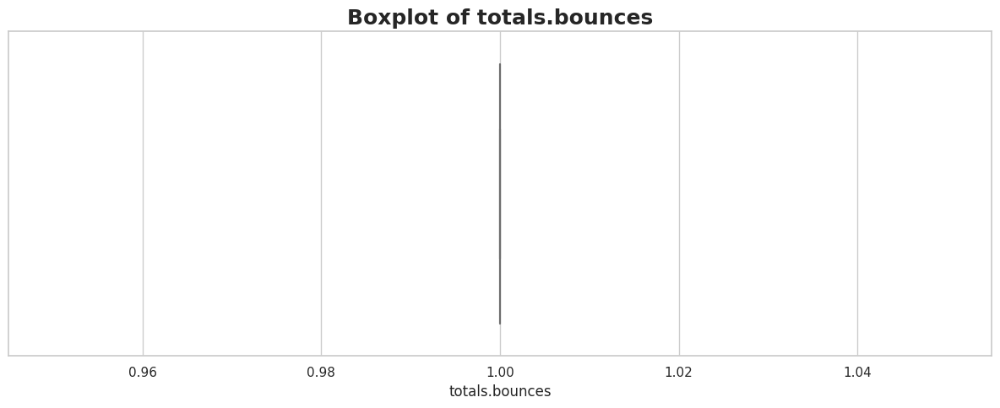

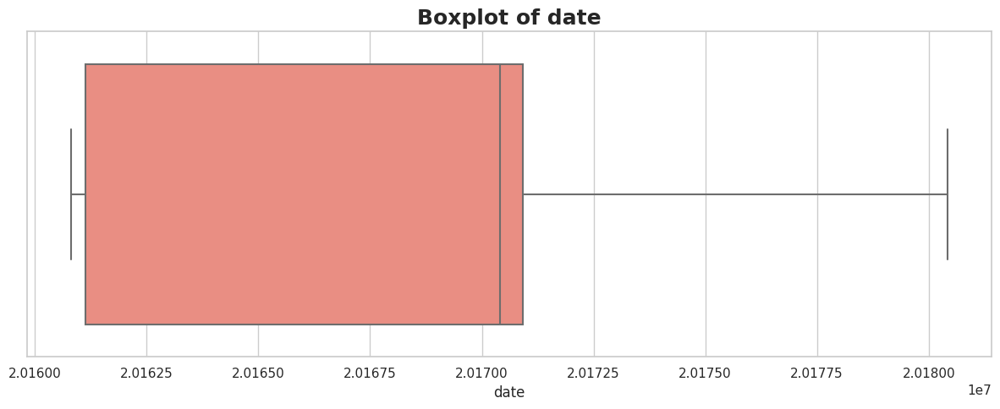

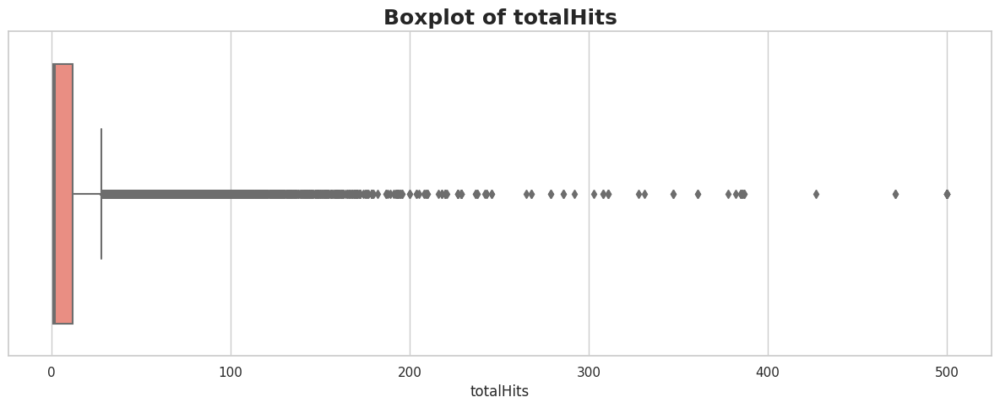

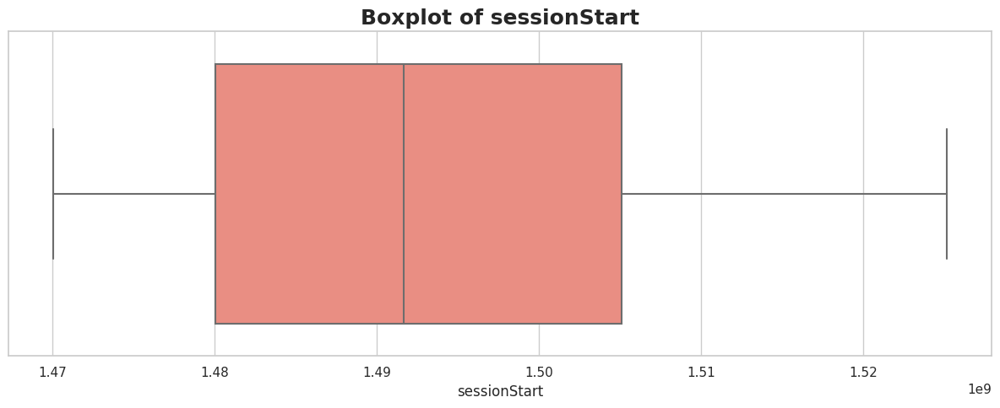

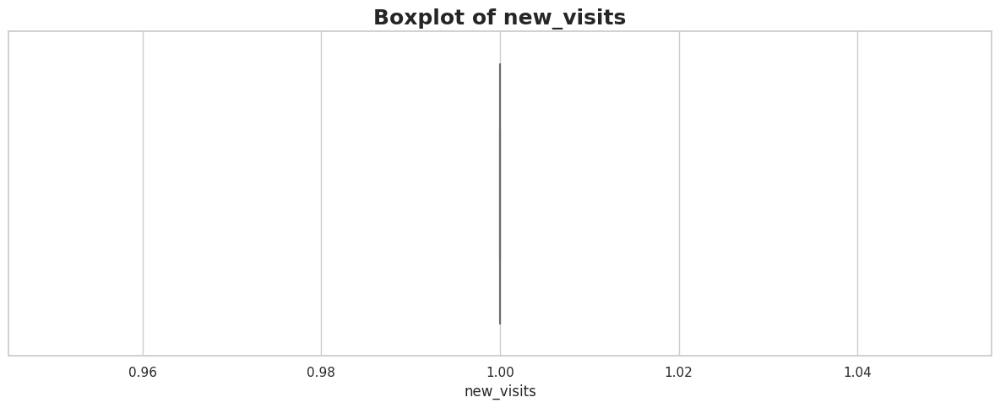

In [18]:
# Setting Style For Better Visuals
sns.set(style="whitegrid")

for col in numeric_columns :
    plt.figure(figsize=(12, 5))
    sns.boxplot(x=train_df[col], color='salmon')                       # Boxplot for visualizing outliers
    plt.title(f'Boxplot of {col}', fontsize=18, fontweight='bold')
    plt.xlabel(col, fontsize=12)
    plt.tight_layout()
    plt.show()
    print("\n\n")

<br><br>

## **Univariate Analysis of Numerical Columns**

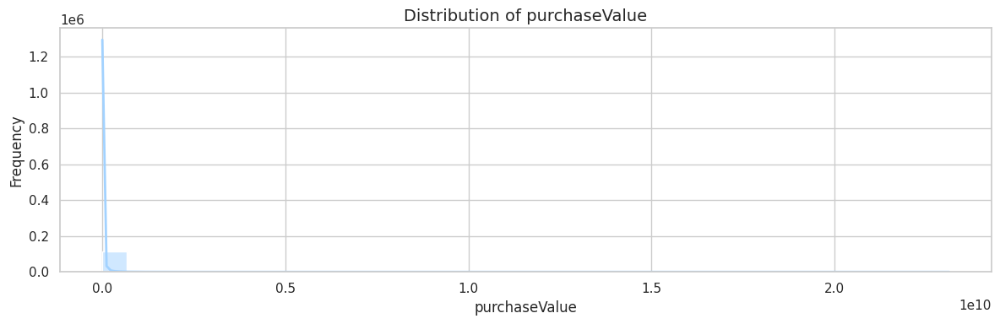

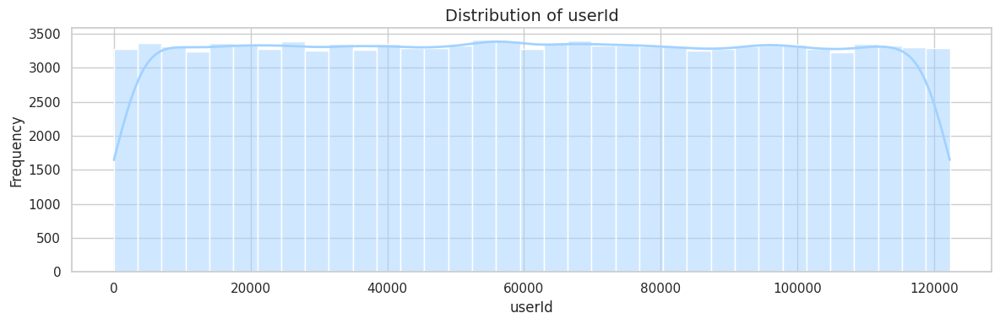

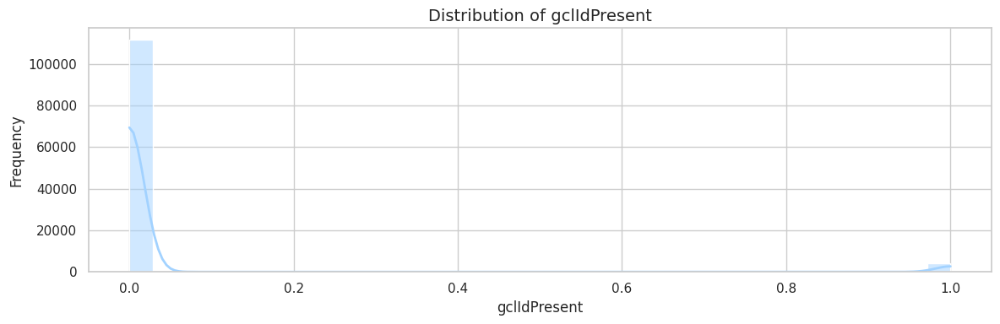

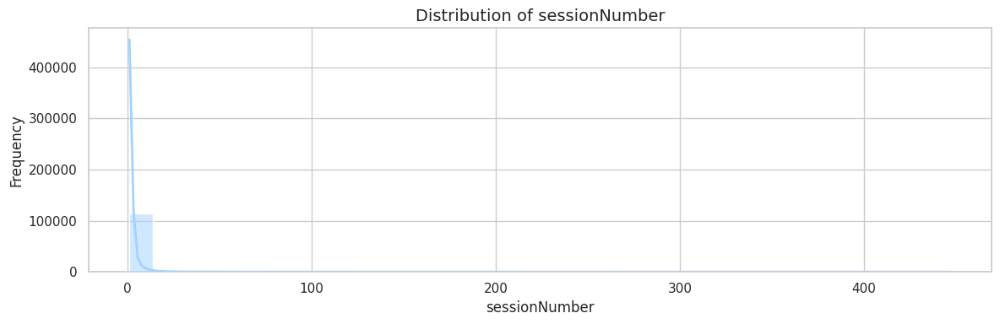

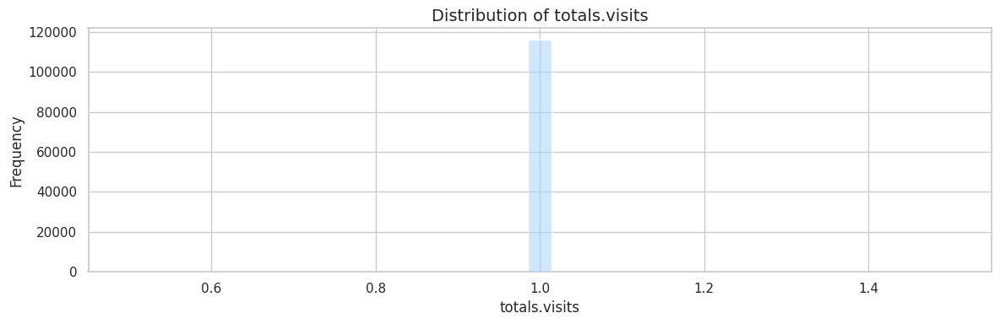

...

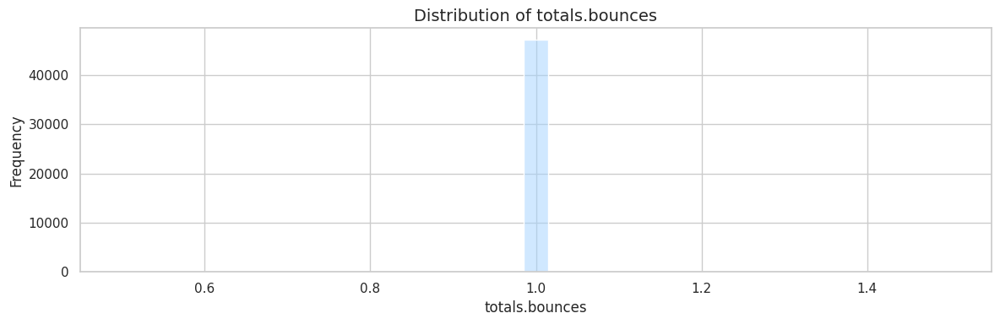

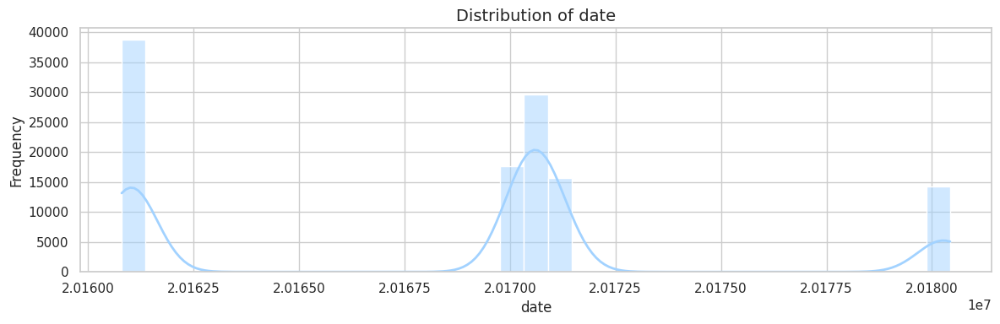

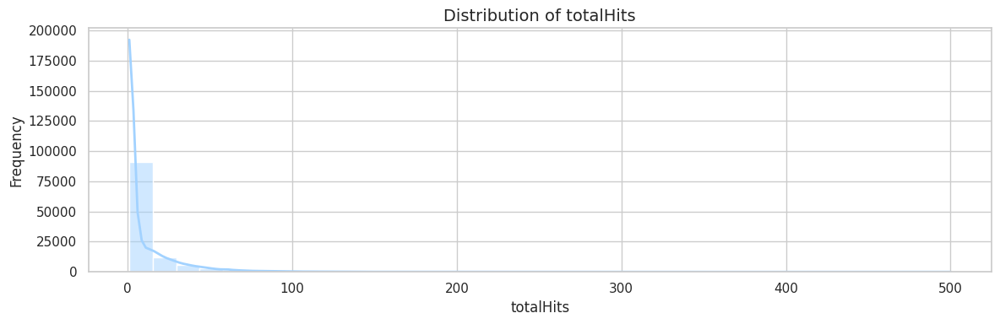

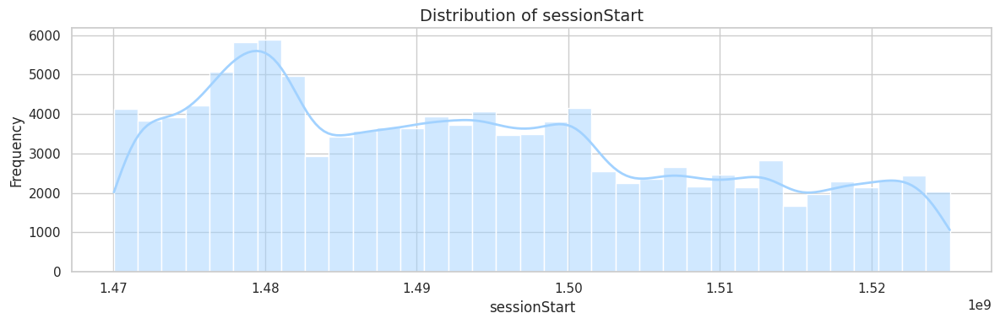

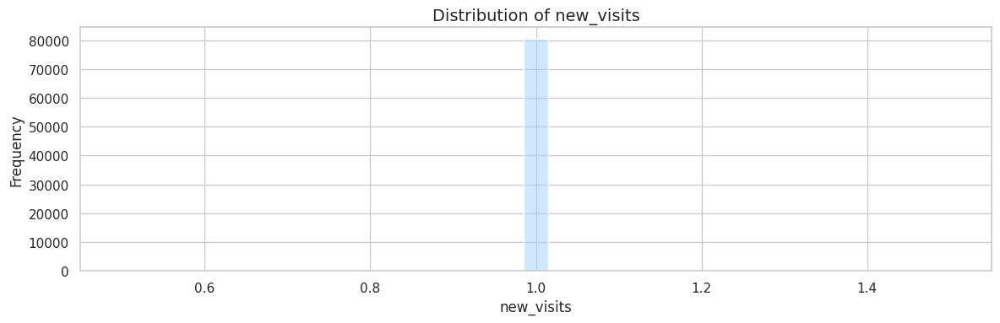

In [19]:
# Hide Warnings
warnings.filterwarnings("ignore", category=FutureWarning, message=".*use_inf_as_na.*")

sns.set(style="whitegrid")
num_columns = list(train_df.select_dtypes(include="number"))
for col in num_columns:
    plt.figure(figsize=(12, 4))
    sns.histplot(train_df[col], bins=35, color='#a2d2ff', kde=True, line_kws={"linewidth": 2})   # Histogram
    plt.title(f"Distribution of {col}", fontsize=14)                                             # Setting title
    plt.xlabel(col)                                                                              # Setting Label for X-Axis
    plt.ylabel("Frequency")                                                                      # Setting Label for Y-Axis
    plt.tight_layout()
    plt.show()

<br><br>

## **Analysis & Visualization of Target Variable - `purchaseValue`**

In [20]:
train_df[['purchaseValue']].describe()

,purchaseValue
count,1.160230e+05
mean,2.656393e+07
std,2.051825e+08
min,0.000000e+00
25%,0.000000e+00
50%,0.000000e+00
75%,0.000000e+00
max,2.312950e+10


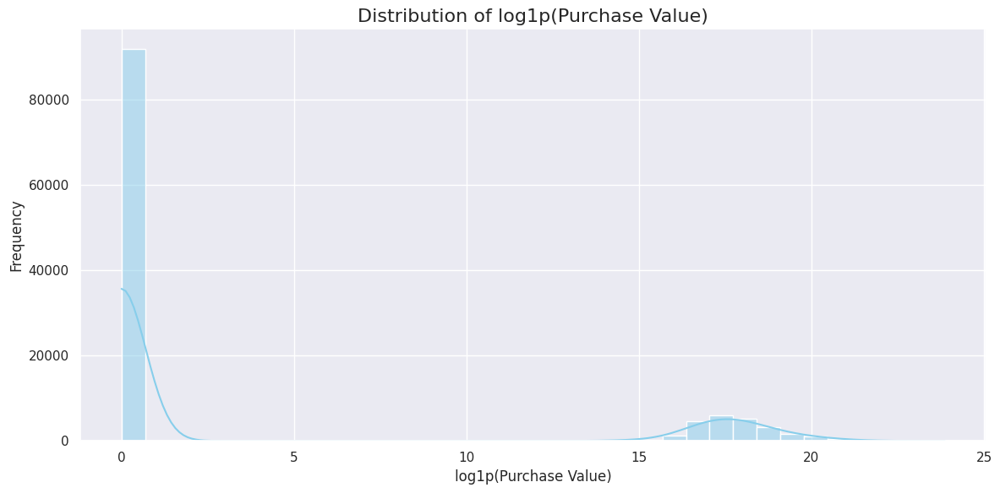

In [21]:
# Visualization of Target Variable (purchaseValue) Using Histogram

sns.set()
y = np.log1p(train_df['purchaseValue'])  # Here log1p is used because most of the values in the target are 0.
plt.figure(figsize=(12, 6))
sns.histplot(y, bins=35, kde=True, color='skyblue')
plt.title("Distribution of log1p(Purchase Value)", fontsize=16)
plt.xlabel("log1p(Purchase Value)", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.tight_layout()
plt.show()
print("\n")


#### **Interpretation :**

<ul style="font-family: Courier New; font-size: 1.05rem;">
    <li>The standard deviation = 2.051825e+08, which is huge, which shows extreme outliers.</li>
    <li>25th, 50th (median), and 75th percentiles = 0.</li>
    <li>This means at least 75% of the dataset has purchaseValue = 0.</li>
    <li>Maximum value is 2.312950e+10, but the mean is only 2.656393e+07.</li>
    <li>Hence, the target column `(purchaseValue)` is strongly `Right-skewed` or `Positively-Skewed`</li>
</ul>

<br><br>

## **Bivariate Analysis : Numerical Columns V/S Target**

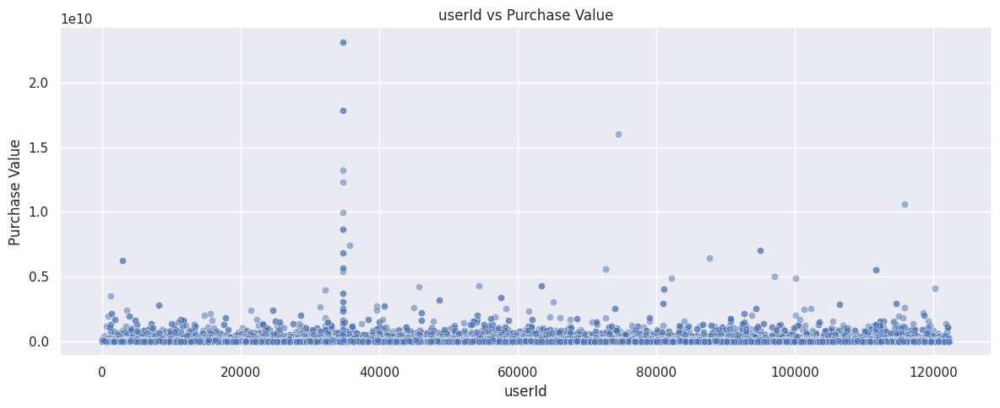

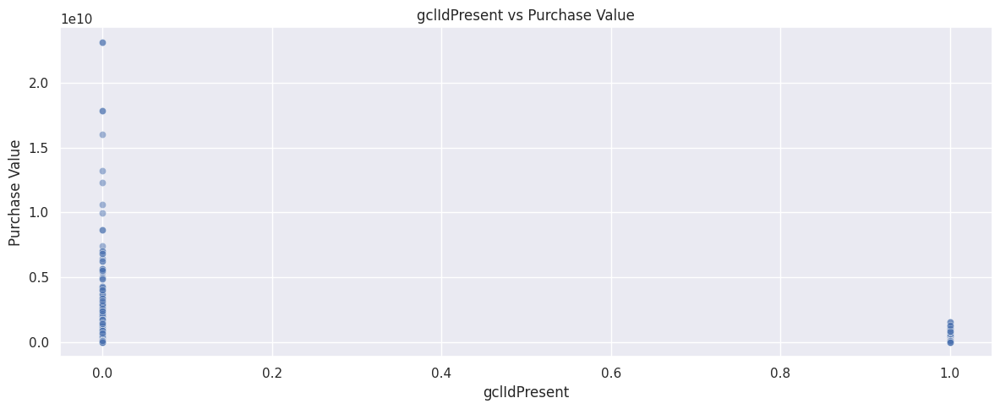

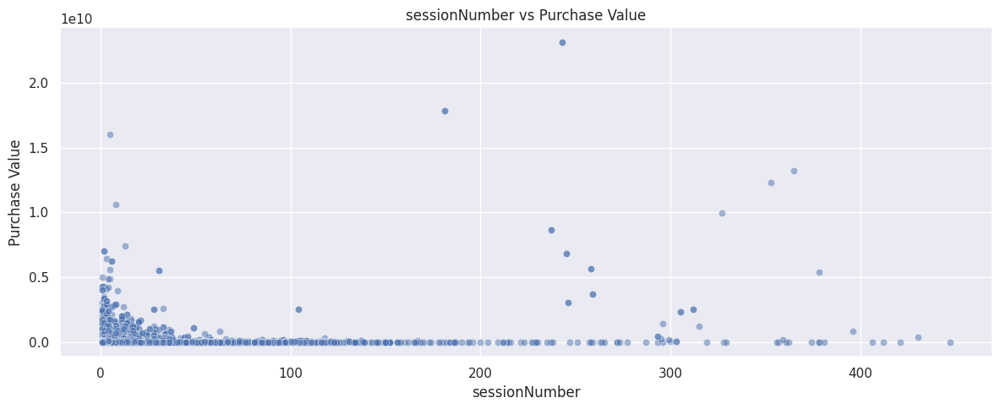

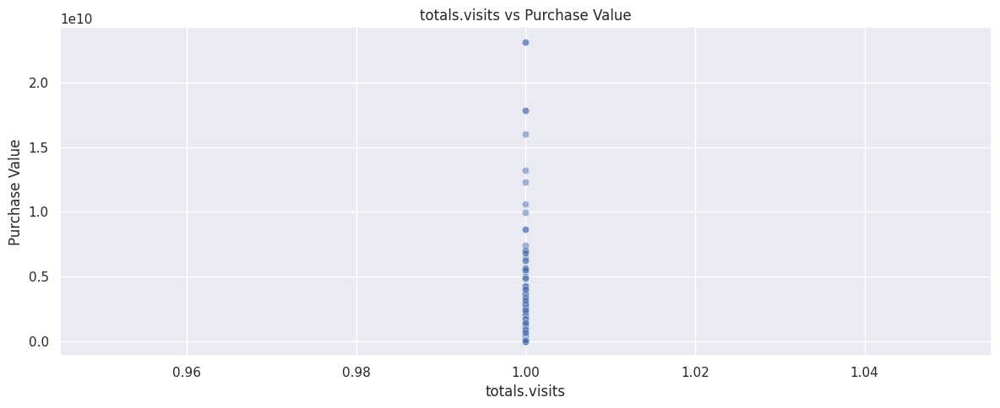

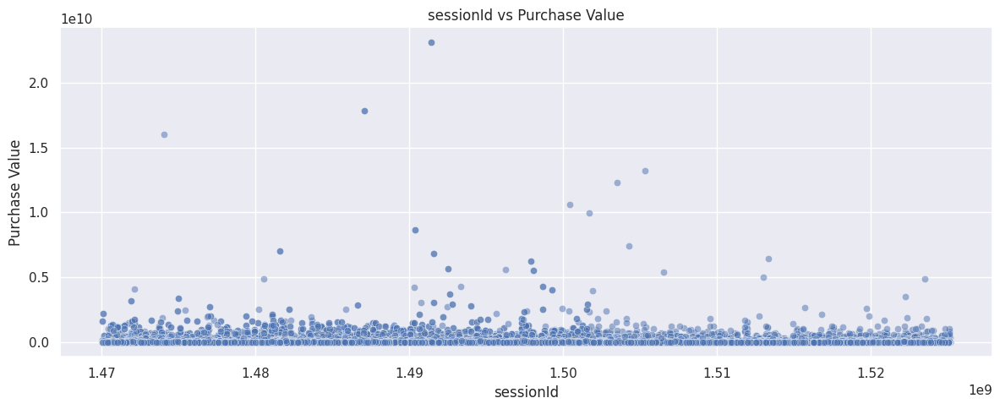

...

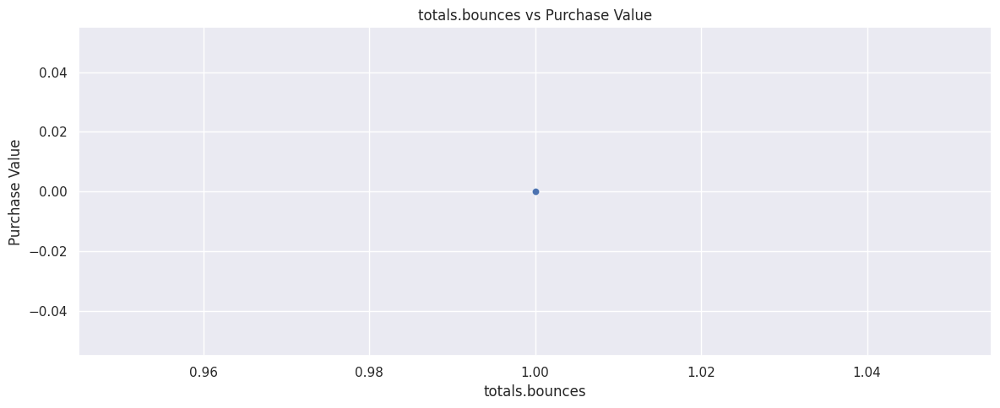

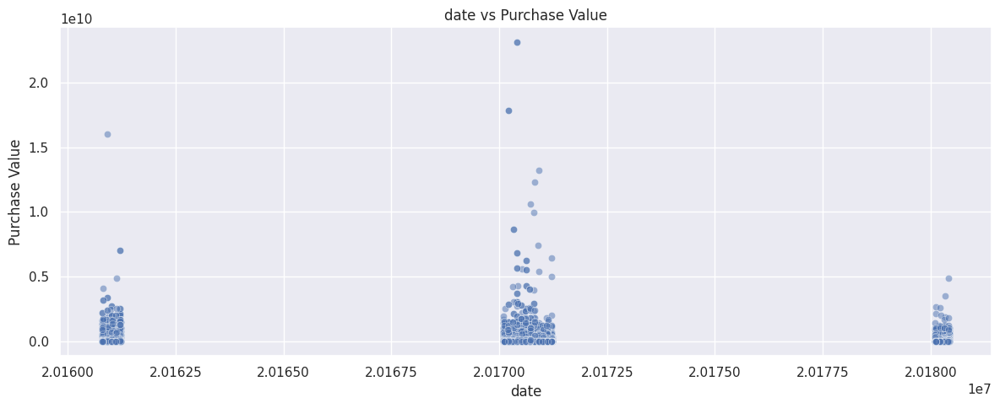

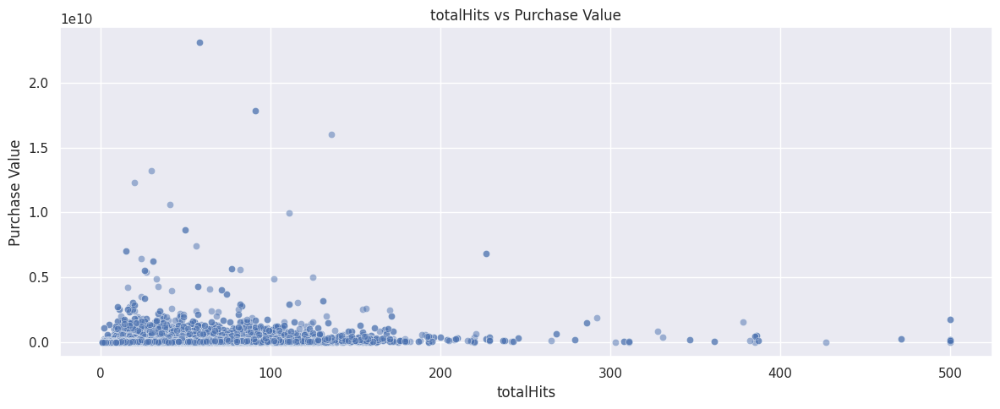

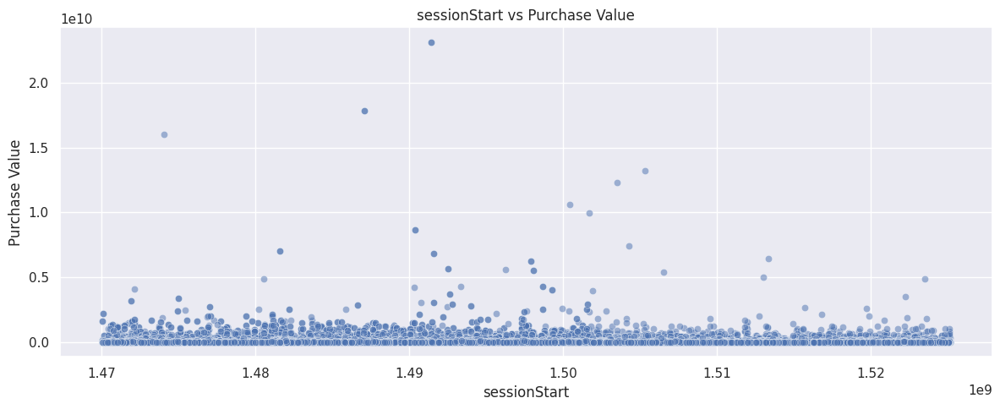

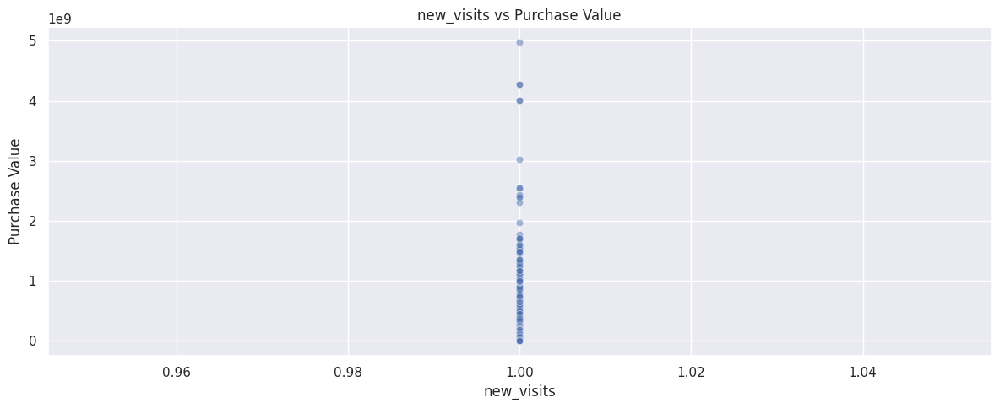

In [22]:
num_columns = list(train_df.select_dtypes(include="number"))

for col in num_columns :
    if col != 'purchaseValue':
        plt.figure(figsize=(12, 5))
        sns.scatterplot(x=train_df[col], y=train_df['purchaseValue'], alpha=0.5)
        plt.title(f"{col} vs Purchase Value")
        plt.xlabel(col)
        plt.ylabel("Purchase Value")
        plt.tight_layout()
        plt.show()

<br><br>

## **Bivariate Analysis : Heat (Correlation) Map For Numeric Columns**

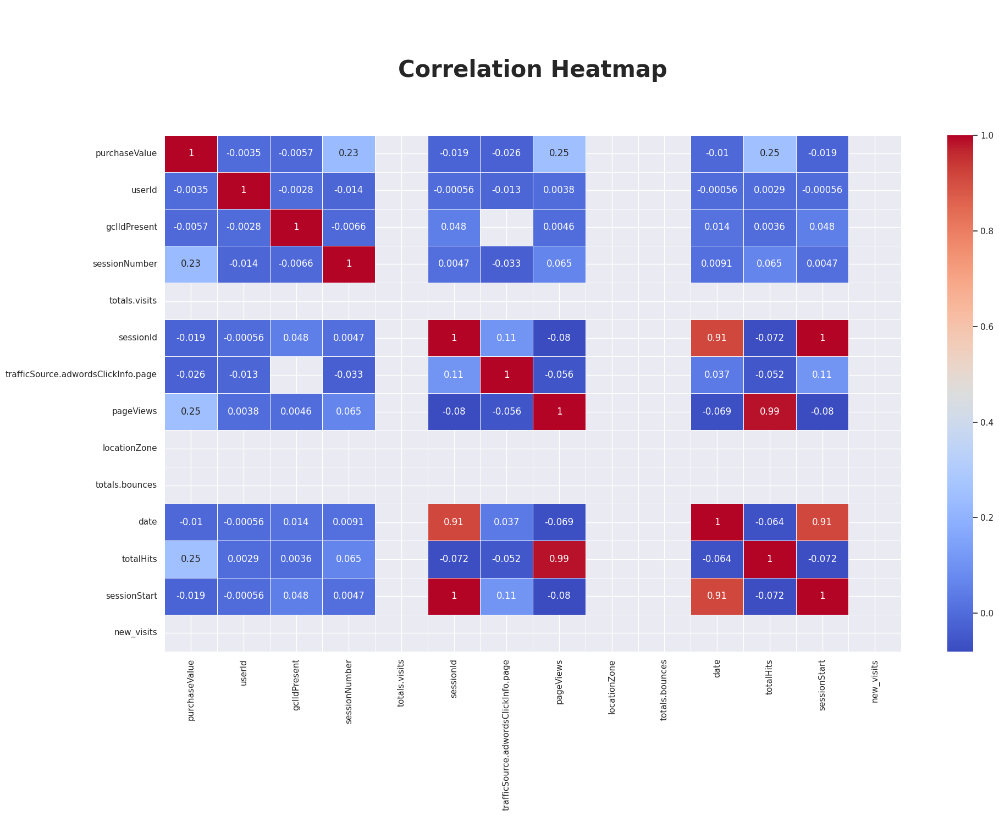

In [23]:
# Correlation Map or Heat Map
sns.set()
plt.figure(figsize=(20, 15))
numeric_data_columns = train_df.select_dtypes(include='number')
corr_matrix = numeric_data_columns.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("\n\nCorrelation Heatmap\n\n", fontsize='30', fontweight="bold")
plt.tight_layout()
plt.show()

## **Observations & Interpretations**


### **1. Strong Correlation (r ≥ 0.7)**

<ul style="font-family: Courier New; font-size: 1.05rem;">
    <li>sessionId and date = 0.91</li>
    <li> sessionId and sessionStart = 1</li>
    <li>pageViews and totalHits = 0.99</li>
    <li>date and sessionStart = 0.91</li></li>
</ul>

##### **Interpretation:**

<ul style="font-family: Courier New; font-size: 1.05rem;">
    <li>These pairs capture similar information. For example, pageViews and totalHits are almost interchangeable (due to having very high positive correlation).</li>
    <li>For modeling, we should select only one from each correlated pair to avoid multicollinearity.</li>
</ul>


<br>

### **2. Weak Correlation(|r| <~ 0.1)**
    
<ul style="font-family: Courier New; font-size: 1.05rem;">
    <li>purchaseValue and userId = -0.0035</li>
    <li>purchaseValue and gclidPresent = -0.0057</li>
    <li>purchaseValue and totals.visits = -0.019</li>
    <li>userId and totals.visits = -0.00056</li>
    <li>sessionNumber and gclidPresent = 0.0066</li>
    <li>sessionNumber and totals.visits = 0.065</li>
    <li>trafficSource.adwordsClickInfo.page and pageViews = -0.056</li>
    <li>totals.bounces and date = -0.064</li>
    <li>sessionId and trafficSource.adwordsClickInfo.page = 0.11</li>
</ul>

##### **Interpretation:**

<ul style="font-family: Courier New; font-size: 1.05rem;">
    <li>These features have almost no predictive signal for purchaseValue.</li>
    <li>They can be safely excluded from regression models or used only if they show nonlinear effects in tree-based models.</li>
</ul>

<br>
    

### **3. No Correlation (|r| ≈ 0)**

<ul style="font-family: Courier New; font-size: 1.05rem;">
    <li>purchaseValue and userId = -0.0035</li>
    <li>purchaseValue and gclidPresent = -0.0057</li>
    <li>userId and totals.visits = -0.00056</li>
    <li>userId and sessionStart = -0.00056</li>
    <li>userId and date = -0.00056</li>
    <li>trafficSource.adwordsClickInfo.page and pageViews = -0.056</li>
    <li>sessionNumber and trafficSource.adwordsClickInfo.page = -0.033</li>
    <li>sessionId and totals.visits = -0.072</li>
 </ul>

 ##### **Interpretation:**

 <ul style="font-family: Courier New; font-size: 1.05rem;">
    <li>These features are statistically independent, and likely not useful for prediction.</li>
    <li>Columns like userId, sessionId, and date act as unique identifiers or timestamps and should be excluded from modeling.</li>
</ul>

<br>

<br><br>

## **Description of Categorical Columns in Train Dataset**

In [24]:
train_df.describe(include=['object', 'boolean', 'category'])

,trafficSource.isTrueDirect,browser,device.screenResolution,trafficSource.adContent,trafficSource.keyword,screenSize,geoCluster,trafficSource.adwordsClickInfo.slot,device.mobileDeviceBranding,device.mobileInputSelector,...,geoNetwork.metro,device.mobileDeviceModel,trafficSource.referralPath,device.language,deviceType,userChannel,device.browserVersion,device.screenColors,geoNetwork.continent,device.isMobile
count,42890,116023,116023,2963,44162,116023,116023,4281,116023,116023,...,116023,116023,42714,116023,116023,116023,116023,116023,116023,116023
unique,1,34,1,53,566,1,5,3,1,1,...,104,1,941,1,3,8,1,1,6,2
top,True,Chrome,not available in demo dataset,Google Merchandise Store,(not provided),medium,Region_2,Top,not available in demo dataset,not available in demo dataset,...,not available in demo dataset,not available in demo dataset,/,not available in demo dataset,desktop,Organic Search,not available in demo dataset,not available in demo dataset,Americas,False
freq,42890,84508,116023,1410,39066,116023,23294,2721,116023,116023,...,60138,116023,17970,116023,86480,46925,116023,116023,69856,86494


<br><br>

## **Univariate Analysis of Categorical Features**

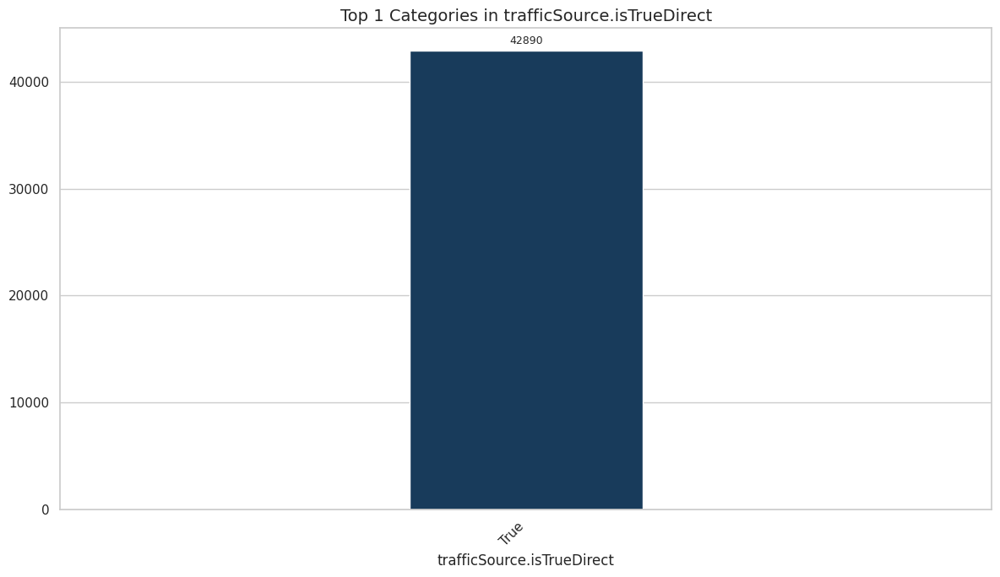

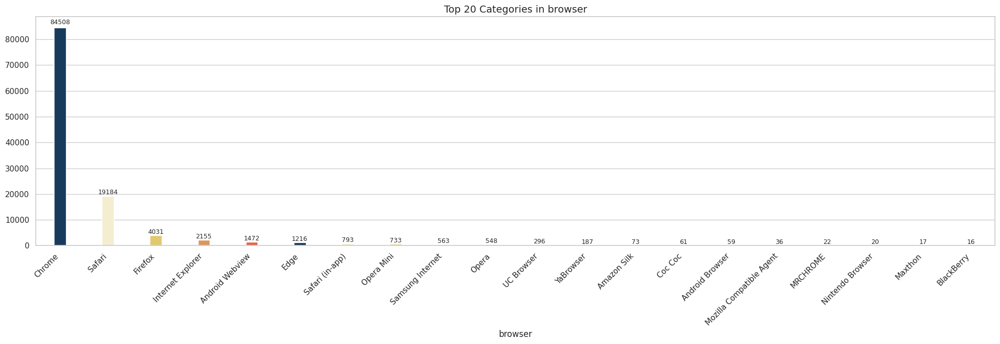

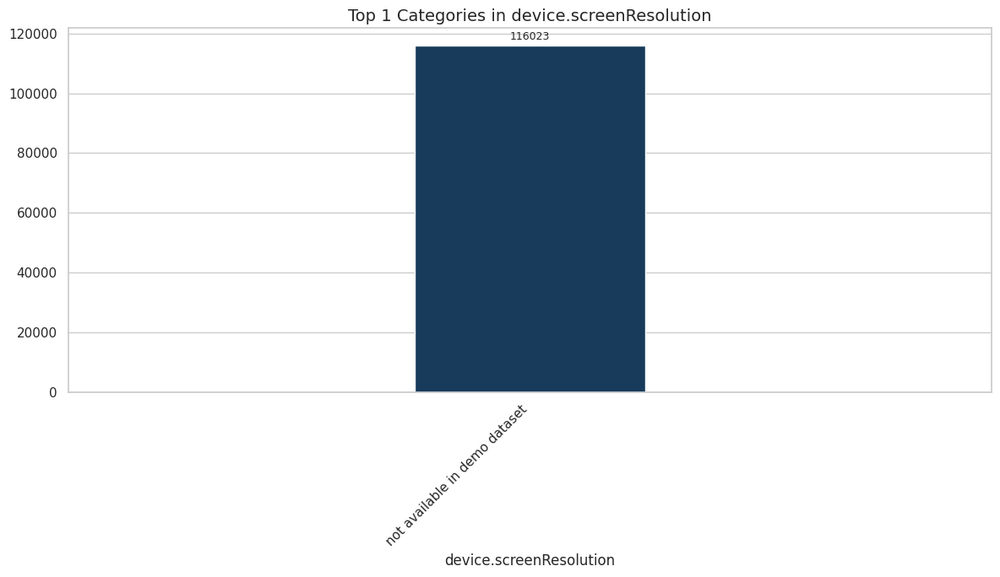

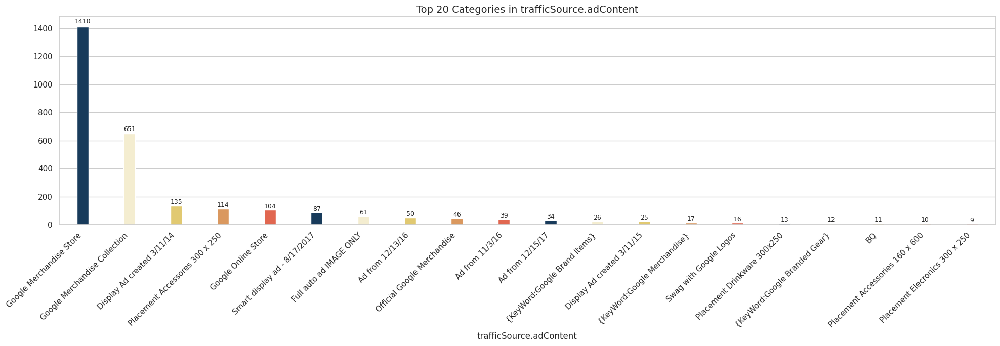

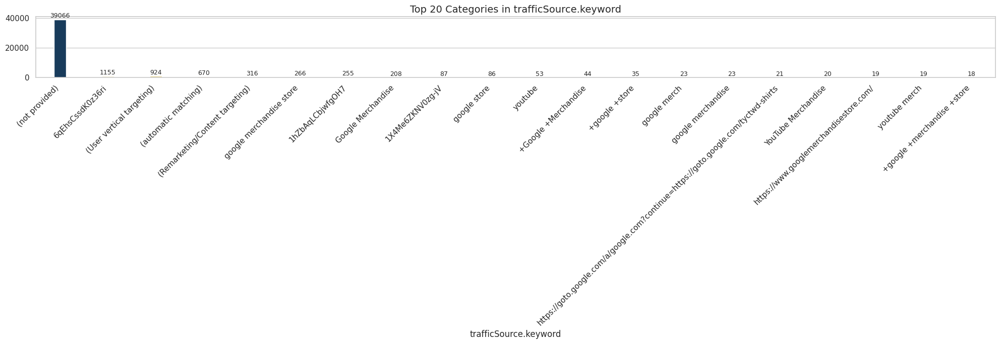

...

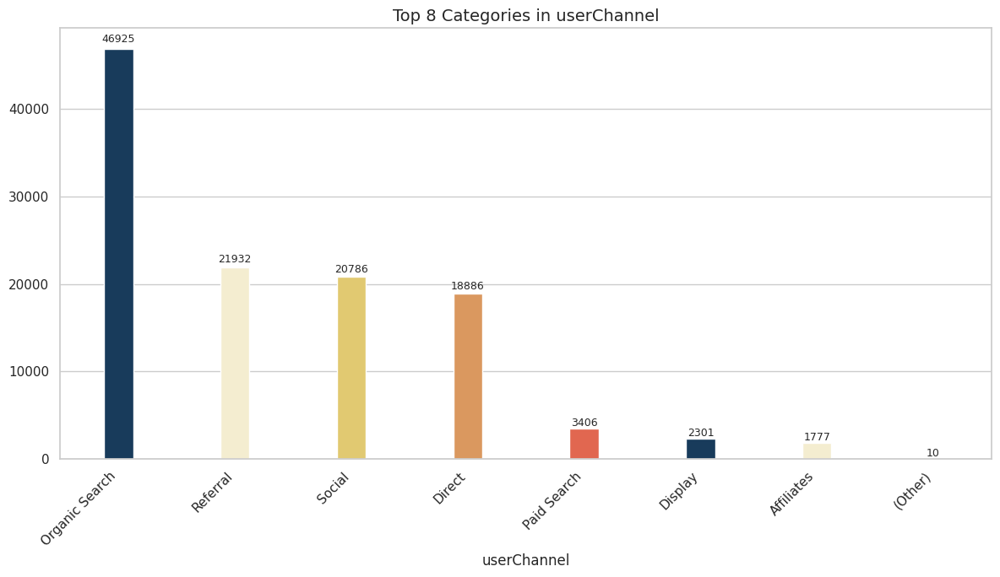

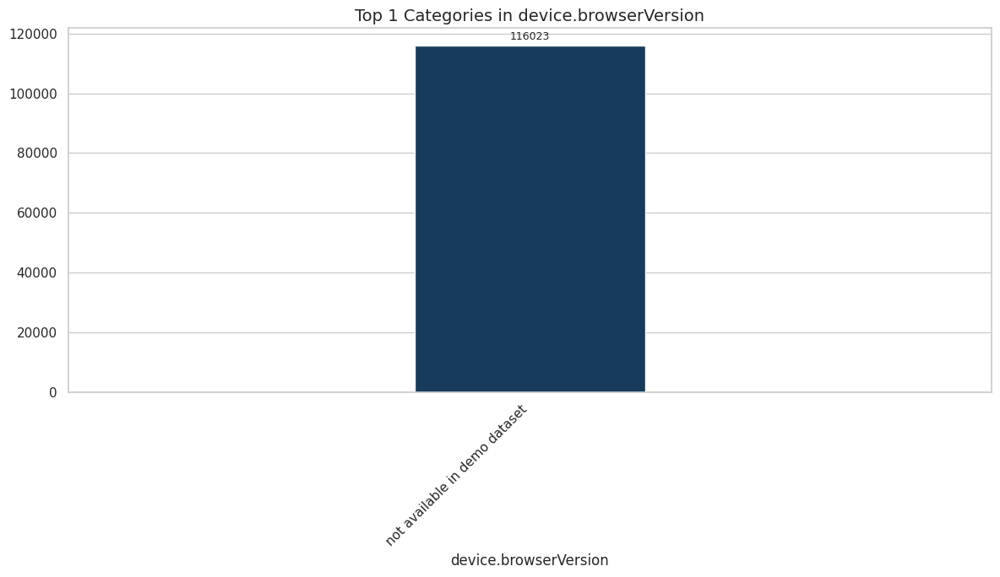

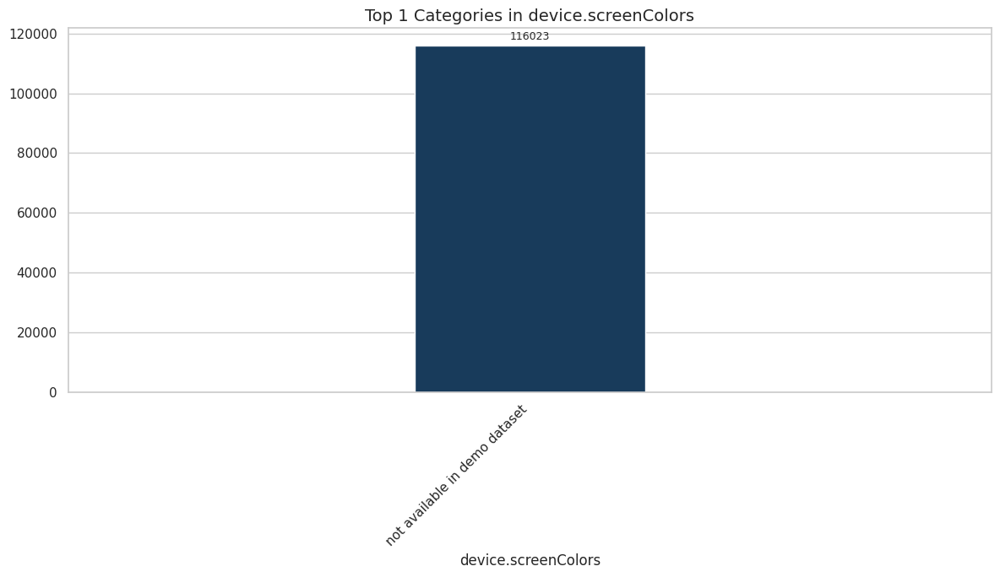

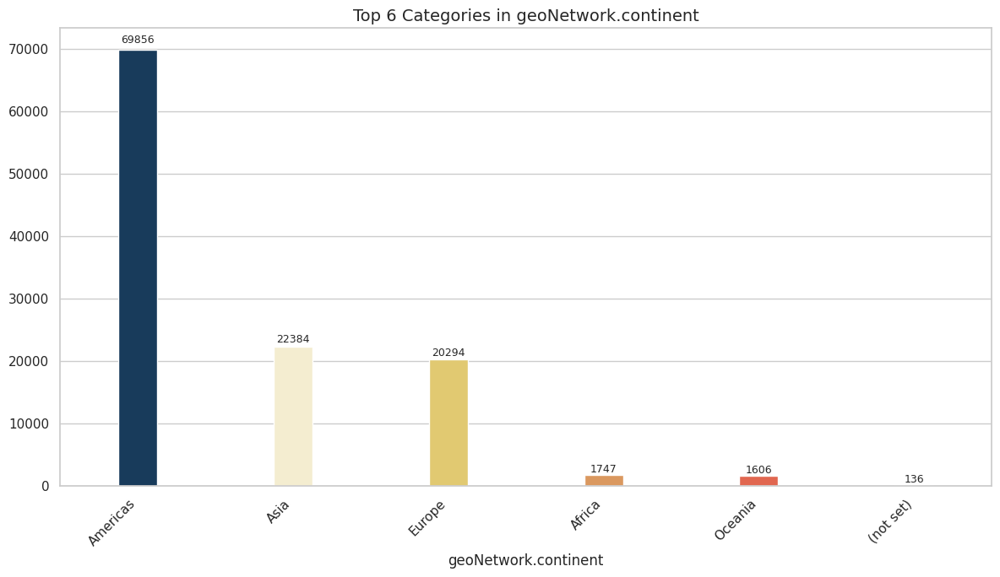

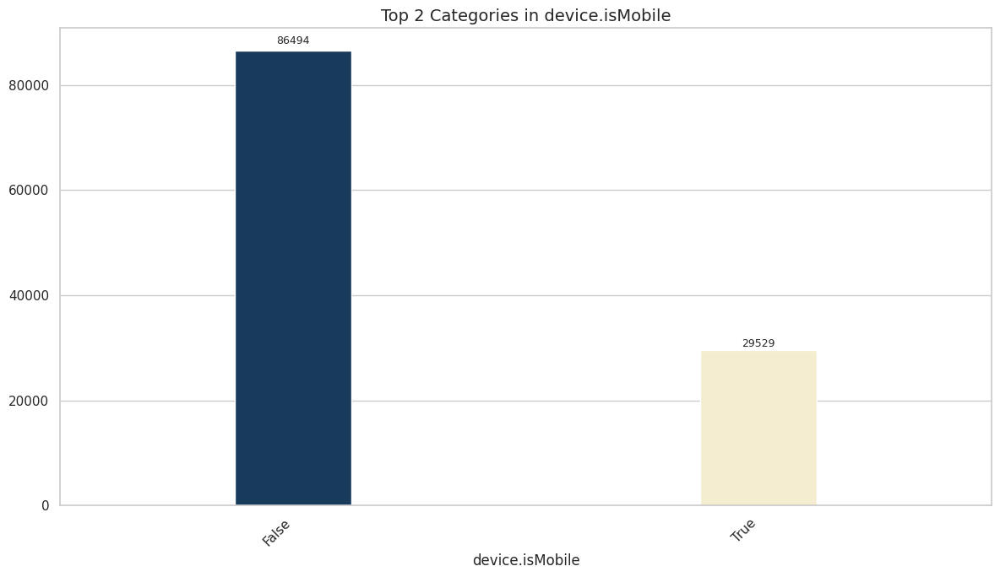

In [25]:
# Hide Warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

categorical_columns = train_df.select_dtypes(include=['object', 'boolean', 'category'])

sns.set(style="whitegrid")

colors = ["#0d3b66","#faf0ca","#f4d35e","#ee964b","#f95738"]

for col in categorical_columns:
    print("\n\n")
    top_values = train_df[col].value_counts().nlargest(20)
    n = len(top_values)
    plt.figure(figsize=(max(12, n), 7))
    ax = sns.barplot(x=top_values.index, y=top_values.values, palette=colors, width=0.25)
    plt.title(f"Top {n} Categories in {col}", fontsize=14)
    plt.xticks(rotation=45, ha='right')

    # Add value labels on top of each bar
    for i, val in enumerate(top_values.values):
        ax.text(i, val + val * 0.01, str(val), ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()

<br><br>

## **Bivariate Analysis: Categorical Features V/S Purchase Value**




--- Plotting: trafficSource.isTrueDirect ---



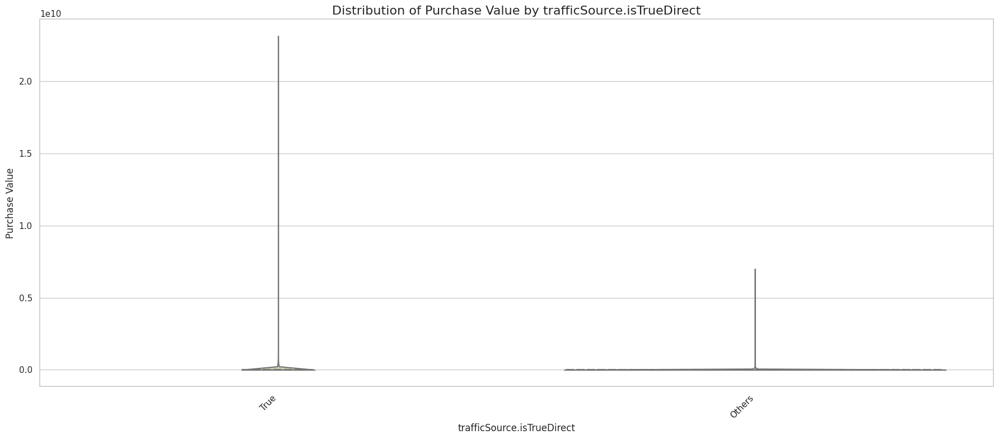




--- Plotting: browser ---



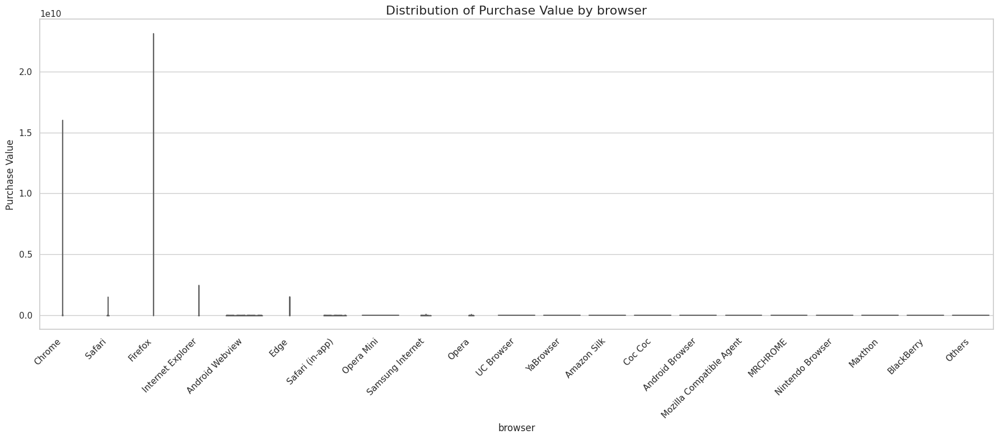




--- Plotting: device.screenResolution ---



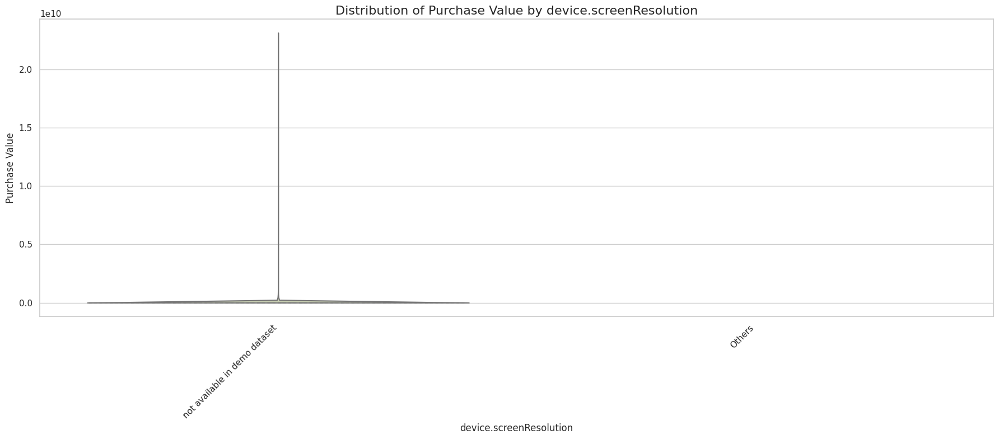




--- Plotting: trafficSource.adContent ---



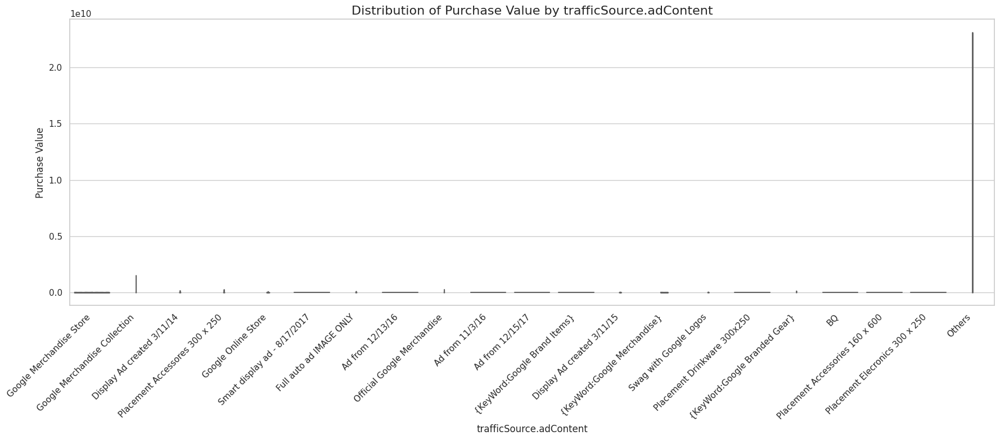




--- Plotting: trafficSource.keyword ---



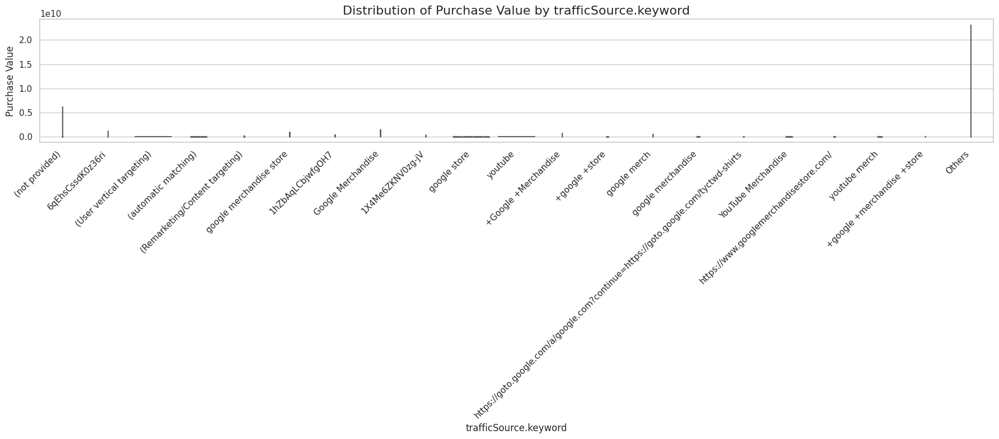




--- Plotting: screenSize ---



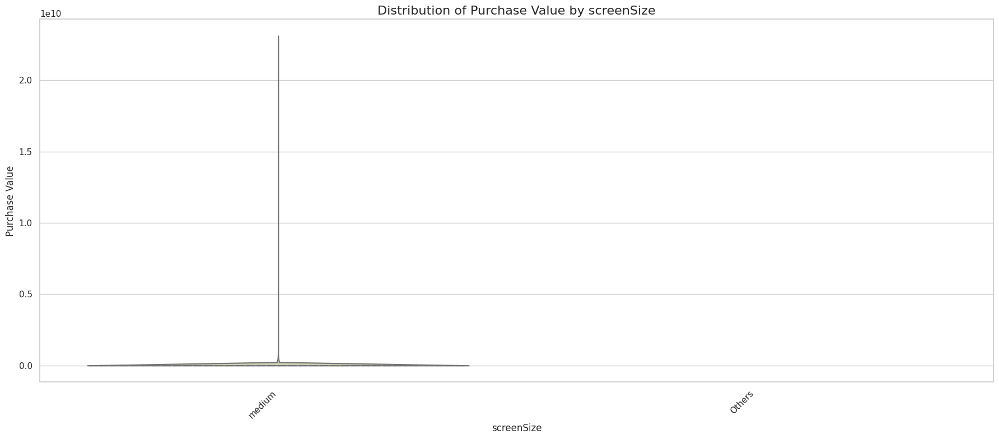




--- Plotting: geoCluster ---



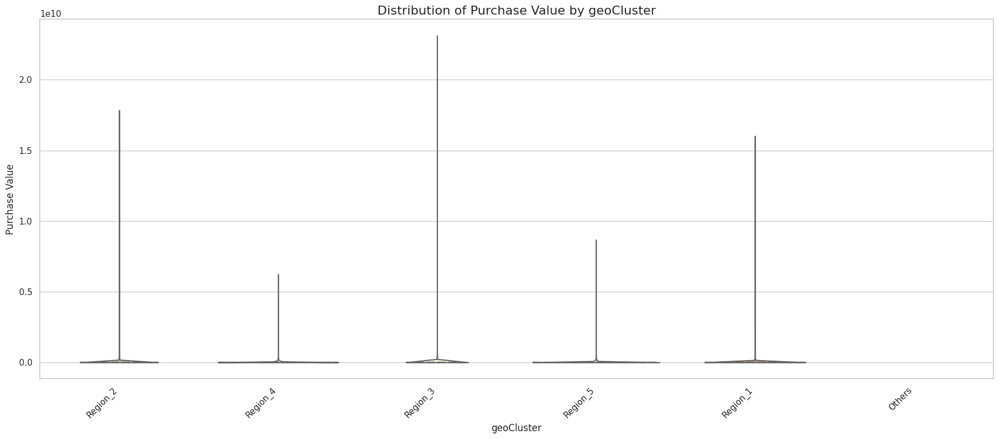




--- Plotting: trafficSource.adwordsClickInfo.slot ---



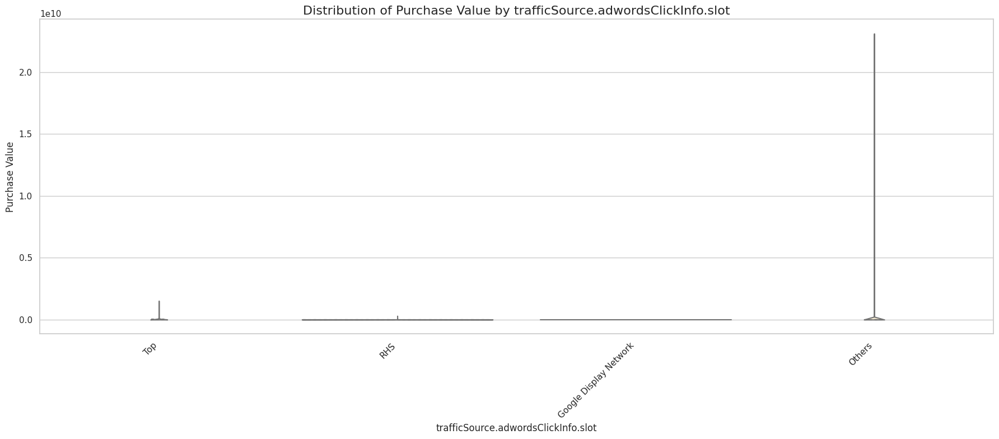




--- Plotting: device.mobileDeviceBranding ---



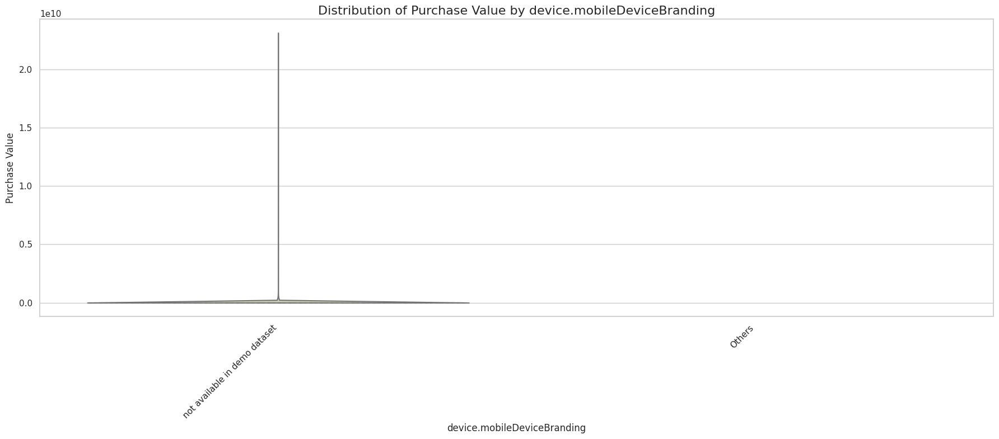




--- Plotting: device.mobileInputSelector ---



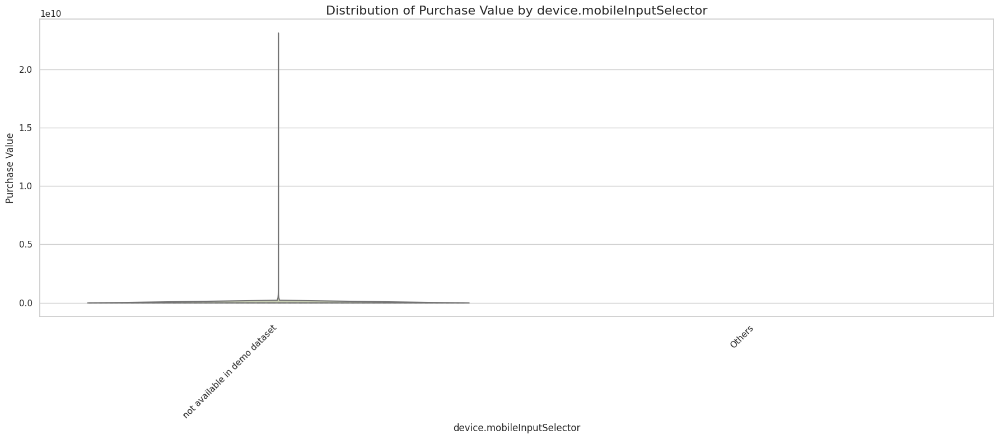




--- Plotting: trafficSource.campaign ---



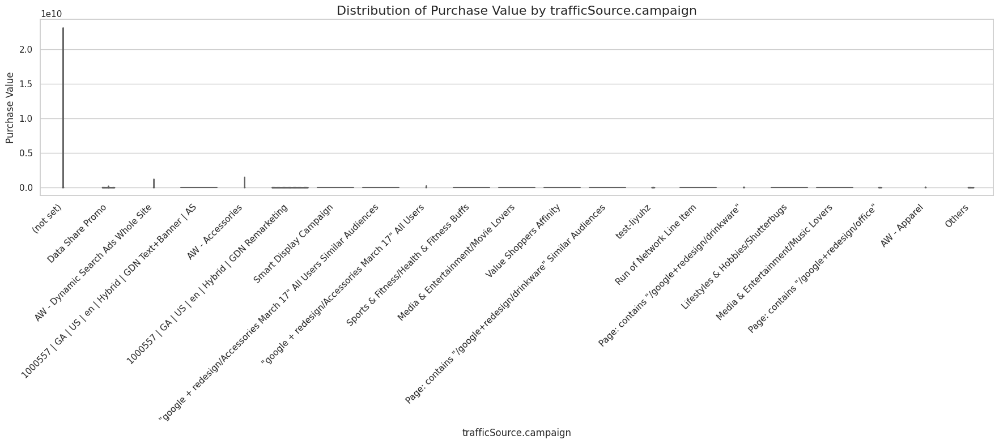




--- Plotting: device.mobileDeviceMarketingName ---



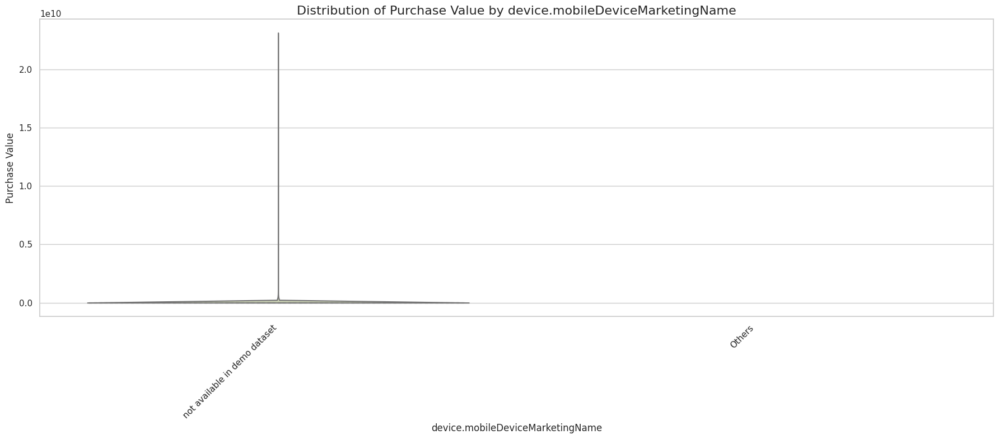




--- Plotting: geoNetwork.networkDomain ---



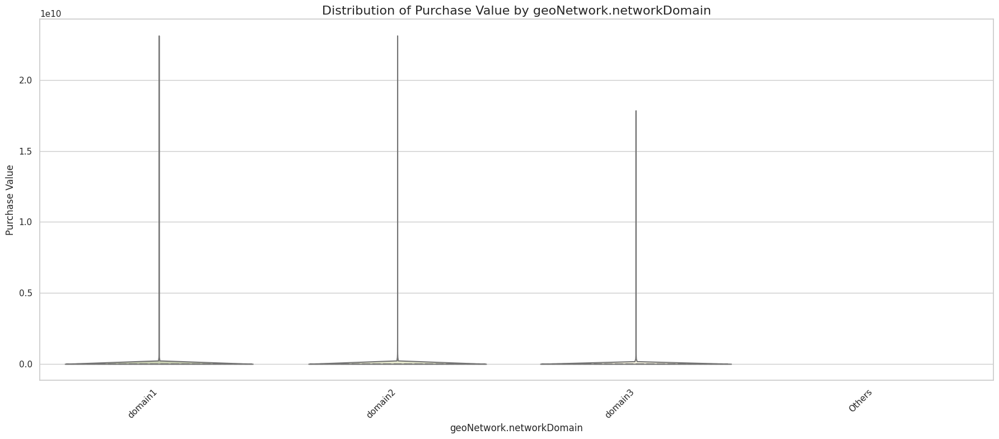




--- Plotting: device.operatingSystemVersion ---



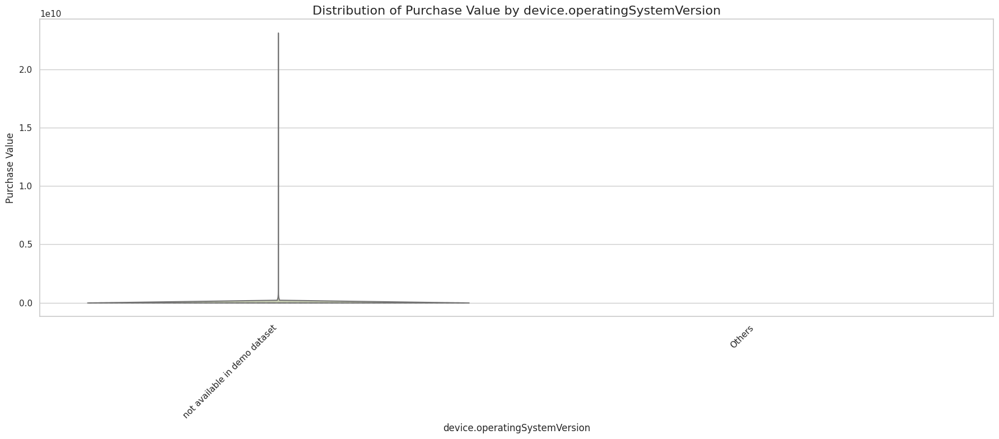




--- Plotting: device.flashVersion ---



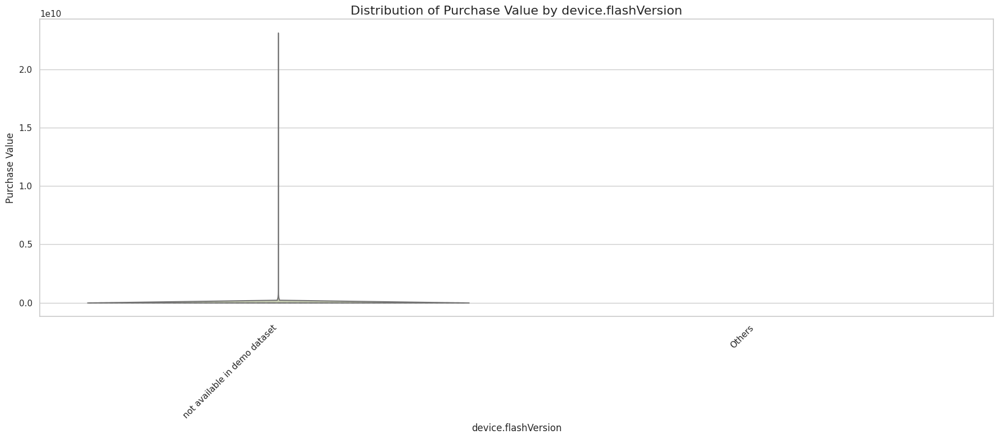




--- Plotting: geoNetwork.region ---



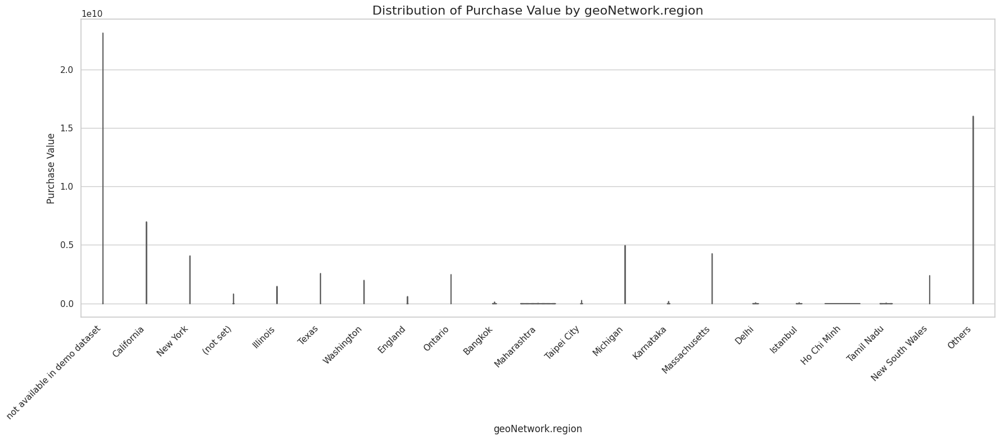




--- Plotting: trafficSource ---



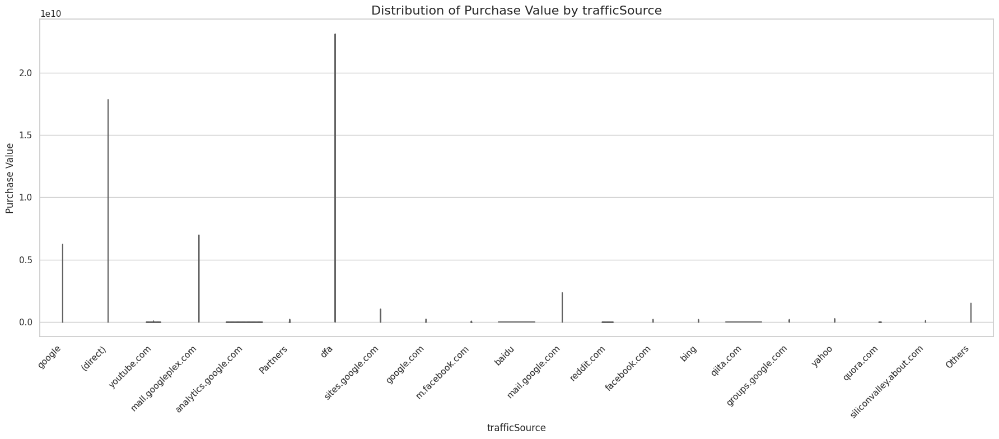




--- Plotting: geoNetwork.networkLocation ---



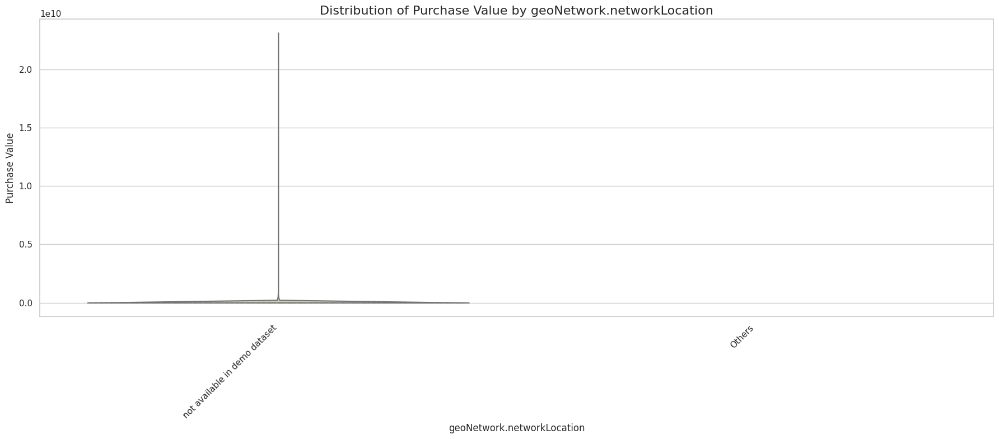




--- Plotting: os ---



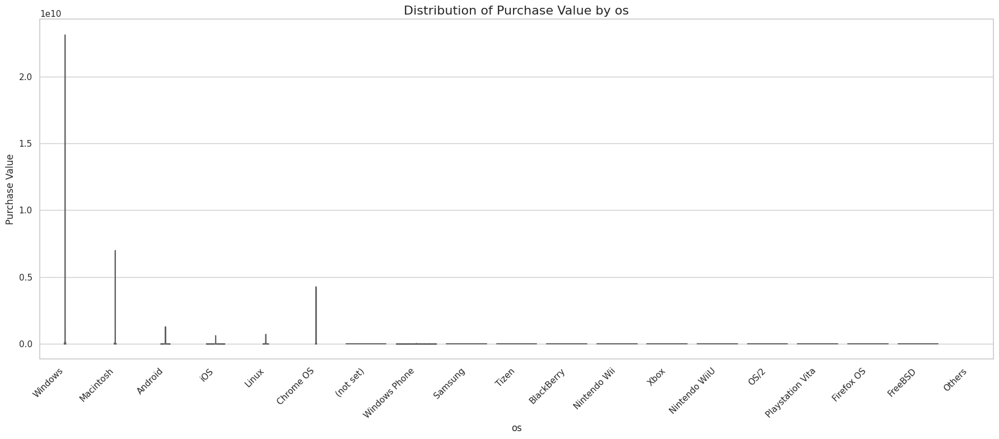




--- Plotting: geoNetwork.subContinent ---



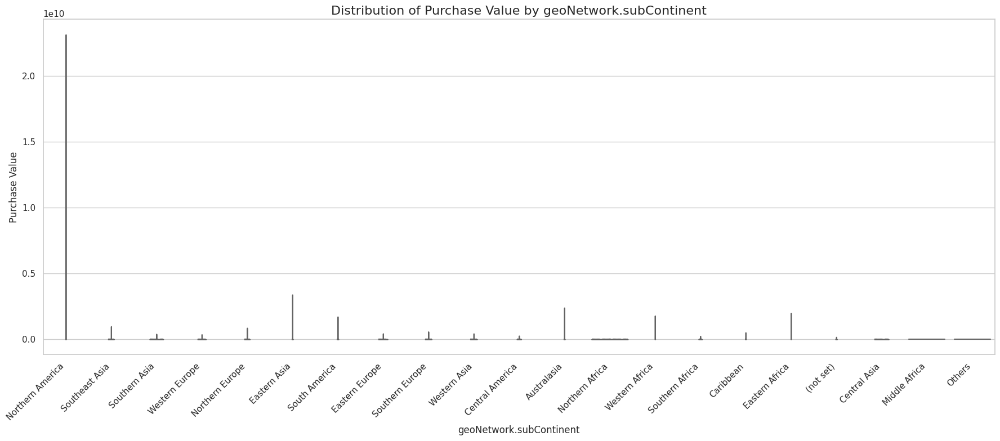




--- Plotting: trafficSource.medium ---



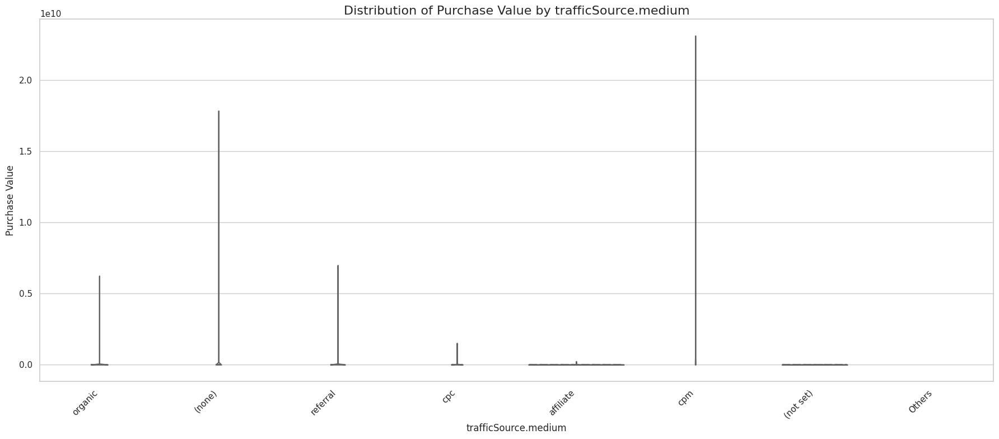




--- Plotting: trafficSource.adwordsClickInfo.isVideoAd ---



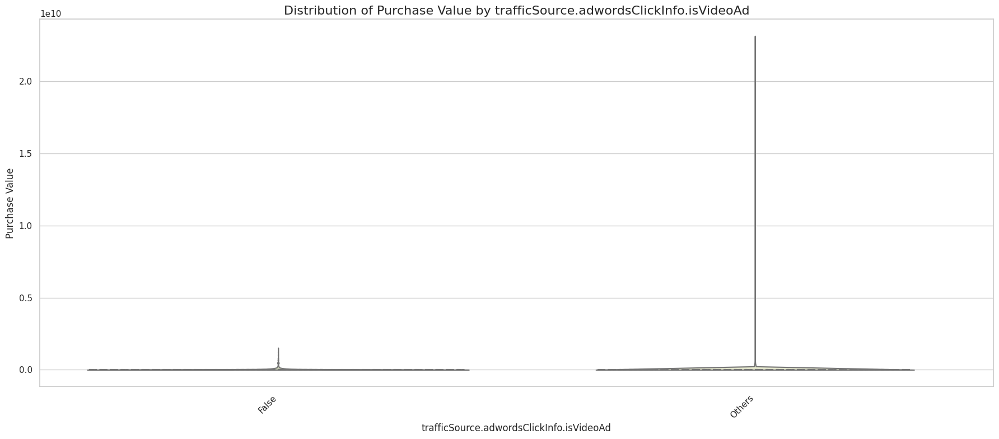




--- Plotting: browserMajor ---



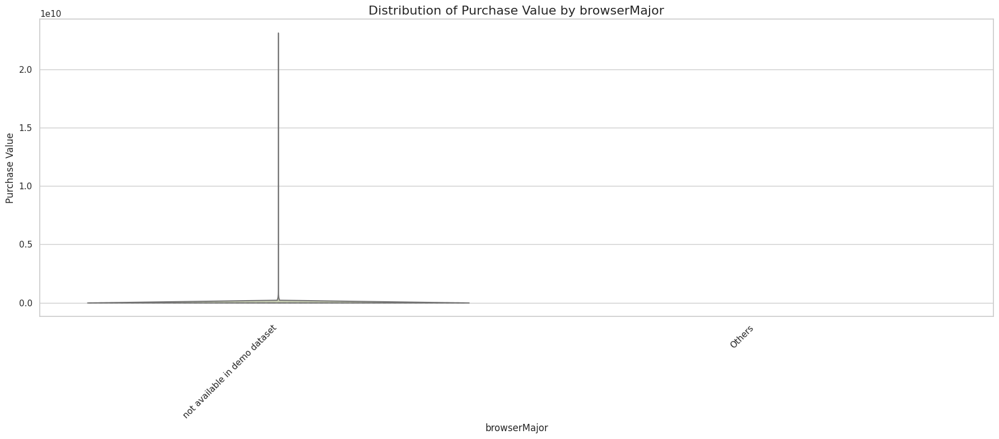




--- Plotting: locationCountry ---



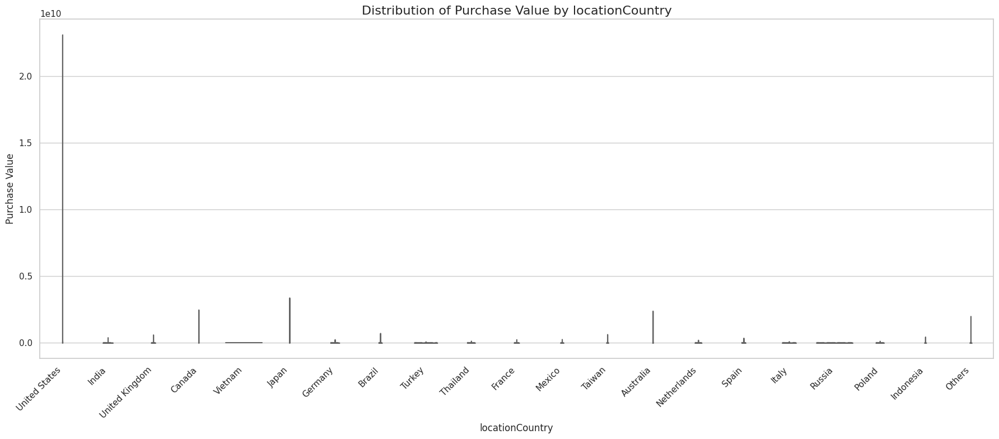




--- Plotting: device.browserSize ---



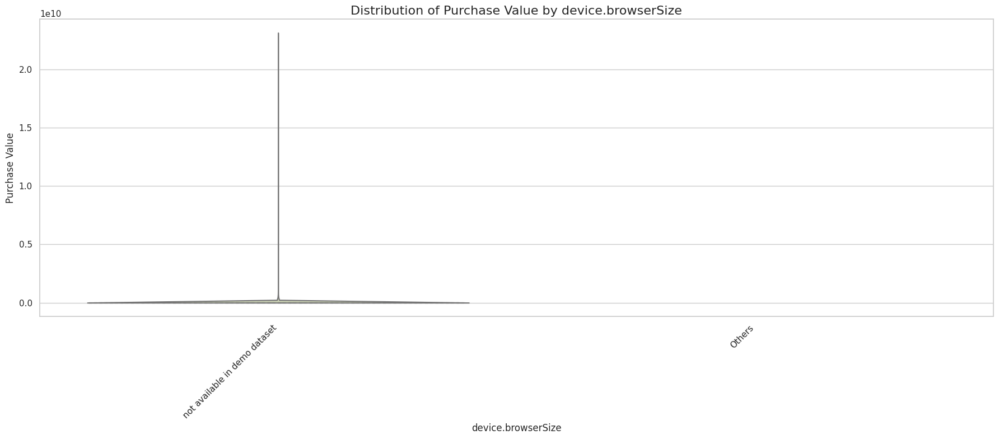




--- Plotting: trafficSource.adwordsClickInfo.adNetworkType ---



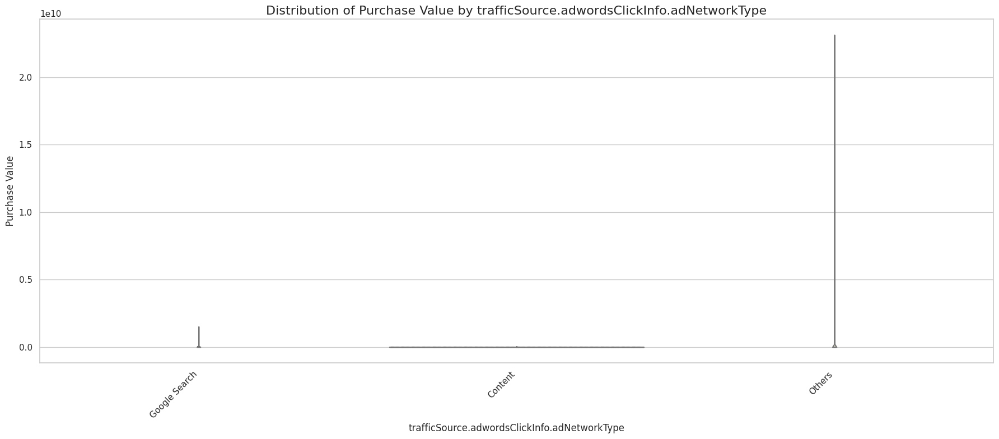




--- Plotting: socialEngagementType ---



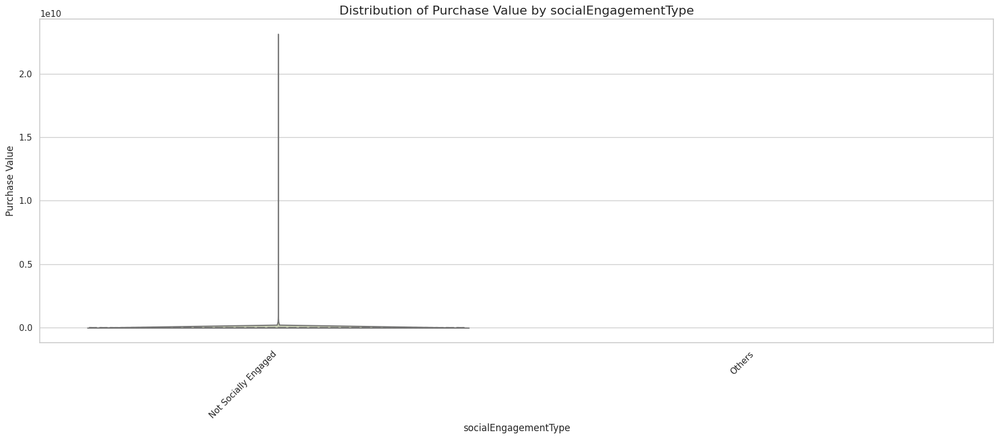




--- Plotting: geoNetwork.city ---



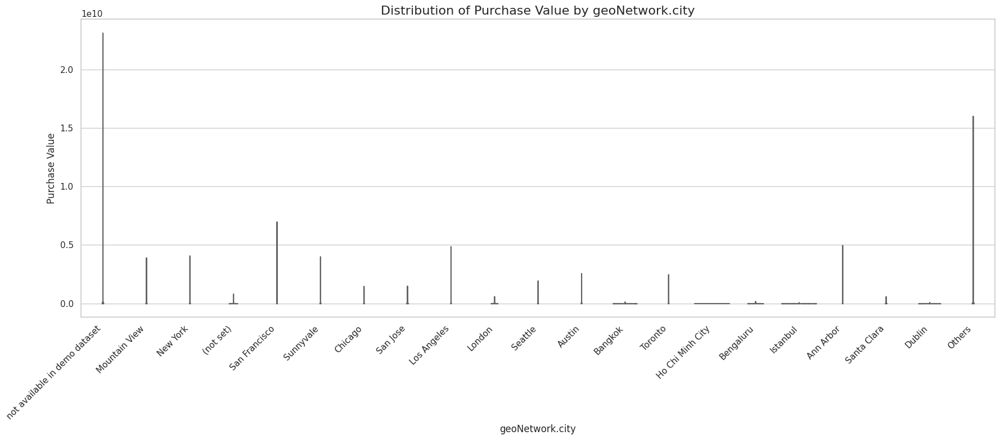




--- Plotting: geoNetwork.metro ---



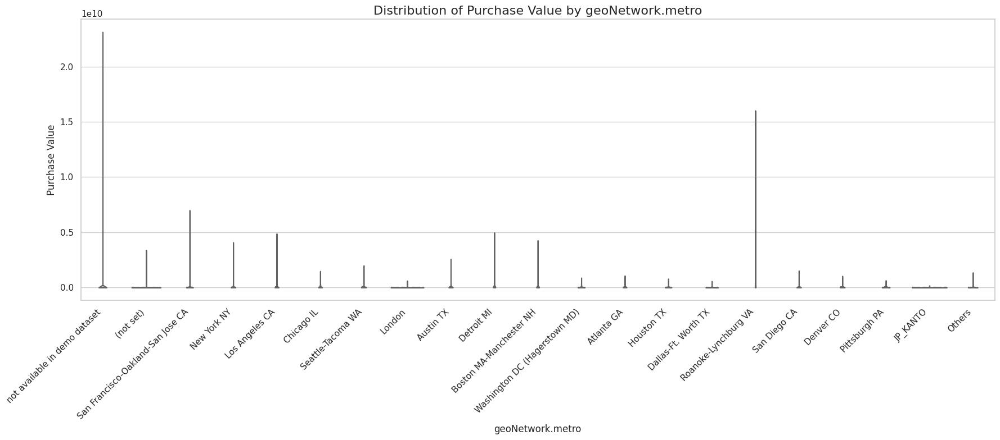




--- Plotting: device.mobileDeviceModel ---



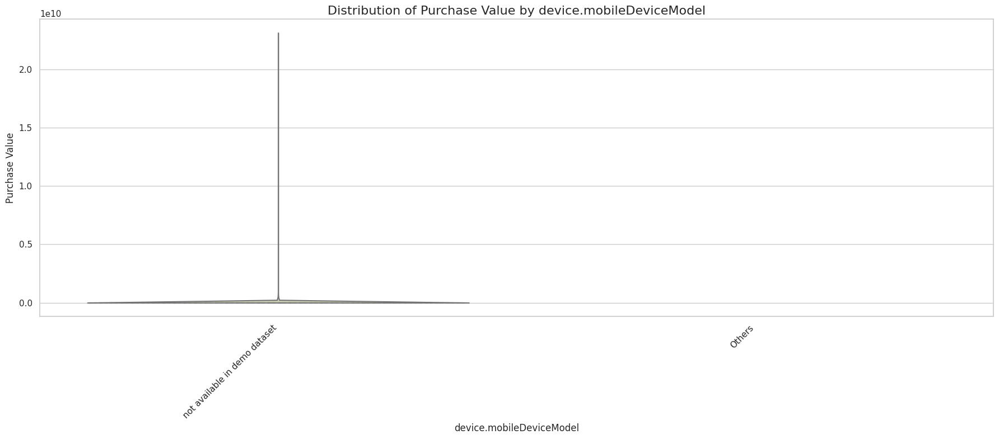




--- Plotting: trafficSource.referralPath ---



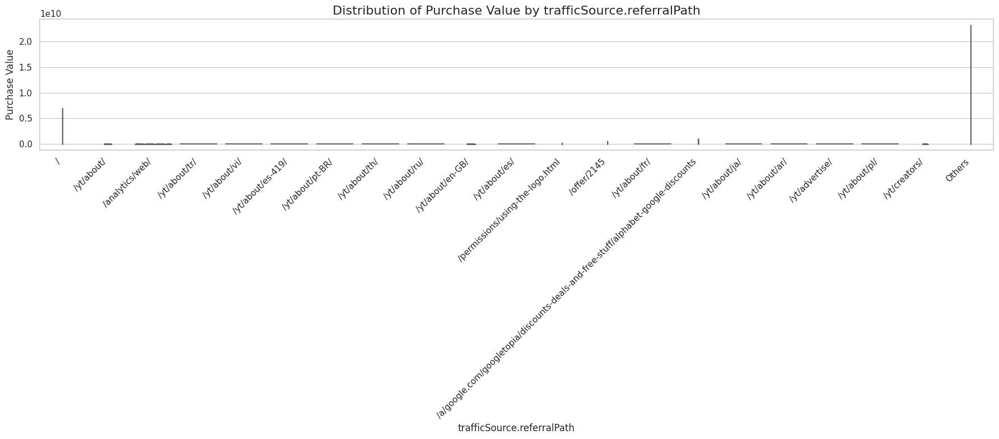




--- Plotting: device.language ---



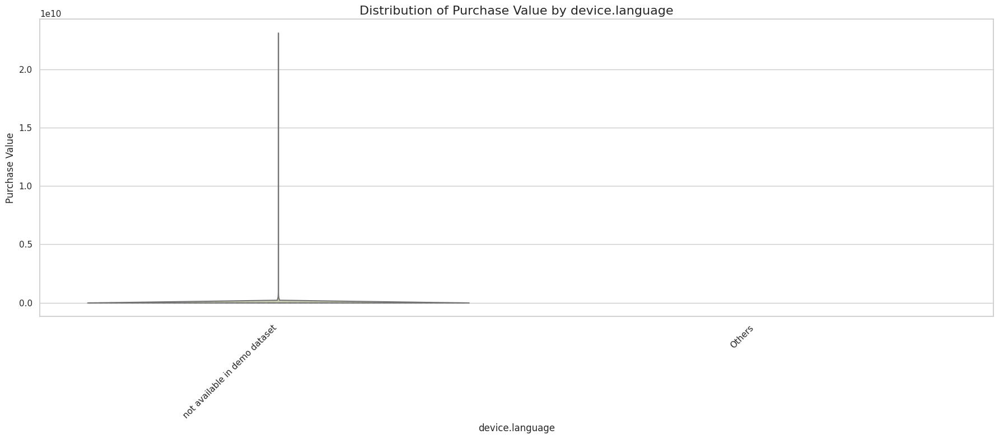




--- Plotting: deviceType ---



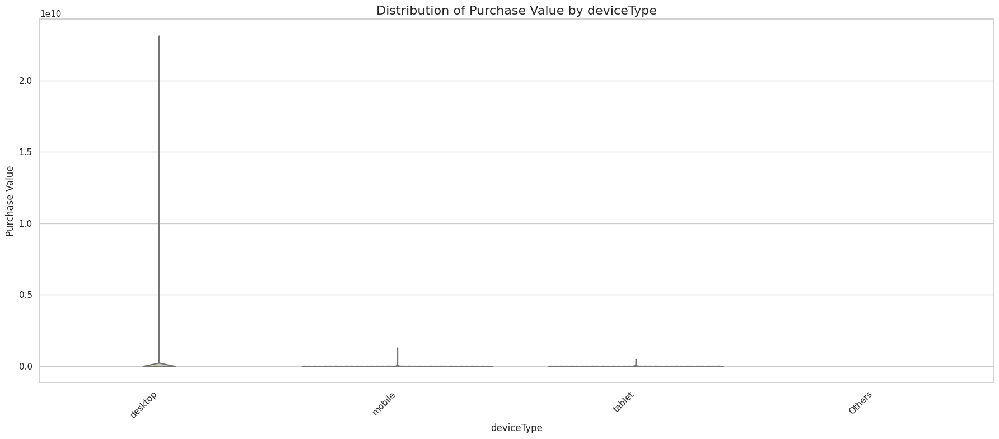




--- Plotting: userChannel ---



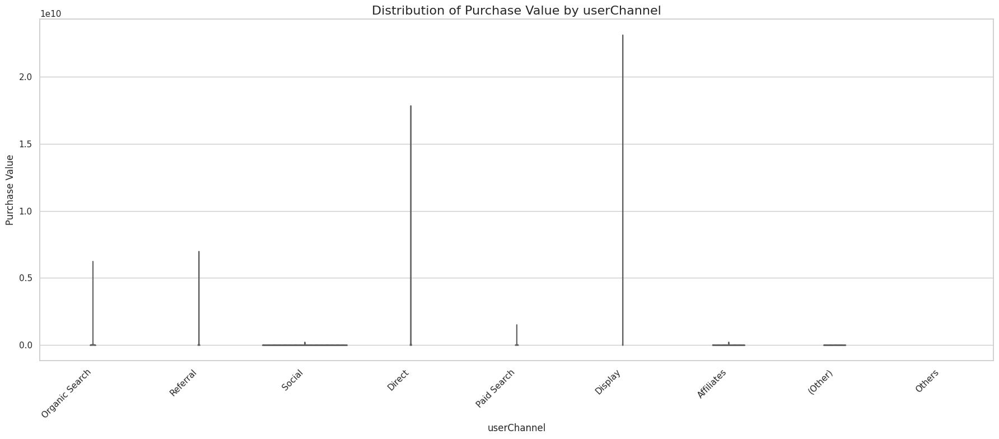




--- Plotting: device.browserVersion ---



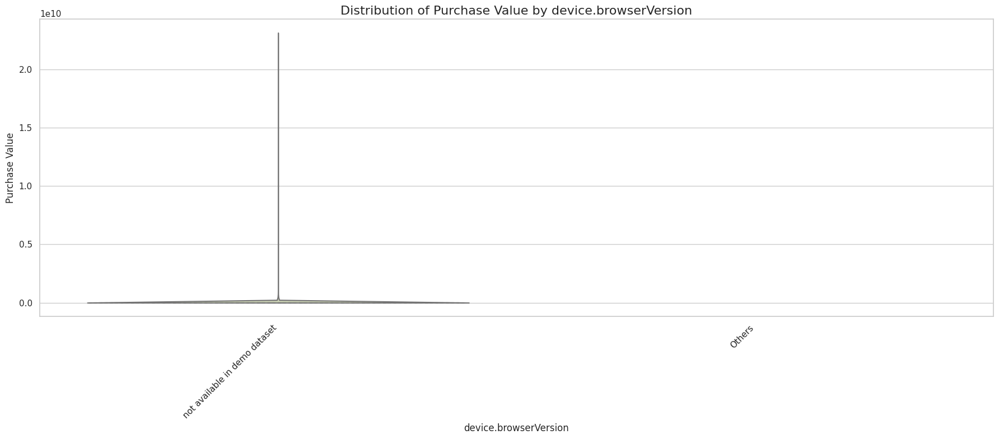




--- Plotting: device.screenColors ---



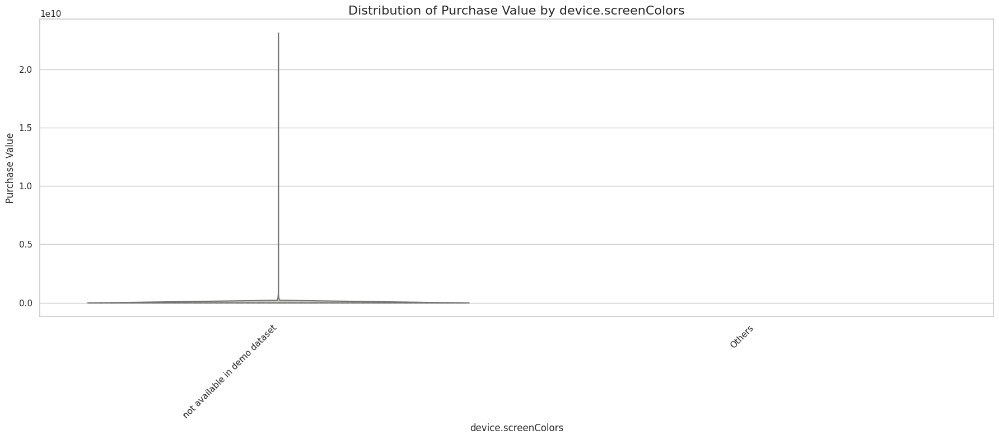




--- Plotting: geoNetwork.continent ---



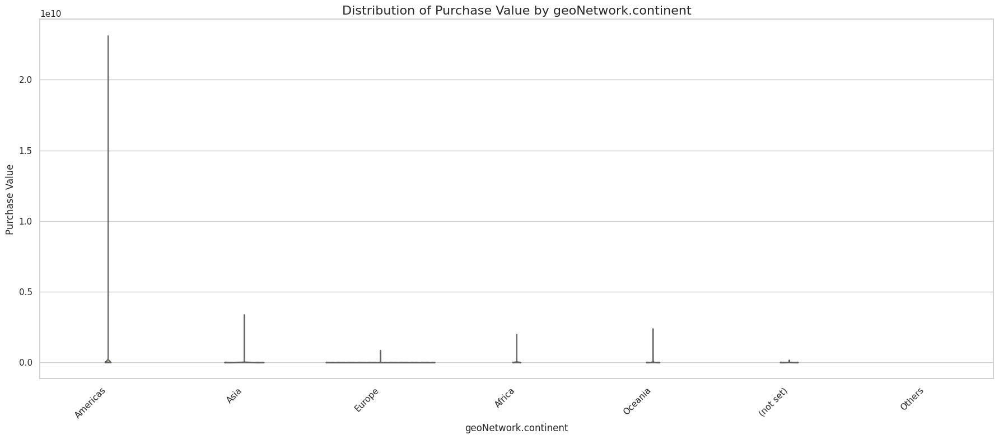




--- Plotting: device.isMobile ---



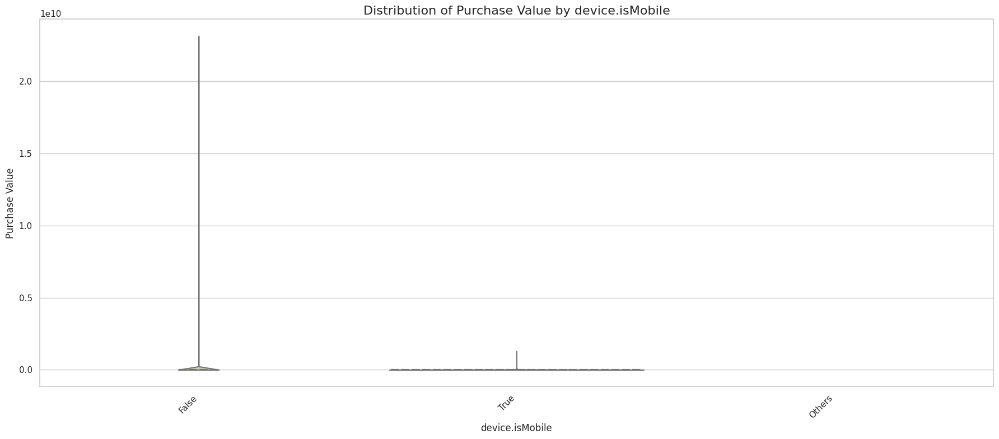

In [26]:
# Disable matplotlib font-related warnings
logging.getLogger('matplotlib.font_manager').disabled = True
warnings.filterwarnings("ignore", category=UserWarning)

categorical_columns = train_df.select_dtypes(include=['object', 'boolean', 'category'])

sns.set(style="whitegrid")

colors = ["#ccd5ae","#e9edc9","#fefae0","#faedcd","#d4a373"]
data = train_df.copy()

# Visualizing using Violin Plot
for idx, col in enumerate(categorical_columns):
    print(f"\n\n\n--- Plotting: {col} ---\n")

    top_20 = data[col].value_counts().nlargest(20).index
    data[col] = data[col].apply(lambda x: x if x in top_20 else "Others")
    data[col] = pd.Categorical(data[col], categories=list(top_20) + ["Others"], ordered=True)

    plt.figure(figsize=(18, 8))
    sns.violinplot(data=data, x=col, y='purchaseValue', palette=colors, inner="quartile", cut=0)

    plt.title(f"Distribution of Purchase Value by {col}", fontsize=16)
    plt.xlabel(col, fontsize=12)
    plt.ylabel("Purchase Value", fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

##### **Interpretation:**

 <ul style="font-family: Courier New; font-size: 1.05rem;">
    <li>X-axis → Categorical Feature</li>
    <li>Y-axis → Target Variable</li>
    <li>The Shape of the `Violin Plot` represents the probability density of purchaseValue for each category.</li>
    <li>Wider parts indicate where data is denser.</li>
    <li>Narrower parts mean fewer data points.</li>
</ul>

<br><br>

## **Categorical Columns With Null / Missing Values**

In [27]:
categorical_columns = train_df.select_dtypes(include=['object', 'boolean', 'category'])

cat_null_columns, total_cat_null_columns, counts = [], [], {}

print(f"\n|{51 * '-'}|{25 * '-'}|{20 * '-'}|")
print(f"| Columns With Null Values{(50 - len('Columns With Null Values')) * ' '}|{5 * ' '}Total Null Values{(20 - (len('Total Null Values'))) * ' '}|{5 * ' '}Percentage{(15 - len('Percentage')) * ' '}|")
print(f"|{51 * '-'}|{25 * '-'}|{20 * '-'}|")
#print(f"|{51 * ' '}|{25 * ' '}|{20 * ' '}|")

for col in categorical_columns :
    val = train_df[col].isna().sum()
    if val != 0 :
        per = round(val * 100 / train_df.shape[0], 4)
        if per >= 70.0 :
            cat_null_columns.append(col)
        total_cat_null_columns.append(col)
        counts[col] = val
        print(f"| {col}{(50-len(col)) * ' '}|{5 * ' '}{val}{(20 - (len(str(val)))) * ' '}|{5 * ' '}{per}{(15 - len(str(per))) * ' '}|")

print(f"|{51 * '_'}|{25 * '_'}|{20 * '_'}|\n\n")

print(f"Total Null Columns With >70% Null / Missing Values : {len(num_null_columns)}")


|---------------------------------------------------|-------------------------|--------------------|
| Columns With Null Values                          |     Total Null Values   |     Percentage     |
|---------------------------------------------------|-------------------------|--------------------|
| trafficSource.isTrueDirect                        |     73133               |     63.0332        |
| trafficSource.adContent                           |     113060              |     97.4462        |
| trafficSource.keyword                             |     71861               |     61.9369        |
| trafficSource.adwordsClickInfo.slot               |     111742              |     96.3102        |
| trafficSource.adwordsClickInfo.isVideoAd          |     111742              |     96.3102        |
| trafficSource.adwordsClickInfo.adNetworkType      |     111742              |     96.3102        |
| trafficSource.referralPath                        |     73309               |     63.184

##### **Interpretation:**

 <ul style="font-family: Courier New; font-size: 1.05rem;">
    <li>There are 7 categorical columns with null / missing values.</li>
    <li>There are 1 categorical column with more than 70% null / missing values, and hence this column lacks useful information due to which this column do not represent distribution well.</li>
    <li>Thus, this column can be removed from the dataset.</li>
</ul>

<br><br>

## **Visualization of Null / Missing Values Using Bar Chart**

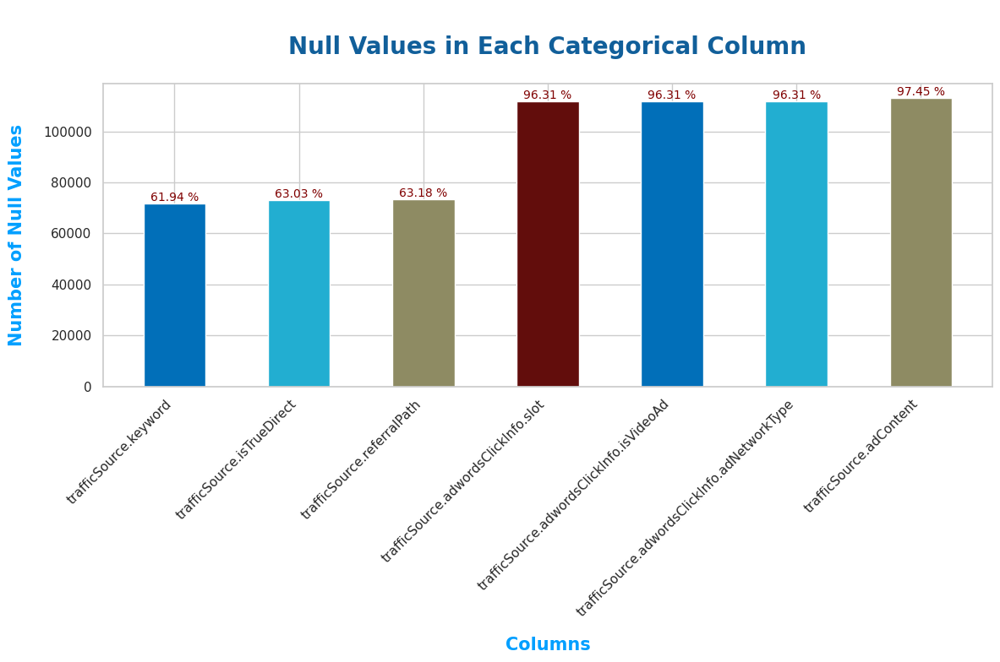

In [28]:
x = []
y = list(counts.values())
y.sort()
sorted_counts = {}
count = 0
for i in y :
    for j in counts :
      if i == counts[j] and j not in x :
        x.append(j)

colors = ["#016fb9", "#22aed1", "#8e8b63", "#620d0c"]
plt.figure(figsize=(12, 8))
bars = plt.bar(x, y, color=colors, width=0.5, alpha=1)
plt.title('\nNull Values in Each Categorical Column', color="#115f9a", fontsize=20, fontweight='bold', pad=25)
plt.xlabel('Columns', color="#009fff", fontsize=15, fontweight='bold', labelpad=15)
plt.ylabel('Number of Null Values', color="#009fff", fontsize=15, fontweight='bold', labelpad=15)
plt.xticks(rotation=45, ha='right')  # Rotate and align x-labels

for bar in bars:
    height = bar.get_height()
    percent = round((bar.get_height() * 100 / train_df.shape[0]), 2)
    plt.text(bar.get_x() + bar.get_width()/2, height + 1, str(percent) + ' %',
             ha='center', va='bottom', fontsize=10, color="maroon")

plt.tight_layout()
plt.show()

<br><br>

## **Total Unique Values in Each Categorical Column**

In [29]:
categorical_columns = train_df.select_dtypes(include=['object', 'boolean', 'category'])

cat_unique_columns, total_cat_unique_columns = [], {}

print(f"\n|{51 * '-'}|{25 * '-'}|")
print(f"| Columns{(50 - len('Columns')) * ' '}|{5 * ' '}Total Unique Values{(20 - (len('Total Unique Values'))) * ' '}|")
print(f"|{51 * '-'}|{25 * '-'}|")
#print(f"|{51 * ' '}|{25 * ' '}|{20 * ' '}|")

for col in categorical_columns :
    val = len(list(train_df[col].unique()))
    if val == 1 :
        cat_unique_columns.append(col)
    elif val == 2 :
        if col in total_cat_null_columns :
            cat_unique_columns.append(col)
    total_cat_unique_columns[col] = val
    print(f"| {col}{(50-len(col)) * ' '}|{5 * ' '}{val}{(20 - (len(str(val)))) * ' '}|")

print(f"|{51 * '_'}|{25 * '_'}|\n\n")


print(f"Columns With Only 1 - Unique Value : \n")
count = 1
for col in cat_unique_columns :
    print(f"{count}.{' ' * (3 - len(str(count)))}{col}")
    count += 1


|---------------------------------------------------|-------------------------|
| Columns                                           |     Total Unique Values |
|---------------------------------------------------|-------------------------|
| trafficSource.isTrueDirect                        |     2                   |
| browser                                           |     34                  |
| device.screenResolution                           |     1                   |
| trafficSource.adContent                           |     54                  |
| trafficSource.keyword                             |     567                 |
| screenSize                                        |     1                   |
| geoCluster                                        |     5                   |
| trafficSource.adwordsClickInfo.slot               |     4                   |
| device.mobileDeviceBranding                       |     1                   |
| device.mobileInputSelector           

##### **Interpretation:**

 <ul style="font-family: Courier New; font-size: 1.05rem;">
    <li>There are 17 columns which have just only one unique value.</li>
    <li>Machine Learning Models learn from variation in data.</li>
    <li>These columns have only one unique value due to which these columns add no information in the Machine Learning Models.</li>
    <li>Presence of these 17 columns will increase the dimensionality of the dataset very much and hence slow down the Machine Learning Model learning.</li>
    <li>In Data Structures & Algorithms, at first we learn that there is the first key requirement which is '`Less Time Complexity`' & '`Less Space Complexity`', but presence of these columns in dataset will violate this requirement.</li>
    <li>Hence, these columns can be easily ignored and removed from dataset.</li>
</ul>

<br><br>

## **Visualization of Unique Values in Each Column**

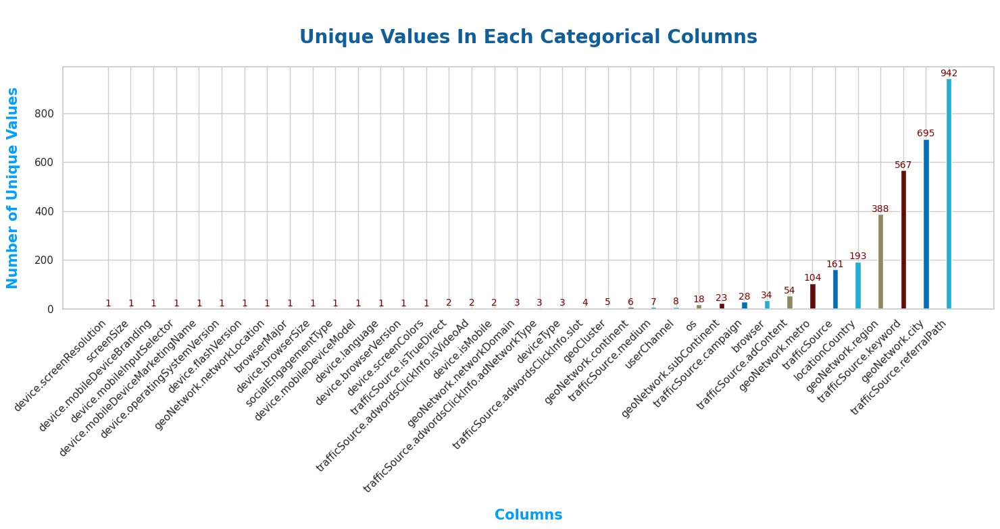

In [30]:
x = []
y = list(total_cat_unique_columns.values())
y.sort()
count = 0
for i in y :
    for j in total_cat_unique_columns :
      if i == total_cat_unique_columns[j] and j not in x :
        x.append(j)

colors = ["#016fb9", "#22aed1", "#8e8b63", "#620d0c"]
plt.figure(figsize=(15, 8))
bars = plt.bar(x, y, color=colors, width=0.25, alpha=1)
plt.title('\nUnique Values In Each Categorical Columns', color="#115f9a", fontsize=20, fontweight='bold', pad=25)
plt.xlabel('Columns', color="#009fff", fontsize=15, fontweight='bold', labelpad=15)
plt.ylabel('Number of Unique Values', color="#009fff", fontsize=15, fontweight='bold', labelpad=15)
plt.xticks(rotation=45, ha='right')  # Rotate and align x-labels

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 1, height,
             ha='center', va='bottom', fontsize=10, color="maroon")

plt.tight_layout()
plt.show()

<br><br>

## **High Cardinality Columns**

In [31]:
card_columns, total_num_card_columns = [], {}

print(f"\n|{51 * '-'}|{25 * '-'}|")
print(f"| High Cardinality Columns{(50 - len('High Cardinality Columns')) * ' '}|{5 * ' '}Total Unique Values{(20 - (len('Total Unique Values'))) * ' '}|")
print(f"|{51 * '-'}|{25 * '-'}|")
#print(f"|{51 * ' '}|{25 * ' '}|{20 * ' '}|")

cols = list(categorical_columns).copy()

for col in cols :
    val = len(list(train_df[col].unique()))
    if val >= 1000 :
        card_columns.append(col)
        total_num_card_columns = val
        print(f"| {col}{(50-len(col)) * ' '}|{5 * ' '}{val}{(20 - (len(str(val)))) * ' '}|")

print(f"|{51 * '_'}|{25 * '_'}|\n\n")


print(f"Total Columns With High Cardinality : {len(card_columns)}")


|---------------------------------------------------|-------------------------|
| High Cardinality Columns                          |     Total Unique Values |
|---------------------------------------------------|-------------------------|
|___________________________________________________|_________________________|


Total Columns With High Cardinality : 0


##### **Interpretation:**

 <ul style="font-family: Courier New; font-size: 1.05rem;">
    <li>There are 116023 rows in dataset.</li>
    <li>I have used condition where unqiue values are greater than 1000.</li>
    <li>But here, no column has high cardinality.</li>
</ul>

<br><br>

## **Visualization of Categorical Columns With High Cardinality**

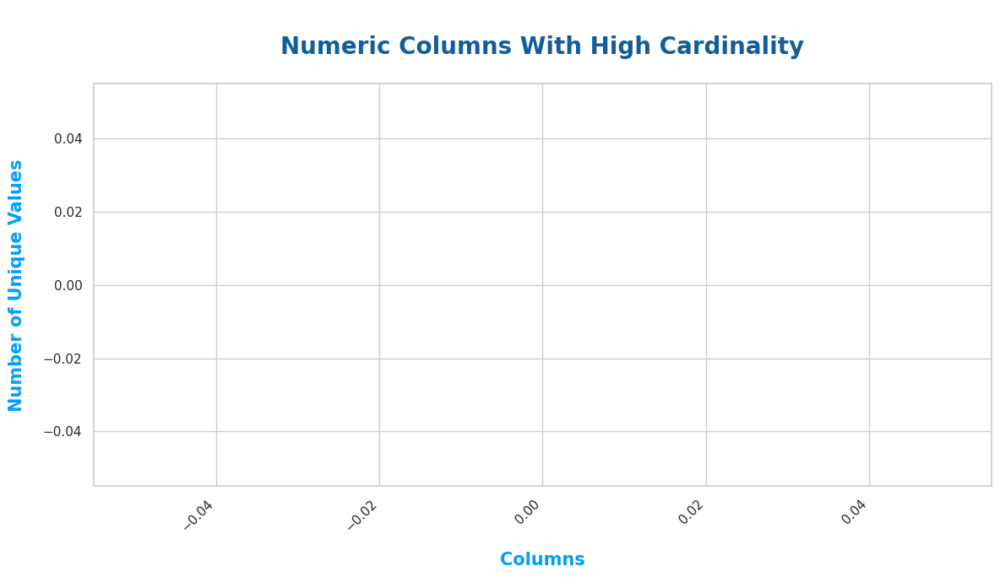

In [32]:
x = []
y = list(total_num_card_columns.values())
y.sort()
count = 0
for i in y :
    for j in total_num_card_columns :
      if i == total_num_card_columns[j] and j not in x :
        x.append(j)

colors = ["#016fb9", "#22aed1", "#8e8b63", "#620d0c"]
plt.figure(figsize=(12, 7))
bars = plt.bar(x, y, color=colors, width=0.25, alpha=1)
plt.title('\nNumeric Columns With High Cardinality', color="#115f9a", fontsize=20, fontweight='bold', pad=25)
plt.xlabel('Columns', color="#009fff", fontsize=15, fontweight='bold', labelpad=15)
plt.ylabel('Number of Unique Values', color="#009fff", fontsize=15, fontweight='bold', labelpad=15)
plt.xticks(rotation=45, ha='right')

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 1, height,
             ha='center', va='bottom', fontsize=10, color="maroon")

plt.tight_layout()
plt.show()

<br><br>

## **Bivariate Analysis : Categorical Columns V/S Target Variable**

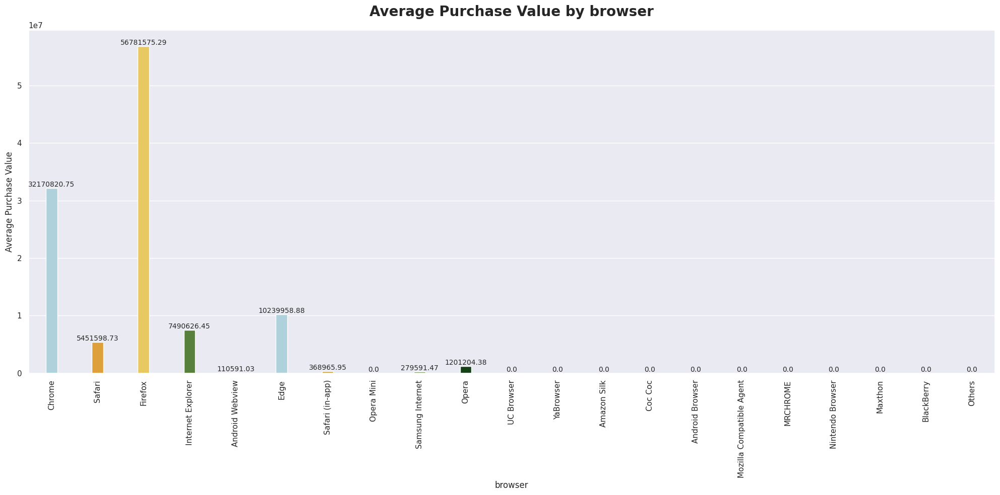

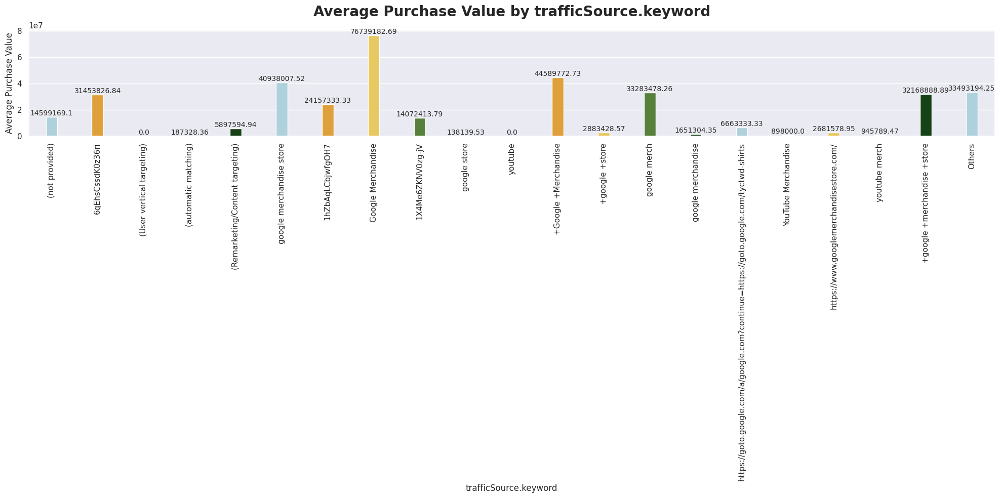

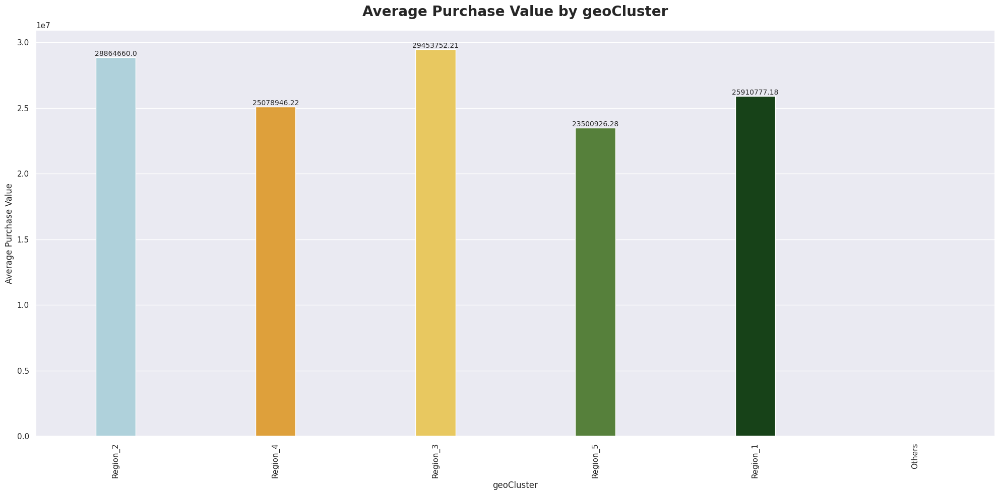

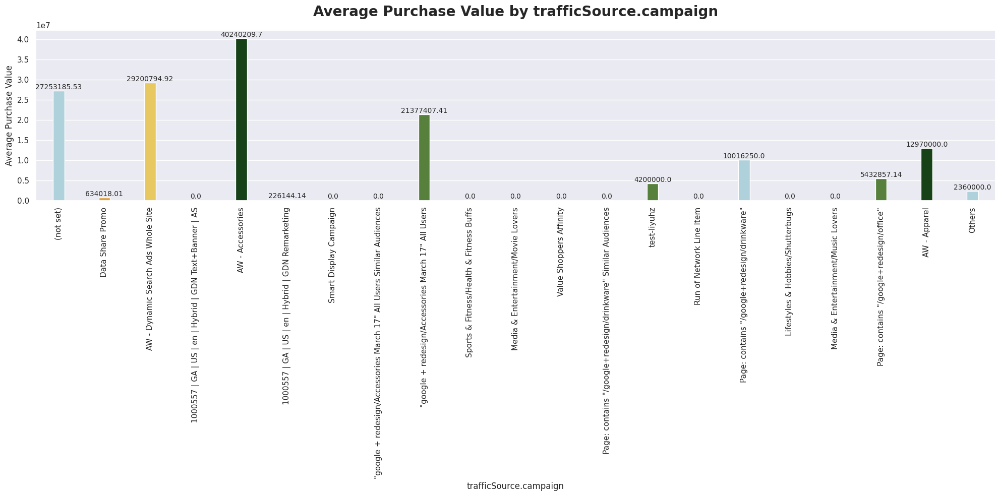

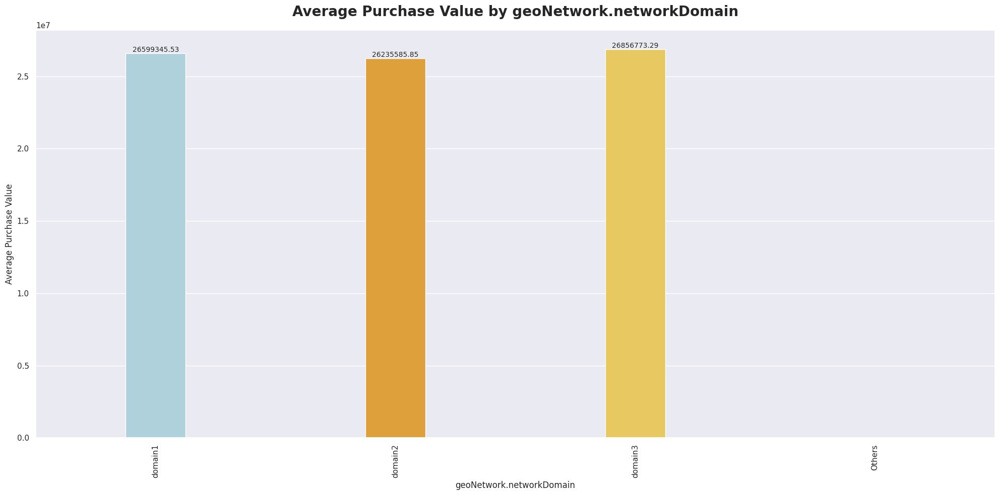

...

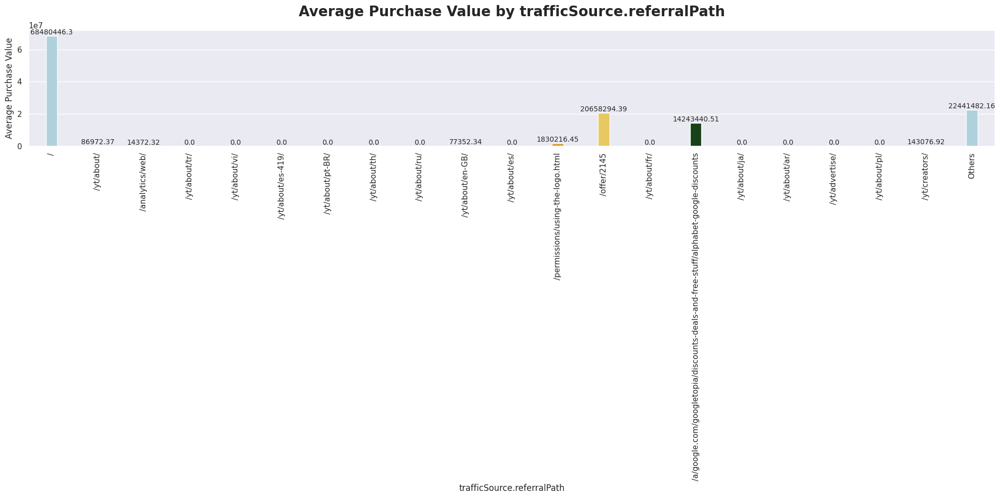

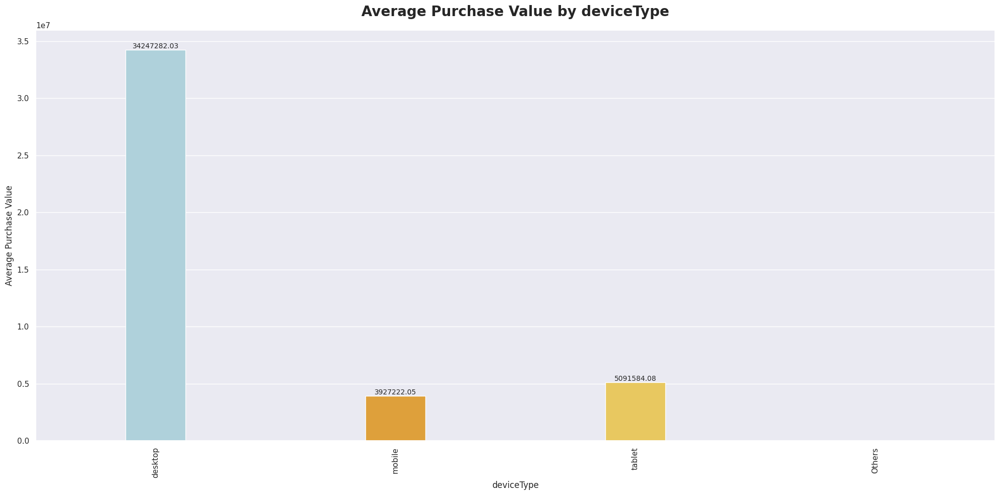

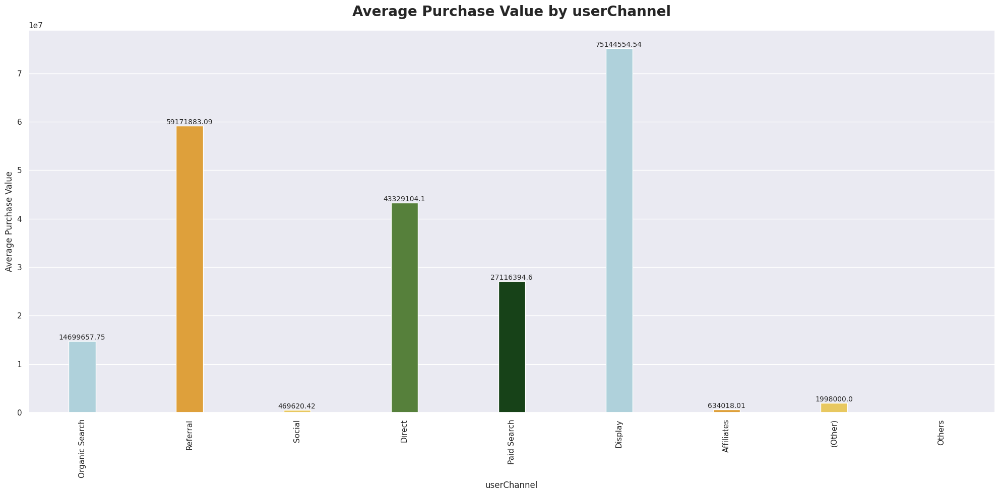

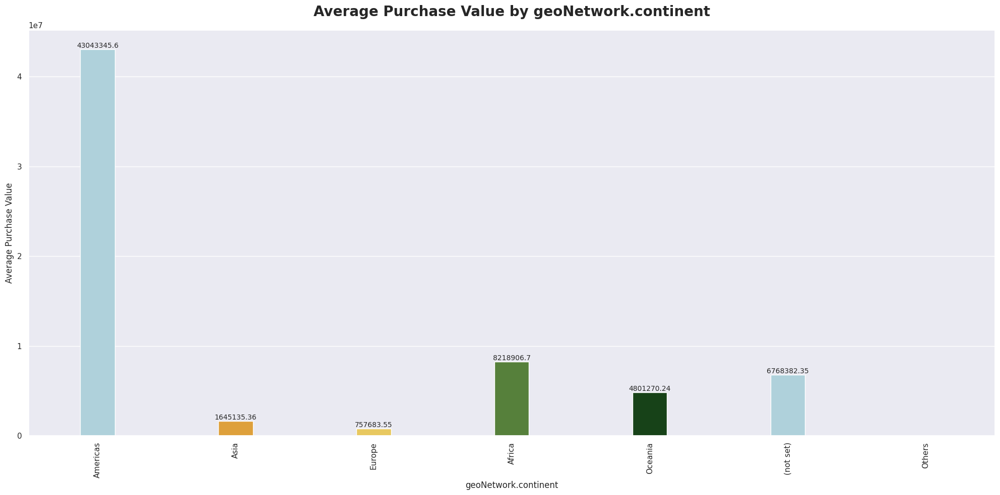

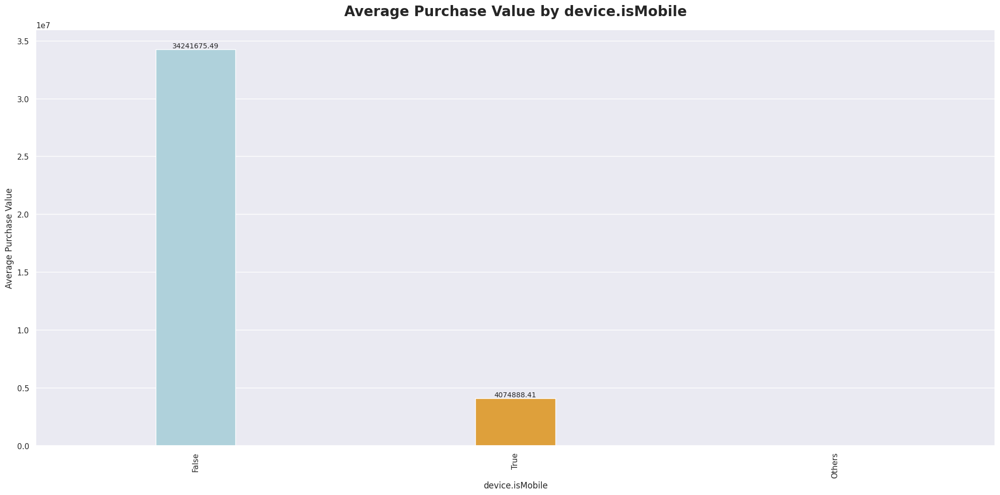

In [33]:
categorical_columns = train_df.select_dtypes(include=['object', 'boolean', 'category'])

categorical_data_columns = []

for col in categorical_columns :
    if col not in cat_null_columns and col not in cat_unique_columns :
        categorical_data_columns.append(col)

sns.set()

data = train_df.copy()
colors = ["#a8d5e2","#f9a620","#ffd449","#548c2f","#104911"]

for col in categorical_data_columns :
    
    top_20 = data[col].value_counts().nlargest(20).index
    data[col] = data[col].apply(lambda x: x if x in top_20 else "Others")
    data[col] = pd.Categorical(data[col], categories=list(top_20) + ["Others"], ordered=True)
    plt.figure(figsize=(20, 10))
    bars = sns.barplot(x=col, y='purchaseValue', data=data, width=0.25, estimator='mean', errorbar=None, palette=colors)
    plt.xticks(rotation=90)
    plt.title(f"Average Purchase Value by {col}", fontweight="bold", fontsize=20, pad=20)
    plt.ylabel("Average Purchase Value")
    plt.xlabel(col)

    for bar in bars.patches:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, height + 1, round(height, 2), ha='center', va='bottom', fontsize=10)
    
    plt.tight_layout()
    plt.show()
    print("\n\n")


<br><br><br><br><br>

# **Feature Engineering**
---

<br><br>

### **Copy The Datasets**

In [34]:
train_df = train_data.copy()
test_df = test_data.copy()

In [35]:
train_df.select_dtypes(include=['number'])

,purchaseValue,userId,gclIdPresent,sessionNumber,totals.visits,sessionId,trafficSource.adwordsClickInfo.page,pageViews,locationZone,totals.bounces,date,totalHits,sessionStart,new_visits
0,0.0,61421,0,1,1,1500100799,NaN,1.0,8,1.0,20170714,1,1500100799,1.0
1,0.0,72287,0,1,1,1495262065,NaN,1.0,8,1.0,20170519,1,1495262065,1.0
2,0.0,25180,0,2,1,1508510328,NaN,6.0,8,NaN,20171020,6,1508510328,NaN
3,0.0,41295,0,1,1,1483431838,NaN,1.0,8,1.0,20170103,1,1483431838,1.0
4,88950000.0,113697,0,1,1,1475804633,NaN,54.0,8,NaN,20161006,66,1475804633,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116018,35180000.0,109014,0,1,1,1500318402,NaN,26.0,8,NaN,20170717,28,1500318402,1.0
116019,0.0,66111,0,1,1,1478624150,NaN,1.0,8,1.0,20161108,1,1478624150,1.0
116020,0.0,97614,0,2,1,1470384216,NaN,1.0,8,1.0,20160805,1,1470384216,NaN
116021,0.0,71050,0,1,1,1506953297,NaN,2.0,8,NaN,20171002,2,1506953297,1.0


<br><br>
# Dropping columns with > 70 % Null / Missing Values

In [36]:
for col in train_df.columns :
    if col in num_null_columns or col in cat_null_columns :
        train_df = train_df.drop(col, axis=1)


print(f"\nTotal Columns : {len(list(train_df.columns))}\n")


Total Columns : 47



<br><br>
# Dropping columns with Constant or Single Unique Value

In [37]:
for col in train_df.columns :
    if col in num_unique_columns or col in cat_unique_columns :
        train_df = train_df.drop(col, axis=1)


print(f"\nTotal Columns : {len(list(train_df.columns))}")


Total Columns : 27


<br><br>

### **Verifiy If Any Column Have Null Values**

In [38]:
print(f"\n\n{int((98 - len('Verification If Any Column Have Null Values')) / 2) * ' '}Verification If Any Column Have Null Values\n")
print(f"\n|{51 * '-'}|{25 * '-'}|{20 * '-'}|")
print(f"| Columns{(50 - len('Columns')) * ' '}|{5 * ' '}Total Null Values{(20 - (len('Total Null Values'))) * ' '}|{5 * ' '}Percentage{(15 - len('Percentage')) * ' '}|")
print(f"|{51 * '-'}|{25 * '-'}|{20 * '-'}|\n\n")
#print(f"|{51 * ' '}|{25 * ' '}|{20 * ' '}|")

null_columns = []

cols = list(train_df.columns)
for col in cols :
    val = train_df[col].isnull().sum()
    per = round(val * 100 / train_df.shape[0], 4)
    null_columns.append(col)
    print(f"| {col}{(50-len(col)) * ' '}|{5 * ' '}{val}{(20 - (len(str(val)))) * ' '}|{5 * ' '}{per}{(15 - len(str(per))) * ' '}|")

print(f"|{51 * '_'}|{25 * '_'}|{20 * '_'}|\n\n")



                           Verification If Any Column Have Null Values


|---------------------------------------------------|-------------------------|--------------------|
| Columns                                           |     Total Null Values   |     Percentage     |
|---------------------------------------------------|-------------------------|--------------------|


| purchaseValue                                     |     0                   |     0.0            |
| browser                                           |     0                   |     0.0            |
| trafficSource.keyword                             |     71861               |     61.9369        |
| geoCluster                                        |     0                   |     0.0            |
| userId                                            |     0                   |     0.0            |
| trafficSource.campaign                            |     0                   |     0.0            |
| geoNetwork.n

<br><br>

### **Imputing Missing Values**

In [39]:
train_df['pageViews'] = train_df['pageViews'].fillna(train_df['pageViews'].median())                # Filled with median
train_df['trafficSource.referralPath'] = train_df['trafficSource.referralPath'].fillna('direct')  # Let's assuming 'direct'
train_df['trafficSource.keyword'] = train_df['trafficSource.keyword'].fillna('not provided')      # Let's assuming 'not provided'

<br><br>

### **Verifiy If Any Column Have Null Values**

In [40]:
print(f"\n\n{int((98 - len('Verification If Any Column Have Null Values')) / 2) * ' '}Verification If Any Column Have Null Values\n")
print(f"\n|{51 * '-'}|{25 * '-'}|{20 * '-'}|")
print(f"| Columns{(50 - len('Columns')) * ' '}|{5 * ' '}Total Null Values{(20 - (len('Total Null Values'))) * ' '}|{5 * ' '}Percentage{(15 - len('Percentage')) * ' '}|")
print(f"|{51 * '-'}|{25 * '-'}|{20 * '-'}|\n\n")
#print(f"|{51 * ' '}|{25 * ' '}|{20 * ' '}|")

null_columns = []

cols = list(train_df.columns)
for col in cols :
    val = train_df[col].isnull().sum()
    per = round(val * 100 / train_df.shape[0], 4)
    null_columns.append(col)
    print(f"| {col}{(50-len(col)) * ' '}|{5 * ' '}{val}{(20 - (len(str(val)))) * ' '}|{5 * ' '}{per}{(15 - len(str(per))) * ' '}|")

print(f"|{51 * '_'}|{25 * '_'}|{20 * '_'}|\n\n")



                           Verification If Any Column Have Null Values


|---------------------------------------------------|-------------------------|--------------------|
| Columns                                           |     Total Null Values   |     Percentage     |
|---------------------------------------------------|-------------------------|--------------------|


| purchaseValue                                     |     0                   |     0.0            |
| browser                                           |     0                   |     0.0            |
| trafficSource.keyword                             |     0                   |     0.0            |
| geoCluster                                        |     0                   |     0.0            |
| userId                                            |     0                   |     0.0            |
| trafficSource.campaign                            |     0                   |     0.0            |
| geoNetwork.n

<br><br>

### **Separating Target & Features**

In [41]:
y = train_df["purchaseValue"]                     # Target Variable / Column
X = train_df.drop("purchaseValue", axis=1)        # Features

<br><br>

### **Splitting Train & Validation Datasets**

In [42]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=39)

<br><br>

### **Getting Numeric & Categorical Features in Train Dataset**

In [43]:
# Nuemric Data Features
num_train_columns  = X.select_dtypes(include=["number"]).columns.tolist() 

# Category Data Features
cat_train_columns  = X.select_dtypes(include=["bool", "object", "category"]).columns.tolist()

<br><br>

### **Pipeline For Numeric Features**

In [44]:
# Pipeline For Numerical Columns

num_pipeline = Pipeline(
                   steps=[
                        ("Imputer", SimpleImputer(strategy="mean")),
                        ("Scaler", StandardScaler())
                    ]
                )

<br><br>

### **Pipeline For Categorical Features**

In [45]:
cat_pipeline = Pipeline(
                   steps=[
                        ("Imputer", SimpleImputer(strategy="most_frequent")),
                        ("Encoder", OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1))
                        #("Encoder", TargetEncoder(smoothing=10))
                   ]
               )

<br><br>

### **Creating a Combined Preprocessing of Numeric & Categorical Features**

In [46]:
preprocessor = ColumnTransformer(
                   transformers = [
                       ("Numeric Transformer", num_pipeline, num_train_columns),
                       ("Categorical Transformer", cat_pipeline, cat_train_columns)
                   ]
               )

<br><br>

### **Preprocessing Train & Validation Data**

In [47]:
# Preprocesses Train Data
X_train_preprocessed = preprocessor.fit_transform(X_train)

# Preprocessed Validation Data
X_test_preprocessed = preprocessor.transform(X_val)

<br><br><br><br>

# **Model - 1 : XGBRegressor**

<br><br>

### **Building Model Pipeline**

In [48]:
xgb_pipeline = Pipeline([
    ("Preprocessor", preprocessor),
    ("Regressor", XGBRegressor(random_state=42)) # n_estimators=1000, max_depth=8, learning_rate=0.354      It uses gradient descent for minimizing loss function
])

### **Parameter Grid (For Setting Hyperparameters)**

In [49]:
xgb_params = {
    'Regressor__n_estimators': [100, 1000],       # [100, 200, 1000]
    'Regressor__learning_rate': [0.1, 0.354],     # [0.1, 0.354, 0.4]
    'Regressor__max_depth': [3, 10],             # [3, 5, 7, 10]
}

<br>

### **GridSearchCV (For Tuning Hyperparameters)**

In [50]:
grid_search_xgb = GridSearchCV(
    xgb_pipeline,
    param_grid=xgb_params,
    cv=3,
    scoring='r2',
    verbose=2,
    n_jobs=-1
)

<br><br>

### **Fitting XGBRegressor Model On Train Data**

In [51]:
grid_search_xgb.fit(X_train, y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('Preprocessor',
                                        ColumnTransformer(transformers=[('Numeric '
                                                                         'Transformer',
                                                                         Pipeline(steps=[('Imputer',
                                                                                          SimpleImputer()),
                                                                                         ('Scaler',
                                                                                          StandardScaler())]),
                                                                         ['userId',
                                                                          'gclIdPresent',
                                                                          'sessionNumber',
                                                                          'sessionId',
                                                                          'pageViews',
                                                                          'date',
                                                                          'totalHits',
                                                                          'sessionStart']),
                                                                        ('Categorical '
                                                                         'Transformer',
                                                                         Pipeline(steps=[('Imputer',
                                                                                          Simp...
                                                     max_delta_step=None,
                                                     max_depth=None,
                                                     max_leaves=None,
                                                     min_child_weight=None,
                                                     missing=nan,
                                                     monotone_constraints=None,
                                                     multi_strategy=None,
                                                     n_estimators=None,
                                                     n_jobs=None,
                                                     num_parallel_tree=None,
                                                     random_state=42, ...))]),
             n_jobs=-1,
             param_grid={'Regressor__learning_rate': [0.1, 0.354],
                         'Regressor__max_depth': [3, 10],
                         'Regressor__n_estimators': [100, 1000]},
             scoring='r2', verbose=2)

<br>

### **Best Model**

In [52]:
best_model = grid_search_xgb.best_estimator_

### **Predicting & Evaluating R2 Score**

In [53]:
y_pred = best_model.predict(X_val)

xgb_mae_score = mean_absolute_error(y_val, y_pred)
xgb_mse_score = mean_squared_error(y_val, y_pred)
xgb_rmse_score = np.sqrt(mean_squared_error(y_val, y_pred))
xgb_r2_score = r2_score(y_val, y_pred)

print(f"\n\nMean Absolute Error : {xgb_mae_score}")
print(f"\n\nMean Squared Error : {xgb_mse_score}")
print(f"\n\nRoot Mean Squared Error : {xgb_rmse_score}")
print(f"\n\nR2 Score : {xgb_r2_score}")



Mean Absolute Error : 20238490.523838736


Mean Squared Error : 1.8294302028927892e+16


Root Mean Squared Error : 135256430.63798442


R2 Score : 0.6149535562191633


<br><br>

### **Preprocess Test Data For Final Submission**

In [54]:
for col in test_df.columns :
    if col not in X_train.columns :
        test_df = test_df.drop(col, axis=1)
        
print("\n\nTotal Columns in Test Dataset :", len(list(test_df.columns)))

test_df_preprocessed = preprocessor.transform(test_df)



Total Columns in Test Dataset : 26


<br><br>

### **Making Predictions on Test Data**

In [55]:
test_predictions = best_model.predict(test_df)

<br><br>

### **Editing Predictions**

In [56]:
pred = []

for i in test_predictions :
    if i < 0 :
        pred.append(0)
    else :
        pred.append(i)

**Reason :** 

* Some predicted `purchaseValues` may be negative, but we know that purchaseValue cannot be negative.
* Hence, I convert negative predicted `purchaseValues` into `0`.

<br>

### **Final Submission File**

In [57]:
submission = pd.DataFrame(columns = ["id", "purchaseValue"])
submission["id"] = [__ for __ in range(0, len(test_predictions))]
submission["purchaseValue"] = pred
# submission.to_csv('submission.csv',index=False)
print(f"\n\nShape of Submission : {submission.shape}")

# Show preview
print("\n\n=== Predictions for test_data.csv ===")
print(submission.head())



Shape of Submission : (29006, 2)


=== Predictions for test_data.csv ===
   id  purchaseValue
0   0   2.478294e+07
1   1   0.000000e+00
2   2   3.465328e+04
3   3   2.322326e+05
4   4   0.000000e+00


<br><br><br><br>

# **Model 2: Voting Regressor Ensemble (GradientBoostingRegressor + RandomForestRegressor)**

<br>

### **Initializing The VotingRegressor With XGBRegressor & RandomForestRegressor**

In [58]:
xgb = XGBRegressor()
rf = RandomForestRegressor()

voting = VotingRegressor(estimators=[('xgb', xgb), ('rf', rf)])

<br>

### **Creating Model Pipeline**

In [59]:
pipeline = Pipeline([
    ("Preprocessing", preprocessor),
    ("Regressor", voting)
])

<br>

### **Fitting Model Pipeline**

In [60]:
pipeline.fit(X_train, y_train)

Pipeline(steps=[('Preprocessing',
                 ColumnTransformer(transformers=[('Numeric Transformer',
                                                  Pipeline(steps=[('Imputer',
                                                                   SimpleImputer()),
                                                                  ('Scaler',
                                                                   StandardScaler())]),
                                                  ['userId', 'gclIdPresent',
                                                   'sessionNumber', 'sessionId',
                                                   'pageViews', 'date',
                                                   'totalHits',
                                                   'sessionStart']),
                                                 ('Categorical Transformer',
                                                  Pipeline(steps=[('Imputer',
                                                                   SimpleImputer(strategy='most_freque...
                                                           interaction_constraints=None,
                                                           learning_rate=None,
                                                           max_bin=None,
                                                           max_cat_threshold=None,
                                                           max_cat_to_onehot=None,
                                                           max_delta_step=None,
                                                           max_depth=None,
                                                           max_leaves=None,
                                                           min_child_weight=None,
                                                           missing=nan,
                                                           monotone_constraints=None,
                                                           multi_strategy=None,
                                                           n_estimators=None,
                                                           n_jobs=None,
                                                           num_parallel_tree=None,
                                                           random_state=None, ...)),
                                             ('rf',
                                              RandomForestRegressor())]))])

<br>

### **Predicting & Evaluating Model Using R2 Score**

In [61]:
# Predict and evaluate
y_pred = pipeline.predict(X_val)

vot_mae_score = mean_absolute_error(y_val, y_pred)
vot_mse_score = mean_squared_error(y_val, y_pred)
vot_rmse_score = np.sqrt(mean_squared_error(y_val, y_pred))
vot_r2_score = r2_score(y_val, y_pred)

print(f"\n\nMean Absolute Error : {vot_mae_score}")
print(f"\n\nMean Squared Error : {vot_mse_score}")
print(f"\n\nRoot Mean Squared Error : {vot_rmse_score}")
print(f"\n\nR2 Score : {vot_r2_score}")



Mean Absolute Error : 23979337.58948999


Mean Squared Error : 1.8996644759973024e+16


Root Mean Squared Error : 137828316.2487775


R2 Score : 0.600171108084404


<br><br>

### **Preprocess Test Data For Final Submission**

In [62]:
for col in test_df.columns :
    if col not in X_train.columns :
        test_df = test_df.drop(col, axis=1)
        
print("\n\nTotal Columns in Test Dataset :", len(list(test_df.columns)))



Total Columns in Test Dataset : 26


<br>

### **Making Predictions on Test Data**

In [63]:
test_predictions = pipeline.predict(test_df)

<br>

### **Editing Predictions**

In [64]:
pred = []

for i in test_predictions :
    if i < 0 :
        pred.append(0)
    else :
        pred.append(i)

<br>

## **Final Submission File**

In [65]:
submission = pd.DataFrame(columns = ["id", "purchaseValue"])
submission["id"] = [__ for __ in range(0, len(pred))]
submission["purchaseValue"] = pred
# submission.to_csv('submission.csv',index=False)
print(f"S\n\nhape of Submission : {submission.shape}")

# Show preview
print("\n\n=== Predictions for test_data.csv ===")
print(submission.head())

S

hape of Submission : (29006, 2)


=== Predictions for test_data.csv ===
   id  purchaseValue
0   0     34277742.0
1   1     15325494.0
2   2            0.0
3   3            0.0
4   4            0.0


<br><br><br><br>

# **Model - 3 : GradingBoostingRegressor**

<br>

### **Feature Engineering For GradingBoostRegressor**

In [66]:
'''
# Copy The Data

train_df = train_data.copy()
test_df = test_data.copy()

# Dropping columns with > 70 % Null / Missing Values
threshold = 0.3 * train_df.shape[0]
train_df = train_df.dropna(thresh=threshold, axis=1)
print(f"\nTotal Columns : {len(list(train_df.columns))}\n")



# Dropping Colums With Constant / 1 - Unique Value
train_df = train_df.loc[:, train_df.nunique() > 1]
print(f"Total Columns : {len(list(train_df.columns))}\n")



# Imputing Values
train_df['pageViews'] = train_df['pageViews'].fillna(train_df['pageViews'].median())
train_df['trafficSource.referralPath'] = train_df['trafficSource.referralPath'].fillna('(direct)')  # Assume direct traffic
train_df['trafficSource.keyword'] = train_df['trafficSource.keyword'].fillna('(not provided)')  # Common placeholder



# Verification If Any Column Have Null Values
print(f"\n\n{int((98 - len('Verification If Any Column Have Null Values')) / 2) * ' '}Verification If Any Column Have Null Values\n")
print(f"\n|{51 * '-'}|{25 * '-'}|{20 * '-'}|")
print(f"| Columns{(50 - len('Columns')) * ' '}|{5 * ' '}Total Null Values{(20 - (len('Total Null Values'))) * ' '}|{5 * ' '}Percentage{(15 - len('Percentage')) * ' '}|")
print(f"|{51 * '-'}|{25 * '-'}|{20 * '-'}|\n\n")
#print(f"|{51 * ' '}|{25 * ' '}|{20 * ' '}|")

null_columns = []

cols = list(train_df.columns)
for col in cols :
    val = train_df[col].isnull().sum()
    per = round(val * 100 / train_df.shape[0], 4)
    null_columns.append(col)
    print(f"| {col}{(50-len(col)) * ' '}|{5 * ' '}{val}{(20 - (len(str(val)))) * ' '}|{5 * ' '}{per}{(15 - len(str(per))) * ' '}|")

print(f"|{51 * '_'}|{25 * '_'}|{20 * '_'}|\n\n")



# Separating Target (y) And Features (X)
#y = np.log1p(train_df["purchaseValue"])
y = train_df["purchaseValue"]
X = train_df.drop("purchaseValue", axis=1)


# Splitting Train & Validation Datasets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=39)

# Getting Numerical & Categorical Columns

num_train_columns  = X.select_dtypes(include=["number"]).columns.tolist()

cat_train_columns  = X.select_dtypes(include=["bool", "object", "category"]).columns.tolist()



# Pipeline For Numerical Columns

num_pipeline = Pipeline(
                   steps=[
                        ("Imputer", SimpleImputer(strategy="mean")),
                        ("Scaler", StandardScaler())
                    ]
                )
'''


# Pipeline For Categorical COlumns

cat_pipeline = Pipeline(
                   steps=[
                        ("Imputer", SimpleImputer(strategy="most_frequent")),
                        ("Encoder", TargetEncoder(smoothing=10))
                   ]
               )



# Creating a Preprocessor For Combined Preprocessing of Numerical & Categorical Features

preprocessor = ColumnTransformer(
                   transformers = [
                       ("Numeric Transformer", num_pipeline, num_train_columns),
                       ("Categorical Transformer", cat_pipeline, cat_train_columns)
                   ]
               )



# Preprocessing Train & Validation Data

X_train_preprocessed = preprocessor.fit_transform(X_train, y_train)
X_val_preprocessed = preprocessor.transform(X_val)


<br><br>

### **GradingBoostingRegressor Model Pipeline**

In [67]:
gbr_pipeline = Pipeline([
    ("Preprocessor", preprocessor),
    ("Regressor", GradientBoostingRegressor(random_state=42))
])

<br><br>

## **Parameter Grid (For Setting Hyperparameters)**

In [68]:
param_grid = {
                 "Regressor__max_depth" : [20, 30],         # [10, 20, 30]   
                 "Regressor__min_samples_split" : [2, 5],   # [2, 3, 5], 
                 "Regressor__n_estimators" : [50, 100]       # [50, 100]
             }

<br>

### **GridSearchCV (For Tuning Hyperparameters)**

In [69]:
grid_search = GridSearchCV(
                  estimator = gbr_pipeline,
                  param_grid = param_grid,
                  cv = 3,
                  scoring = "r2",
                  n_jobs = -1,
                  verbose = 3           # For Showing Progress
)

<br>

### **Fitting Model With GridSearchCV**

In [70]:
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('Preprocessor',
                                        ColumnTransformer(transformers=[('Numeric '
                                                                         'Transformer',
                                                                         Pipeline(steps=[('Imputer',
                                                                                          SimpleImputer()),
                                                                                         ('Scaler',
                                                                                          StandardScaler())]),
                                                                         ['userId',
                                                                          'gclIdPresent',
                                                                          'sessionNumber',
                                                                          'sessionId',
                                                                          'pageViews',
                                                                          'date',
                                                                          'totalHits',
                                                                          'sessionStart']),
                                                                        ('Categorical '
                                                                         'Transformer',
                                                                         Pipeline(steps=[('Imputer',
                                                                                          Simp...
                                                                          'locationCountry',
                                                                          'geoNetwork.city',
                                                                          'geoNetwork.metro',
                                                                          'trafficSource.referralPath',
                                                                          'deviceType',
                                                                          'userChannel',
                                                                          'geoNetwork.continent',
                                                                          'device.isMobile'])])),
                                       ('Regressor',
                                        GradientBoostingRegressor(random_state=42))]),
             n_jobs=-1,
             param_grid={'Regressor__max_depth': [20, 30],
                         'Regressor__min_samples_split': [2, 5],
                         'Regressor__n_estimators': [50, 100]},
             scoring='r2', verbose=3)

<br>

### **Getting Best Parameters & Predicting With Best Model**

In [71]:
best_params = grid_search.best_params_

best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_val)

gbr_mae_score = mean_absolute_error(y_val, y_pred)
gbr_mse_score = mean_squared_error(y_val, y_pred)
gbr_rmse_score = np.sqrt(mean_squared_error(y_val, y_pred))
gbr_r2_score = r2_score(y_val, y_pred)

print(f"\n\nBest Parametes : {best_params}")
print(f"\n\nMean Absolute Error : {gbr_mae_score}")
print(f"\n\nMean Squared Error : {gbr_mse_score}")
print(f"\n\nRoot Mean Squared Error : {gbr_rmse_score}")
print(f"\n\nR2 Score : {gbr_r2_score}")



Best Parametes : {'Regressor__max_depth': 30, 'Regressor__min_samples_split': 5, 'Regressor__n_estimators': 50}


Mean Absolute Error : 20155061.28615891


Mean Squared Error : 1.978864116267353e+16


Root Mean Squared Error : 140672105.13343975


R2 Score : 0.5835016884003497


<br><br>

### **Preprocess Test Data For Final Submission**

In [72]:
test_df = test_data.copy()

for col in test_df.columns :
    if col not in X_train.columns :
        test_df = test_df.drop(col, axis=1)
print("\n\nTotal Columns in Test Dataset :", len(list(test_df.columns)))



Total Columns in Test Dataset : 26


<br>

### **Predict Using Best GradingBoostingRegressor Model**

In [73]:
test_predictions = best_model.predict(test_df)

<br>

### **Editing Predictions**

In [74]:
pred = []

for i in test_predictions :
    if i < 0 :
        pred.append(0)
    else :
        pred.append(i)

[CV] END Regressor__learning_rate=0.1, Regressor__max_depth=3, Regressor__n_estimators=1000; total time=   9.2s
[CV] END Regressor__learning_rate=0.1, Regressor__max_depth=10, Regressor__n_estimators=100; total time=   6.2s
[CV] END Regressor__learning_rate=0.354, Regressor__max_depth=3, Regressor__n_estimators=100; total time=   2.6s
[CV] END Regressor__learning_rate=0.354, Regressor__max_depth=3, Regressor__n_estimators=100; total time=   2.6s
[CV] END Regressor__learning_rate=0.354, Regressor__max_depth=3, Regressor__n_estimators=100; total time=   2.6s
[CV] END Regressor__learning_rate=0.354, Regressor__max_depth=3, Regressor__n_estimators=1000; total time=  10.2s
[CV] END Regressor__learning_rate=0.354, Regressor__max_depth=3, Regressor__n_estimators=1000; total time=   9.2s
[CV] END Regressor__learning_rate=0.354, Regressor__max_depth=3, Regressor__n_estimators=1000; total time=   9.1s
[CV] END Regressor__learning_rate=0.354, Regressor__max_depth=10, Regressor__n_estimators=100; 

**Reason :** 

* Some predicted `purchaseValues` may be negative, but we know that purchaseValue cannot be negative.
* Hence, I convert negative predicted `purchaseValues` into `0`.

<br>

### **Final Submission File**

In [75]:
submission = pd.DataFrame(columns = ["id", "purchaseValue"])
submission["id"] = [__ for __ in range(0, len(test_predictions))]
submission["purchaseValue"] = pred
submission.to_csv('submission.csv',index=False)
print(f"\n\nShape of Submission : {submission.shape}")

# Show preview
print("\n\n=== Predictions for test_data.csv ===")
print(submission.head())



Shape of Submission : (29006, 2)


=== Predictions for test_data.csv ===
   id  purchaseValue
0   0   3.194890e+07
1   1   2.540239e+05
2   2   1.371776e+05
3   3   1.371776e+05
4   4   1.371776e+05


<br><br><br><br><br>

# **Comparing All Three Models**

In [76]:
xgb_ = {"Mean Absolute Error" : xgb_mae_score, "Mean Squared Error" : xgb_mse_score, "Root Mean Squared Error" : xgb_rmse_score, "R2 Score" : xgb_r2_score}
vot_ = {"Mean Absolute Error" : xgb_mae_score, "Mean Squared Error" : vot_mse_score, "Root Mean Squared Error" : vot_rmse_score, "R2 Score" : vot_r2_score}
gbr_ = {"Mean Absolute Error" : gbr_mae_score, "Mean Squared Error" : gbr_mse_score, "Root Mean Squared Error" : gbr_rmse_score, "R2 Score" : gbr_r2_score}

<br>

### **Creating DataFrame**

In [77]:
comparison_df = pd.DataFrame({
    "XGBoost Regressor": xgb_,
    "Voting Regressor (XGB + RF)": vot_,
    "Gradient Boosting Regressor": gbr_
}).T

comparison_df = comparison_df.round(4)

comparison_df

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2 Score
XGBoost Regressor,2.023849e+07,1.829430e+16,1.352564e+08,0.6150
Voting Regressor (XGB + RF),2.023849e+07,1.899664e+16,1.378283e+08,0.6002
Gradient Boosting Regressor,2.015506e+07,1.978864e+16,1.406721e+08,0.5835


<br>

### **Model Comparision : Mean Absolute Error**

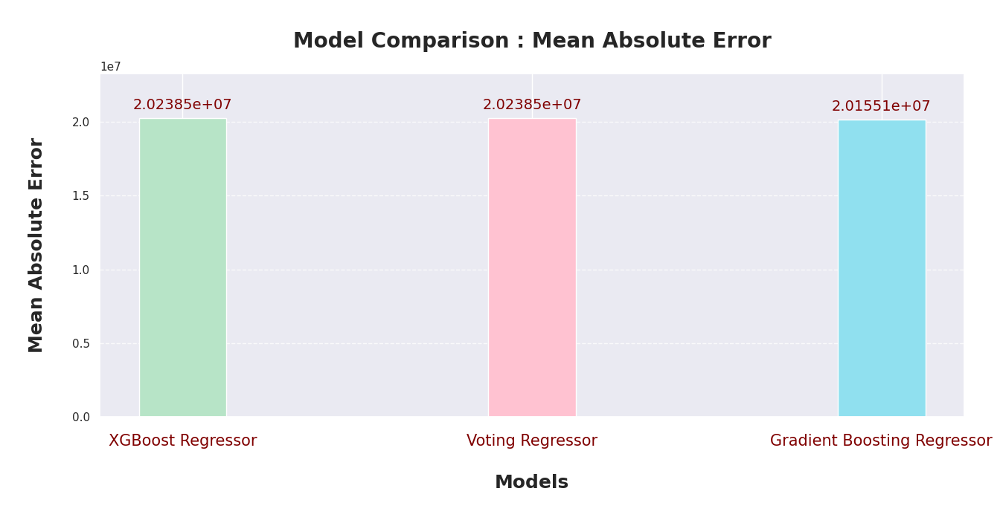

In [78]:
models = ['XGBoost Regressor', 'Voting Regressor', 'Gradient Boosting Regressor']
mae_scores = [xgb_['Mean Absolute Error'], vot_['Mean Absolute Error'], gbr_['Mean Absolute Error']]
max_value = max(mae_scores)

plt.figure(figsize=(15, 6))
bars = plt.bar(models, mae_scores, width=0.25, color=['#b7e4c7', '#ffc2d1', '#90e0ef'])
plt.xlabel('Models\n', fontfamily="courier new", fontsize=18, fontweight='bold', labelpad=25)
plt.ylabel('\nMean Absolute Error', fontfamily="courier new", fontsize=18, fontweight='bold', labelpad=25)
plt.title('\nModel Comparison : Mean Absolute Error', fontfamily="Courier New", fontsize=20, fontweight='bold', pad=25)
plt.ylim(0, max_value * 1.15)
plt.grid(axis='y', linestyle='--', alpha=0.75)
plt.xticks(rotation=0, y= -0.02, color='Maroon', fontfamily="courier new", fontsize=15)

for bar in bars :
    height = bar.get_height()
    sci_height = f"{height:.5e}"
    plt.text(bar.get_x() + bar.get_width()/2, height + (max_value * 0.02), sci_height, ha='center', va='bottom', fontsize=14, color='Maroon')

<br>

### **Model Comparision : Mean Squared Error**

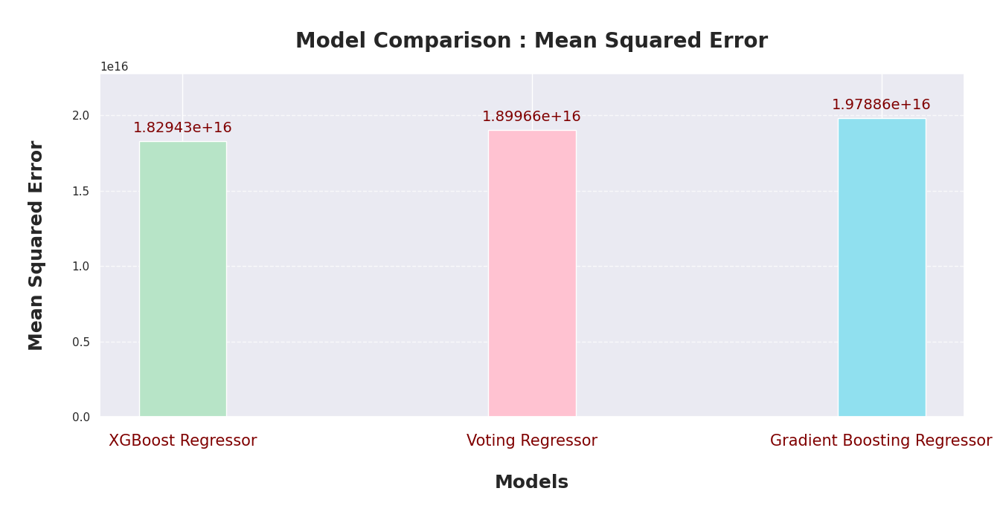

In [79]:
models = ['XGBoost Regressor', 'Voting Regressor', 'Gradient Boosting Regressor']
mse_scores = [xgb_['Mean Squared Error'], vot_['Mean Squared Error'], gbr_['Mean Squared Error']]
max_value = max(mse_scores)

plt.figure(figsize=(15, 6))
bars = plt.bar(models, mse_scores, width=0.25, color=['#b7e4c7', '#ffc2d1', '#90e0ef'])
plt.xlabel('Models\n', fontfamily="courier new", fontsize=18, fontweight='bold', labelpad=25)
plt.ylabel('\nMean Squared Error', fontfamily="courier new", fontsize=18, fontweight='bold', labelpad=25)
plt.title('\nModel Comparison : Mean Squared Error', fontfamily="Courier New", fontsize=20, fontweight='bold', pad=25)
plt.ylim(0, max_value * 1.15)
plt.grid(axis='y', linestyle='--', alpha=0.75)
plt.xticks(rotation=0, y= -0.02, color='Maroon', fontfamily="courier new", fontsize=15)

for bar in bars :
    height = bar.get_height()
    sci_height = f"{height:.5e}"
    plt.text(bar.get_x() + bar.get_width()/2, height + (max_value * 0.02), sci_height, ha='center', va='bottom', fontsize=14, color='Maroon')

<br>

### **Model Comparision : Root Mean Squared Error**

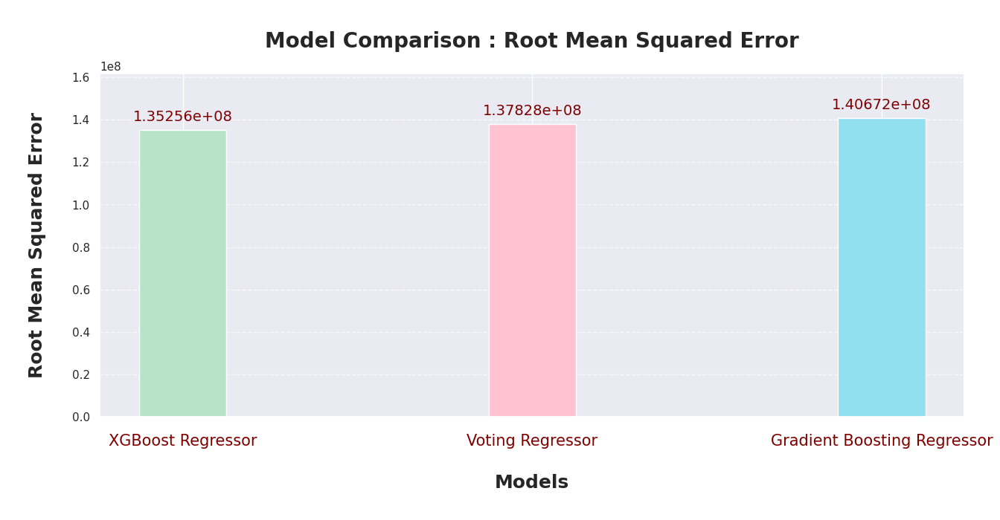

In [80]:
models = ['XGBoost Regressor', 'Voting Regressor', 'Gradient Boosting Regressor']
rmse_scores = [xgb_['Root Mean Squared Error'], vot_['Root Mean Squared Error'], gbr_['Root Mean Squared Error']]
max_value = max(rmse_scores)

plt.figure(figsize=(15, 6))
bars = plt.bar(models, rmse_scores, width=0.25, color=['#b7e4c7', '#ffc2d1', '#90e0ef'])
plt.xlabel('Models\n', fontfamily="courier new", fontsize=18, fontweight='bold', labelpad=25)
plt.ylabel('\nRoot Mean Squared Error', fontfamily="courier new", fontsize=18, fontweight='bold', labelpad=25)
plt.title('\nModel Comparison : Root Mean Squared Error', fontfamily="Courier New", fontsize=20, fontweight='bold', pad=25)
plt.ylim(0, max_value * 1.15)
plt.grid(axis='y', linestyle='--', alpha=0.75)
plt.xticks(rotation=0, y= -0.02, color='Maroon', fontfamily="courier new", fontsize=15)

for bar in bars :
    height = bar.get_height()
    sci_height = f"{height:.5e}"
    plt.text(bar.get_x() + bar.get_width()/2, height + (max_value * 0.02), sci_height, ha='center', va='bottom', fontsize=14, color='Maroon')

<br>

### **Model Comparision : R2 Score**

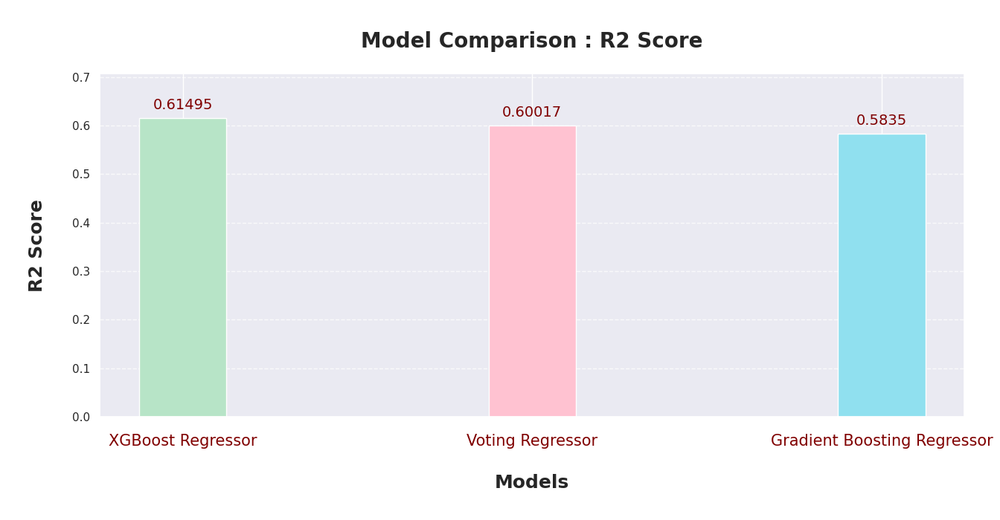

In [81]:
models = ['XGBoost Regressor', 'Voting Regressor', 'Gradient Boosting Regressor']
r2_scores = [xgb_['R2 Score'], vot_['R2 Score'], gbr_['R2 Score']]
max_value = max(r2_scores)

plt.figure(figsize=(15, 6))
bars = plt.bar(models, r2_scores, width=0.25, color=['#b7e4c7', '#ffc2d1', '#90e0ef'])
plt.xlabel('Models\n', fontfamily="courier new", fontsize=18, fontweight='bold', labelpad=25)
plt.ylabel('\nR2 Score', fontfamily="courier new", fontsize=18, fontweight='bold', labelpad=25)
plt.title('\nModel Comparison : R2 Score', fontfamily="Courier New", fontsize=20, fontweight='bold', pad=25)
plt.ylim(0, max_value * 1.15)
plt.grid(axis='y', linestyle='--', alpha=0.75)
plt.xticks(rotation=0, y= -0.02, color='Maroon', fontfamily="courier new", fontsize=15)

for bar in bars :
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + (max_value * 0.02), round(height, 5), ha='center', va='bottom', fontsize=14, color='Maroon')

<br>

### **Best Model**
<br>

* XGBoost Regressor performs best overall and has least Mean Squarred Error.

* Thus, `XGBoost Regressor` is the best model.

<br><br>

## **Thankyou And Have A Nice Day !**

## ***********************************************************************